In this tutorial we extend on tutorial 4 by presenting some short notations available within MrBeam, studying a sparser array (EHT2022) and discuss some refinement steps. The first steps are analog to tutorial 4.

In [1]:
#-------------------------------------------------------------------------------
# Modules
#-------------------------------------------------------------------------------
import ehtim as eh
import numpy as np

import logging

from imagingbase.minimization_handler import MinimizationHandler

import ehtplot.color
cfun = 'afmhot_u'

import pathlib 
current_path = str(pathlib.Path().absolute())

logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s %(levelname)s %(name)-20s :: %(message)s'
)

Welcome to eht-imaging! v 1.2.6 



In [2]:
#-------------------------------------------------------------------------------
# Fixed imaging parameters
#-------------------------------------------------------------------------------
ttype     = 'direct'            # Type of Fourier transform ('direct', 'nfft', or 'fast')

zbl       = 0.6                 # Total compact flux density (Jy)
npix      = 64                 # Number of pixels across the reconstructed image
fov       = 256*eh.RADPERUAS    # Field of view of the reconstructed image

#data weights
data_term = {'amp'    : 0.2,    # visibility amplitudes
             'cphase' : 1.0,    # closure phases
             'logcamp': 1.0}    # log closure amplitudes

prior_fwhm = 40.0*eh.RADPERUAS  # Gaussian prior FWHM (radians)
rescaling = 0.0002              # rescale intensities per pixel to obtain values of the order ~1

cbar_lims = [0, 1*10**10]       #cbar-lims for interactive plotting (brightness temperature)

Loading uvfits:  /homes/hmueller/mrbeam/mr_beam/examples/../synthetic_data/ring_eht2022_averaged.uvfits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
No NX table in uvfits!
Loading fits image:  /homes/hmueller/mrbeam/mr_beam/examples/../synthetic_data/ring.fits


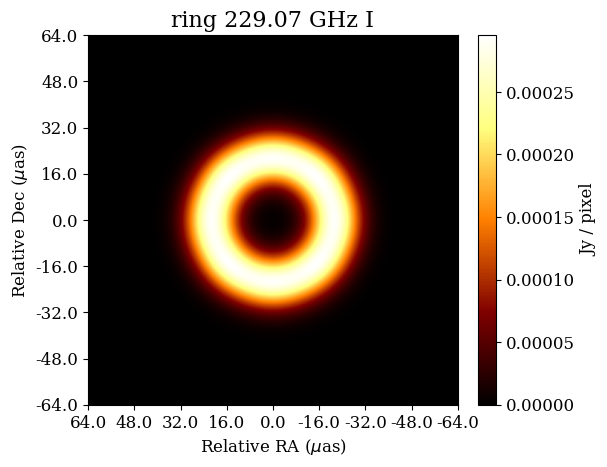

In [3]:
obs_sc = eh.obsdata.load_uvfits(current_path+r'/../synthetic_data/ring_eht2022_averaged.uvfits')
exact_solution = eh.image.load_fits(current_path+r'/../synthetic_data/ring.fits')

exact_solution.display()

res = obs_sc.res()

In [4]:
prior = eh.image.make_square(obs_sc, npix, fov) #prior image, make a prior image
prior = prior.add_gauss(zbl, (prior_fwhm, prior_fwhm, 0, 0, 0))

Again we define widths of the wavelets manually by powers of 2.

In [5]:
#------------------------------------------------------------------------------
# Prepare Minimization Procedure
#------------------------------------------------------------------------------
#threshold for identifying gaps in uv-coverage
threshold = 0.01*10**9
#specify widths of wavelezs manually
widths = np.array([1, 2, 4, 6, 8, 12, 16])
#the final handler for the minimization procedure
handler = MinimizationHandler(res, npix, fov, obs_sc, prior, zbl, rescaling, data_term, cbar_lims, threshold, [], [], widths=widths) 
#widths of wavelet filters
widths = handler.widths

Generating I image...
Generating I image...
Generating I image...
Generating I image...


The dirty image defines a proper first approximation to the true image structure and can be used as an initial guess. Moreover, we add a grid search for the best hard thresholds (proximal point operator of l0-penalty term is hard thresholding) per scale to minimize the objective functional of DoG-HiT (data fidelity term of closure quantities + l0 penalization on wavelets). This step finds a proper initial guess for the multiresolution support and helps global convergence, in particular for sparse arrays.

We use  5 scales with threshold 0.5
Current minimum 1639.112179372062
Start optimization with thresholds [1.e+04 5.e-01 5.e-01 5.e-01 5.e-01 5.e-01 5.e-01]
reverse mode: True
Updated at scale 1 to threshold 0.0 to minimum 1277.4970144651804
Updated at scale 4 to threshold 1.0 to minimum 1250.7355732709964


2023-10-18 15:05:57,657 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:05:57,658 INFO Display              :: Penalty--> 1882.4050918261955


We use thresholds:  [1.e+04 0.e+00 5.e-01 5.e-01 1.e+00 5.e-01 5.e-01]


2023-10-18 15:05:57,803 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:05:57,805 INFO Display              :: Penalty--> 1830.12023147802
2023-10-18 15:05:57,946 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:05:57,948 INFO Display              :: Penalty--> 1820.5961197125146
2023-10-18 15:05:58,087 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:05:58,088 INFO Display              :: Penalty--> 1807.5253916054153
2023-10-18 15:05:58,231 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:05:58,232 INFO Display              :: Penalty--> 1791.6610623599408
2023-10-18 15:05:58,374 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:05:58,376 INFO Display              :: Penalty--> 1779.2436673159982
2023-10-18 15:05:58,518 INFO CountIterations      :: iteration = 7 / 25
2023-10-18 15:05:58,520 INFO Display              :: Penalty--> 1766.7780082345223
2023-10-18 15:05:58,662 INFO CountIterations      :: iteration = 8 / 25


311.9388460587214
Data Fidelity:  348.9173970525982


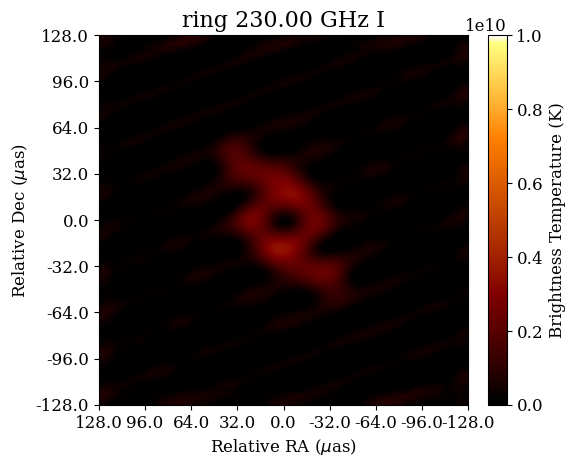

In [6]:
#Use dirty image as input image
img = obs_sc.dirtyimage(npix+1, fov)
data = handler.convert.ehtim_to_numpy(img)/rescaling

#Regularization parameters
alpha = 0.5
tau = 0.01

#Grid based search for best thresholds (l0 penalization) scale by scale 
init = handler.find_initial_guess(data, alpha)

#Define multiscalar weighting, flux transporting smoothing scale not supressed 
noise_levels = handler.noise_levels

wtfcts = handler.second_round(init, tau, alpha*noise_levels, maxiter=1, max_iterations=25, display=True)

reco = handler.op(wtfcts)
img = handler.wrapper.formatoutput(reco)

There is the shorter command handler.second_round_minimization that includes handler.find_initial_guess and handler.second_round for a more compact writing of the code. Again, we blur the image by the resolution and repeat the minimization to help global convergence.

We use  6 scales with threshold 4.0
Current minimum 1764.7457972201985
Start optimization with thresholds [4. 4. 4. 4. 4. 4. 4.]
reverse mode: True
Updated at scale 0 to threshold 7.5 to minimum 1741.8335007428611
Updated at scale 0 to threshold 8.0 to minimum 1628.5149156555726
Updated at scale 0 to threshold 8.5 to minimum 1622.808610803664
Updated at scale 0 to threshold 9.5 to minimum 1599.699256853537
Updated at scale 1 to threshold 7.0 to minimum 1598.888274339033
Updated at scale 1 to threshold 7.5 to minimum 1588.051687026886
Updated at scale 1 to threshold 8.0 to minimum 1454.359794032446
Updated at scale 1 to threshold 9.0 to minimum 1449.8140447811147
Updated at scale 2 to threshold 4.5 to minimum 1427.841712087696
Updated at scale 3 to threshold 2.5 to minimum 1411.7876059792325
Updated at scale 4 to threshold 4.5 to minimum 1399.0252304550684
Updated at scale 5 to threshold 1.0 to minimum 1398.5876524365613
Updated at scale 5 to threshold 1.5 to minimum 1395.9283945448874


2023-10-18 15:06:59,416 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:06:59,418 INFO Display              :: Penalty--> 204.91862712564503


Updated at scale 6 to threshold 9.5 to minimum 1209.9467584310753
We use thresholds:  [9.5 9.  4.5 2.5 4.5 2.  9.5]


2023-10-18 15:06:59,580 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:06:59,581 INFO Display              :: Penalty--> 200.84300191308606
2023-10-18 15:06:59,732 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:06:59,734 INFO Display              :: Penalty--> 199.37210080181475
2023-10-18 15:06:59,897 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:06:59,903 INFO Display              :: Penalty--> 198.3026327515893
2023-10-18 15:07:00,045 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:00,048 INFO Display              :: Penalty--> 196.64020941569996
2023-10-18 15:07:00,201 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:00,204 INFO Display              :: Penalty--> 196.48699024892727
2023-10-18 15:07:00,385 INFO CountIterations      :: iteration = 7 / 25
2023-10-18 15:07:00,386 INFO Display              :: Penalty--> 195.95378812650765
2023-10-18 15:07:00,526 INFO CountIterations      :: iteration = 8 / 25

1091.3963597661448
Data Fidelity:  218.87529245993022


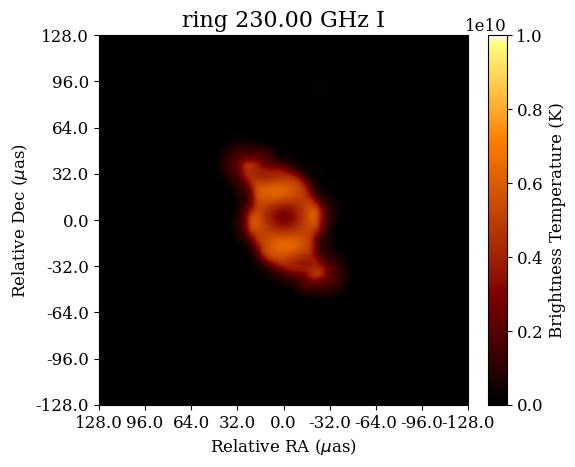

2023-10-18 15:07:03,765 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:03,767 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:03,926 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:03,928 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:04,061 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:04,062 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:04,234 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:04,235 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:04,359 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:04,361 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:04,474 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:04,476 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:04,593 INFO CountIterations      :: iteration = 7 / 2

2995.9225071818773
Data Fidelity:  190.3023713499485


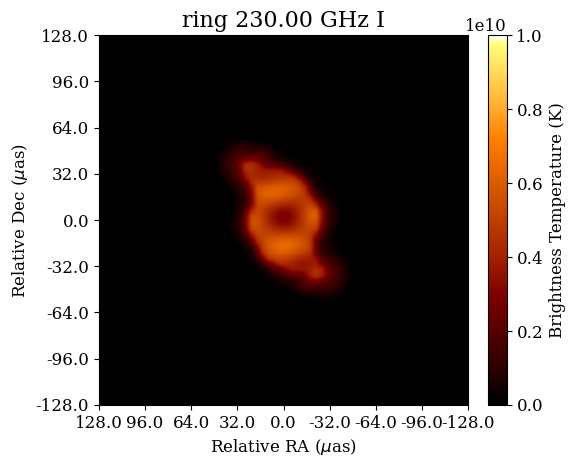

2023-10-18 15:07:07,561 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:07,562 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:07,703 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:07,704 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:07,843 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:07,845 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:07,983 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:07,985 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:08,125 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:08,127 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:08,265 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:08,266 INFO Display              :: Penalty--> 187.84850865296502
2023-10-18 15:07:08,428 INFO CountIterations      :: iteration = 7 / 2

2996.551162696572
Data Fidelity:  178.4365087427703


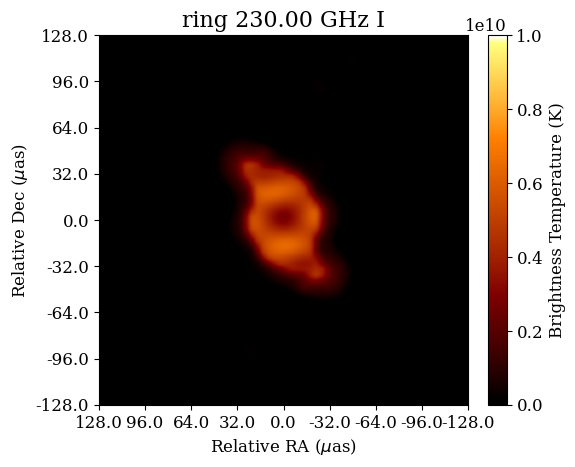

2023-10-18 15:07:12,039 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:12,040 INFO Display              :: Penalty--> 187.78722098625593
2023-10-18 15:07:12,202 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:12,203 INFO Display              :: Penalty--> 187.78722098625593
2023-10-18 15:07:12,341 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:12,342 INFO Display              :: Penalty--> 187.78722098625593
2023-10-18 15:07:12,502 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:12,504 INFO Display              :: Penalty--> 187.78722098625593
2023-10-18 15:07:12,675 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:12,678 INFO Display              :: Penalty--> 187.78722098625593
2023-10-18 15:07:12,814 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:12,816 INFO Display              :: Penalty--> 187.78722098625593
2023-10-18 15:07:12,955 INFO CountIterations      :: iteration = 7 / 2

2996.8711252271473
Data Fidelity:  168.97919963397885


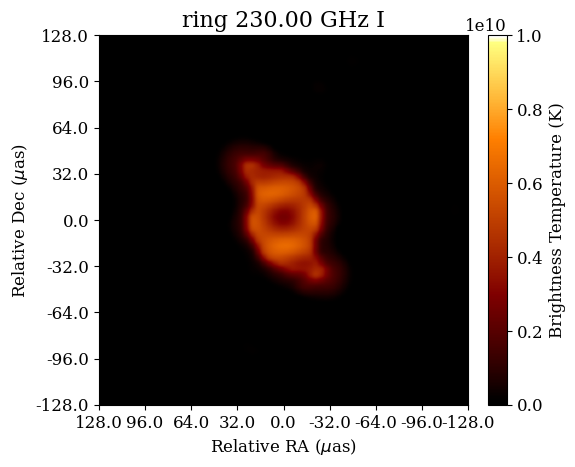

2023-10-18 15:07:16,123 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:16,125 INFO Display              :: Penalty--> 187.66311346117007
2023-10-18 15:07:16,255 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:16,256 INFO Display              :: Penalty--> 187.66311346117007
2023-10-18 15:07:16,388 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:16,390 INFO Display              :: Penalty--> 187.66311346117007
2023-10-18 15:07:16,537 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:16,538 INFO Display              :: Penalty--> 187.63246962781554
2023-10-18 15:07:16,686 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:16,688 INFO Display              :: Penalty--> 187.63246962781554
2023-10-18 15:07:16,820 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:16,822 INFO Display              :: Penalty--> 187.63246962781554
2023-10-18 15:07:17,006 INFO CountIterations      :: iteration = 7 / 2

2997.120577858559
Data Fidelity:  161.12938660714653


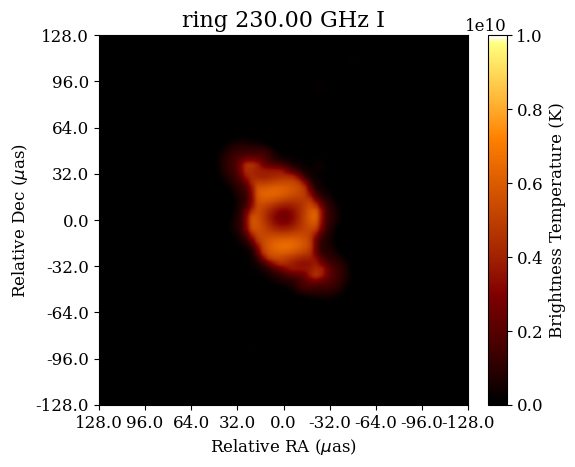

2023-10-18 15:07:20,165 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:20,167 INFO Display              :: Penalty--> 187.3857873472608
2023-10-18 15:07:20,312 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:20,314 INFO Display              :: Penalty--> 187.3857873472608
2023-10-18 15:07:20,444 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:20,445 INFO Display              :: Penalty--> 187.35514351390626
2023-10-18 15:07:20,597 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:20,598 INFO Display              :: Penalty--> 187.35514351390626
2023-10-18 15:07:20,734 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:20,736 INFO Display              :: Penalty--> 187.35514351390626
2023-10-18 15:07:20,879 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:20,880 INFO Display              :: Penalty--> 187.35514351390626
2023-10-18 15:07:21,022 INFO CountIterations      :: iteration = 7 / 25


2997.3015906826663
Data Fidelity:  154.4955013591089


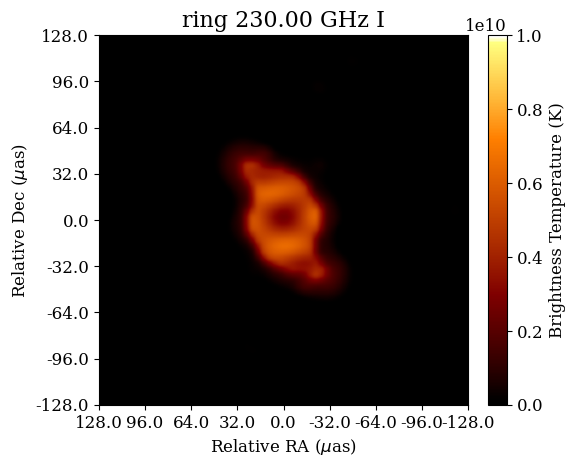

2023-10-18 15:07:24,031 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:24,032 INFO Display              :: Penalty--> 187.25401886383628
2023-10-18 15:07:24,160 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:24,161 INFO Display              :: Penalty--> 187.25401886383628
2023-10-18 15:07:24,289 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:24,291 INFO Display              :: Penalty--> 187.25401886383628
2023-10-18 15:07:24,454 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:24,456 INFO Display              :: Penalty--> 187.23563256382357
2023-10-18 15:07:24,611 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:24,612 INFO Display              :: Penalty--> 187.23563256382357
2023-10-18 15:07:24,764 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:24,766 INFO Display              :: Penalty--> 187.20498873046904
2023-10-18 15:07:24,899 INFO CountIterations      :: iteration = 7 / 2

2997.4752245778827
Data Fidelity:  148.67680875358823


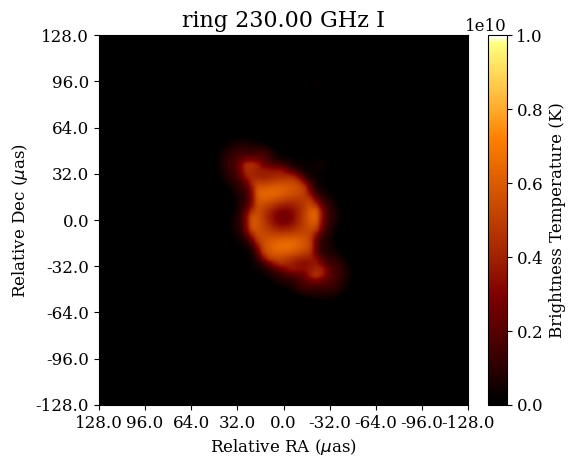

2023-10-18 15:07:28,023 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:28,024 INFO Display              :: Penalty--> 187.10233188873136
2023-10-18 15:07:28,160 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:28,162 INFO Display              :: Penalty--> 187.09160654705727
2023-10-18 15:07:28,294 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:28,295 INFO Display              :: Penalty--> 187.09160654705727
2023-10-18 15:07:28,427 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:28,429 INFO Display              :: Penalty--> 187.08088120538318
2023-10-18 15:07:28,566 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:28,567 INFO Display              :: Penalty--> 187.08088120538318
2023-10-18 15:07:28,723 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:28,725 INFO Display              :: Penalty--> 187.08088120538318
2023-10-18 15:07:28,857 INFO CountIterations      :: iteration = 7 / 2

2997.676031893382
Data Fidelity:  143.52270421771095


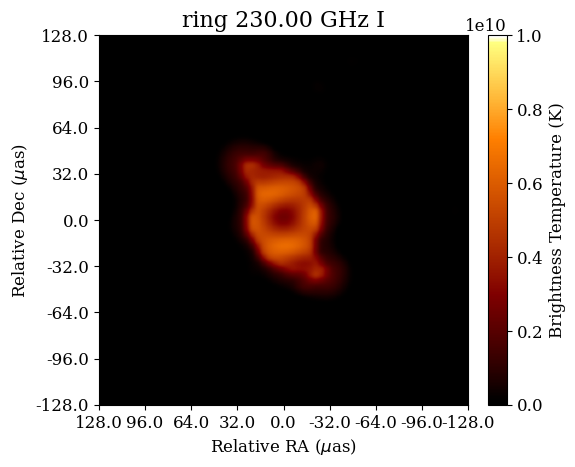

2023-10-18 15:07:31,895 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:31,897 INFO Display              :: Penalty--> 186.98894970531958
2023-10-18 15:07:32,046 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:32,047 INFO Display              :: Penalty--> 186.98894970531958
2023-10-18 15:07:32,179 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:32,181 INFO Display              :: Penalty--> 186.98894970531958
2023-10-18 15:07:32,357 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:32,359 INFO Display              :: Penalty--> 186.98894970531958
2023-10-18 15:07:32,493 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:32,495 INFO Display              :: Penalty--> 186.98894970531958
2023-10-18 15:07:32,628 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:32,629 INFO Display              :: Penalty--> 186.98894970531958
2023-10-18 15:07:32,762 INFO CountIterations      :: iteration = 7 / 2

2997.83987554949
Data Fidelity:  138.75622477237593


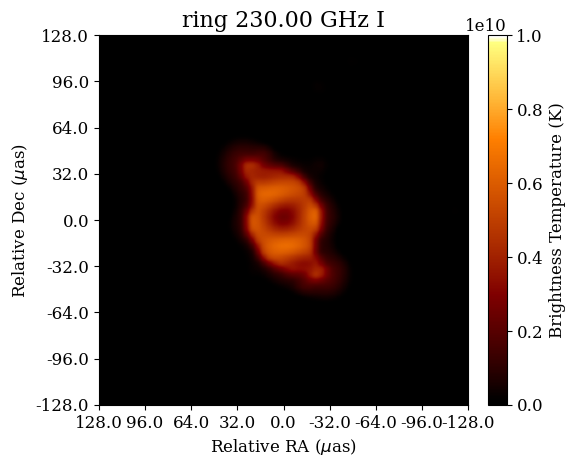

2023-10-18 15:07:35,652 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:35,654 INFO Display              :: Penalty--> 186.4434912054567
2023-10-18 15:07:35,782 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:35,783 INFO Display              :: Penalty--> 186.4434912054567
2023-10-18 15:07:35,913 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:35,915 INFO Display              :: Penalty--> 186.4434912054567
2023-10-18 15:07:36,042 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:36,044 INFO Display              :: Penalty--> 186.4434912054567
2023-10-18 15:07:36,195 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:36,196 INFO Display              :: Penalty--> 186.41284737210214
2023-10-18 15:07:36,350 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:36,352 INFO Display              :: Penalty--> 186.41284737210214
2023-10-18 15:07:36,514 INFO CountIterations      :: iteration = 7 / 25
20

2997.958233034966
Data Fidelity:  134.47928885537686


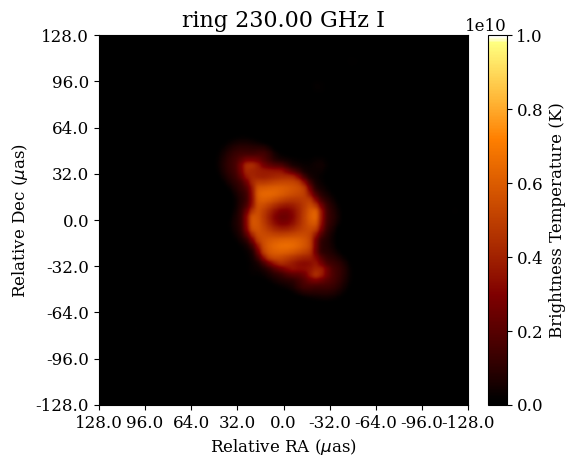

2023-10-18 15:07:39,548 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:39,550 INFO Display              :: Penalty--> 186.08342674149017
2023-10-18 15:07:39,690 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:39,692 INFO Display              :: Penalty--> 186.05278290813564
2023-10-18 15:07:39,843 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:39,845 INFO Display              :: Penalty--> 186.05278290813564
2023-10-18 15:07:39,980 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:39,983 INFO Display              :: Penalty--> 186.05278290813564
2023-10-18 15:07:40,114 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:40,116 INFO Display              :: Penalty--> 186.02213907478108
2023-10-18 15:07:40,263 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:40,266 INFO Display              :: Penalty--> 186.02213907478108
2023-10-18 15:07:40,410 INFO CountIterations      :: iteration = 7 / 2

2998.071715650287
Data Fidelity:  130.59033216579456


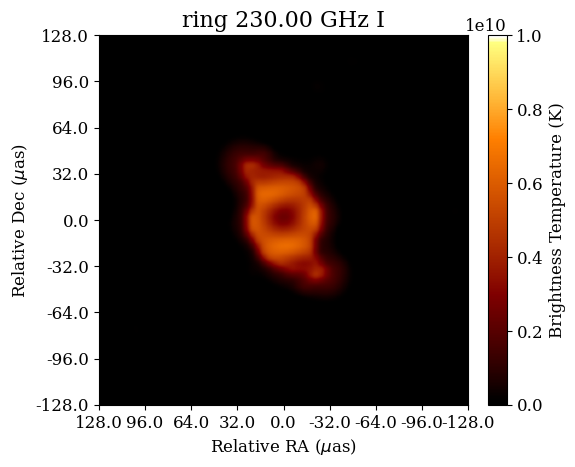

2023-10-18 15:07:43,450 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:43,451 INFO Display              :: Penalty--> 185.93020757471749
2023-10-18 15:07:43,605 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:43,606 INFO Display              :: Penalty--> 185.93020757471749
2023-10-18 15:07:43,735 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:43,736 INFO Display              :: Penalty--> 185.93020757471749
2023-10-18 15:07:43,865 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:43,866 INFO Display              :: Penalty--> 185.93020757471749
2023-10-18 15:07:43,995 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:43,997 INFO Display              :: Penalty--> 185.93020757471749
2023-10-18 15:07:44,146 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:44,148 INFO Display              :: Penalty--> 185.93020757471749
2023-10-18 15:07:44,279 INFO CountIterations      :: iteration = 7 / 2

2998.1802792909175
Data Fidelity:  127.02368217569979


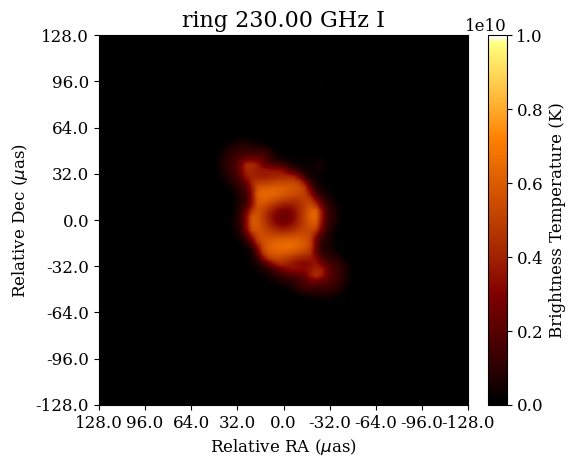

2023-10-18 15:07:47,182 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:47,184 INFO Display              :: Penalty--> 185.89956374136295
2023-10-18 15:07:47,332 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:47,333 INFO Display              :: Penalty--> 185.89956374136295
2023-10-18 15:07:47,463 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:47,465 INFO Display              :: Penalty--> 185.89956374136295
2023-10-18 15:07:47,684 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:47,686 INFO Display              :: Penalty--> 185.86891990800842
2023-10-18 15:07:47,817 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:47,818 INFO Display              :: Penalty--> 185.86891990800842
2023-10-18 15:07:47,967 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:47,969 INFO Display              :: Penalty--> 185.86891990800842
2023-10-18 15:07:48,117 INFO CountIterations      :: iteration = 7 / 2

2998.2234484207074
Data Fidelity:  123.60595770017706


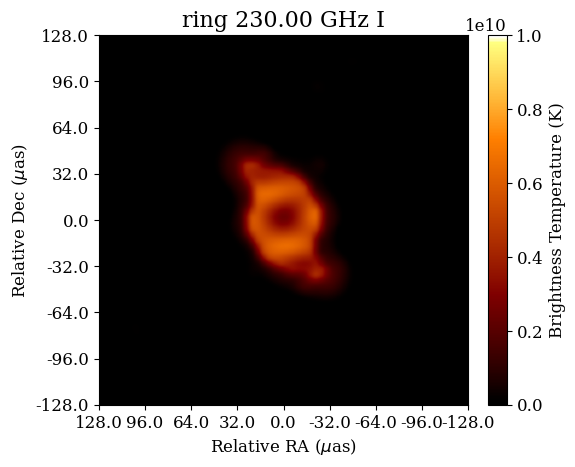

2023-10-18 15:07:51,094 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:51,095 INFO Display              :: Penalty--> 185.46901903863028
2023-10-18 15:07:51,230 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:51,231 INFO Display              :: Penalty--> 185.43837520527575
2023-10-18 15:07:51,374 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:51,375 INFO Display              :: Penalty--> 185.43837520527575
2023-10-18 15:07:51,526 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:51,528 INFO Display              :: Penalty--> 185.43071424693713
2023-10-18 15:07:51,678 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:51,680 INFO Display              :: Penalty--> 185.42305328859848
2023-10-18 15:07:51,818 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:51,821 INFO Display              :: Penalty--> 185.42305328859848
2023-10-18 15:07:51,954 INFO CountIterations      :: iteration = 7 / 2

2998.380947105992
Data Fidelity:  120.44366804432639


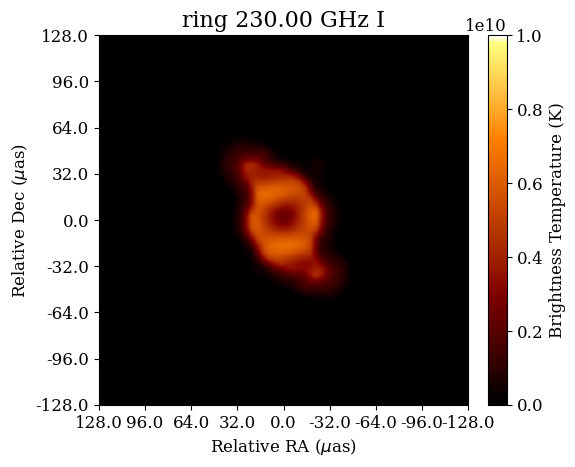

2023-10-18 15:07:55,117 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:55,119 INFO Display              :: Penalty--> 185.33112178853486
2023-10-18 15:07:55,252 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:55,253 INFO Display              :: Penalty--> 185.30047795518033
2023-10-18 15:07:55,418 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:55,420 INFO Display              :: Penalty--> 185.30047795518033
2023-10-18 15:07:55,557 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:55,560 INFO Display              :: Penalty--> 185.30047795518033
2023-10-18 15:07:55,694 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:55,697 INFO Display              :: Penalty--> 185.30047795518033
2023-10-18 15:07:55,831 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:55,833 INFO Display              :: Penalty--> 185.30047795518033
2023-10-18 15:07:55,984 INFO CountIterations      :: iteration = 7 / 2

2998.4226484991777
Data Fidelity:  117.50362936098912


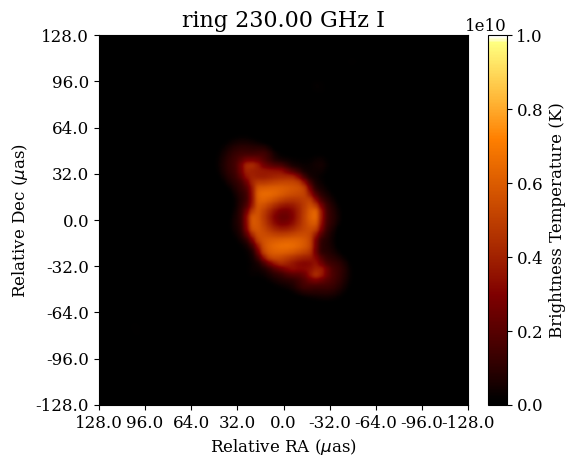

2023-10-18 15:07:59,075 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:07:59,077 INFO Display              :: Penalty--> 185.27902727183215
2023-10-18 15:07:59,224 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:07:59,226 INFO Display              :: Penalty--> 185.27902727183215
2023-10-18 15:07:59,358 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:07:59,359 INFO Display              :: Penalty--> 185.27902727183215
2023-10-18 15:07:59,492 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:07:59,494 INFO Display              :: Penalty--> 185.27902727183215
2023-10-18 15:07:59,625 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:07:59,627 INFO Display              :: Penalty--> 185.11355114966693
2023-10-18 15:07:59,774 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:07:59,776 INFO Display              :: Penalty--> 185.11355114966693
2023-10-18 15:07:59,926 INFO CountIterations      :: iteration = 7 / 2

2998.4851597676943
Data Fidelity:  114.6957720600957


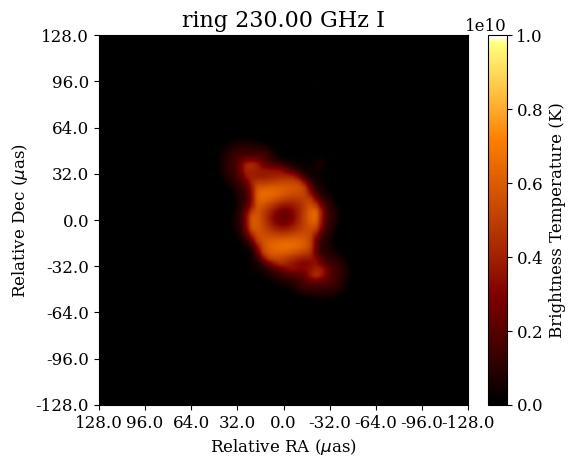

2023-10-18 15:08:02,925 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:02,927 INFO Display              :: Penalty--> 185.05226348295787
2023-10-18 15:08:03,055 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:03,056 INFO Display              :: Penalty--> 185.05226348295787
2023-10-18 15:08:03,182 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:03,183 INFO Display              :: Penalty--> 185.05226348295787
2023-10-18 15:08:03,309 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:03,310 INFO Display              :: Penalty--> 185.05226348295787
2023-10-18 15:08:03,435 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:03,437 INFO Display              :: Penalty--> 185.05226348295787
2023-10-18 15:08:03,563 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:03,564 INFO Display              :: Penalty--> 185.05226348295787
2023-10-18 15:08:03,690 INFO CountIterations      :: iteration = 7 / 2

2998.5359028867506
Data Fidelity:  112.06733579966973


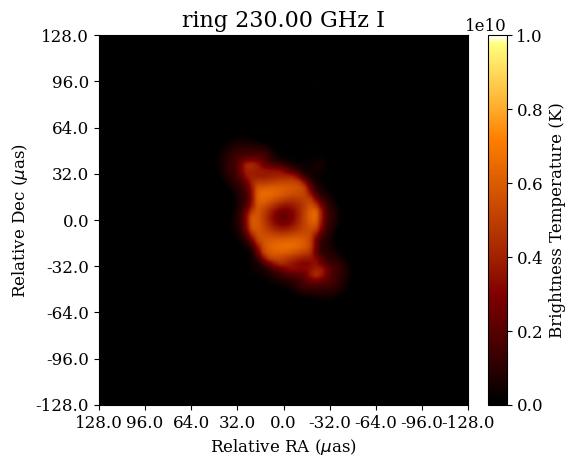

2023-10-18 15:08:06,407 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:06,408 INFO Display              :: Penalty--> 184.9725895162361
2023-10-18 15:08:06,534 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:06,535 INFO Display              :: Penalty--> 184.9725895162361
2023-10-18 15:08:06,661 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:06,662 INFO Display              :: Penalty--> 184.961864174562
2023-10-18 15:08:06,788 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:06,789 INFO Display              :: Penalty--> 184.961864174562
2023-10-18 15:08:06,915 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:06,917 INFO Display              :: Penalty--> 184.93122034120745
2023-10-18 15:08:07,042 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:07,044 INFO Display              :: Penalty--> 184.93122034120745
2023-10-18 15:08:07,169 INFO CountIterations      :: iteration = 7 / 25
2023

2998.5720143606636
Data Fidelity:  109.57960036143004


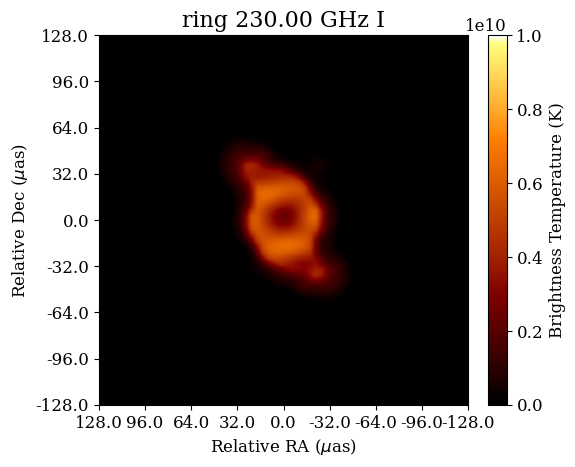

2023-10-18 15:08:09,896 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:09,897 INFO Display              :: Penalty--> 184.93122034120745
2023-10-18 15:08:10,024 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:10,025 INFO Display              :: Penalty--> 184.93122034120745
2023-10-18 15:08:10,153 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:10,155 INFO Display              :: Penalty--> 184.93122034120745
2023-10-18 15:08:10,281 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:10,283 INFO Display              :: Penalty--> 184.93122034120745
2023-10-18 15:08:10,408 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:10,410 INFO Display              :: Penalty--> 184.93122034120745
2023-10-18 15:08:10,536 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:10,537 INFO Display              :: Penalty--> 184.93122034120745
2023-10-18 15:08:10,664 INFO CountIterations      :: iteration = 7 / 2

2998.609514736196
Data Fidelity:  107.20681922080587


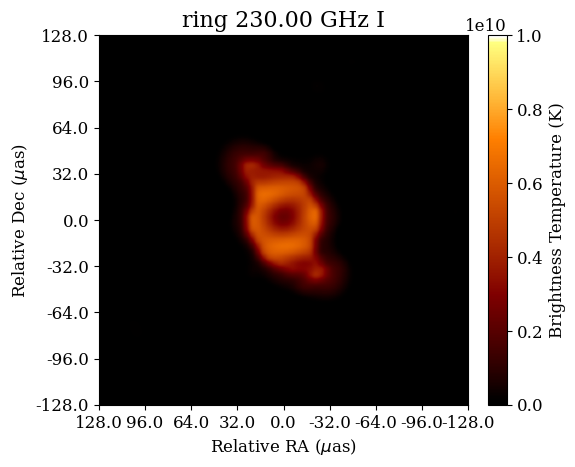

2023-10-18 15:08:13,387 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:13,388 INFO Display              :: Penalty--> 184.89291554951427
2023-10-18 15:08:13,514 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:13,515 INFO Display              :: Penalty--> 184.89291554951427
2023-10-18 15:08:13,641 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:13,643 INFO Display              :: Penalty--> 184.89291554951427
2023-10-18 15:08:13,771 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:13,773 INFO Display              :: Penalty--> 184.89291554951427
2023-10-18 15:08:13,898 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:13,900 INFO Display              :: Penalty--> 184.89291554951427
2023-10-18 15:08:14,026 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:14,027 INFO Display              :: Penalty--> 184.89291554951427
2023-10-18 15:08:14,154 INFO CountIterations      :: iteration = 7 / 2

2998.6563882711016
Data Fidelity:  104.90519063580686


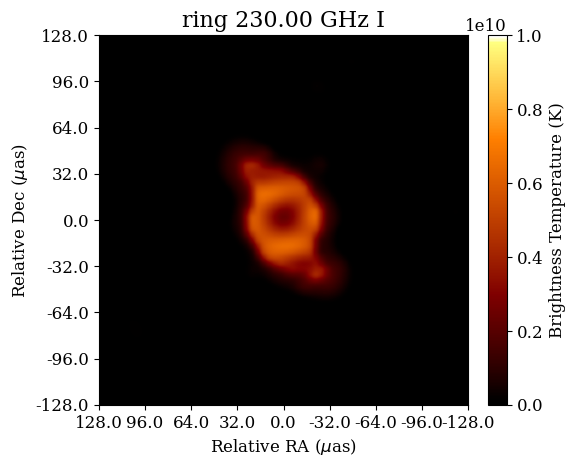

2023-10-18 15:08:16,898 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:16,900 INFO Display              :: Penalty--> 184.6554264189659
2023-10-18 15:08:17,026 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:17,028 INFO Display              :: Penalty--> 184.6554264189659
2023-10-18 15:08:17,154 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:17,156 INFO Display              :: Penalty--> 184.6554264189659
2023-10-18 15:08:17,282 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:17,283 INFO Display              :: Penalty--> 184.62478258561137
2023-10-18 15:08:17,413 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:17,415 INFO Display              :: Penalty--> 184.62478258561137
2023-10-18 15:08:17,543 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:17,544 INFO Display              :: Penalty--> 184.62478258561137
2023-10-18 15:08:17,671 INFO CountIterations      :: iteration = 7 / 25
2

2998.653053620879
Data Fidelity:  102.74777728684728


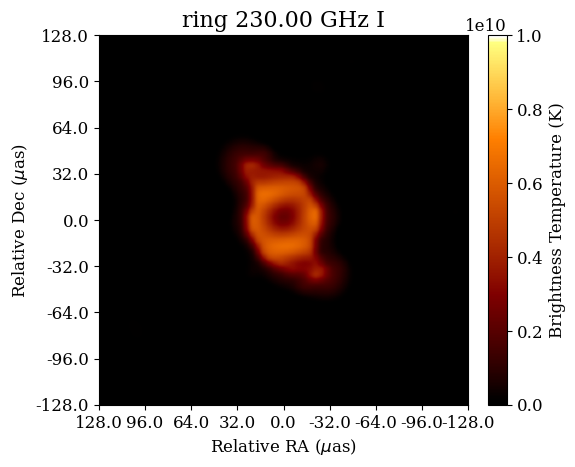

2023-10-18 15:08:20,428 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:20,431 INFO Display              :: Penalty--> 184.59413875225684
2023-10-18 15:08:20,557 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:20,560 INFO Display              :: Penalty--> 184.59413875225684
2023-10-18 15:08:20,686 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:20,688 INFO Display              :: Penalty--> 184.59413875225684
2023-10-18 15:08:20,814 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:20,815 INFO Display              :: Penalty--> 184.59413875225684
2023-10-18 15:08:20,949 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:20,951 INFO Display              :: Penalty--> 184.59413875225684
2023-10-18 15:08:21,077 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:21,079 INFO Display              :: Penalty--> 184.59413875225684
2023-10-18 15:08:21,205 INFO CountIterations      :: iteration = 7 / 2

2998.6820173796177
Data Fidelity:  100.67998758231676


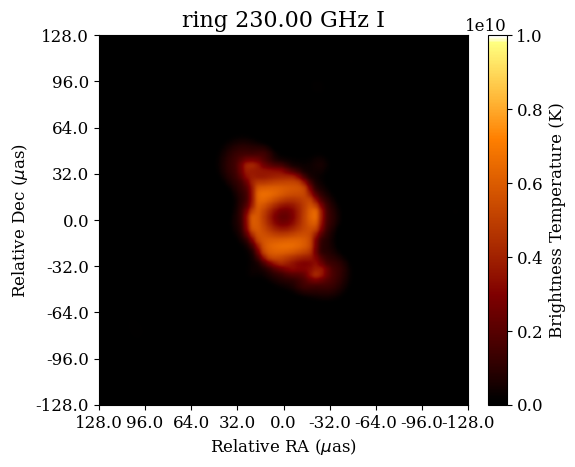

2023-10-18 15:08:23,944 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:23,946 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:24,073 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:24,074 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:24,201 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:24,203 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:24,332 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:24,334 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:24,460 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:24,462 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:24,588 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:24,589 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:24,715 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7022211771937
Data Fidelity:  98.6960789766897


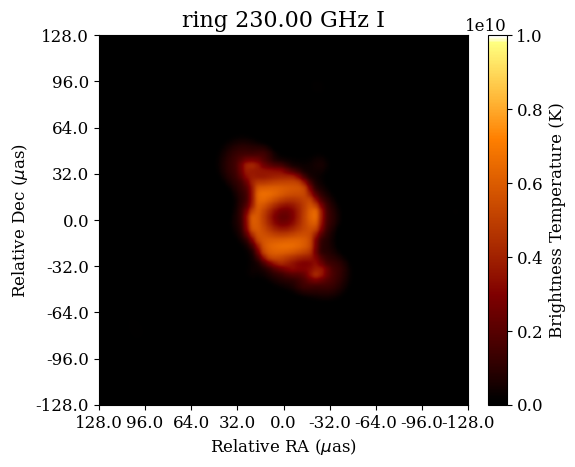

2023-10-18 15:08:27,464 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:27,465 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:27,591 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:27,593 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:27,718 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:27,719 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:27,846 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:27,847 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:27,973 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:27,975 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:28,101 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:28,103 INFO Display              :: Penalty--> 184.5221257438737
2023-10-18 15:08:28,229 INFO CountIterations      :: iteration = 7 / 25
2023

2998.717298646842
Data Fidelity:  96.78992773191464


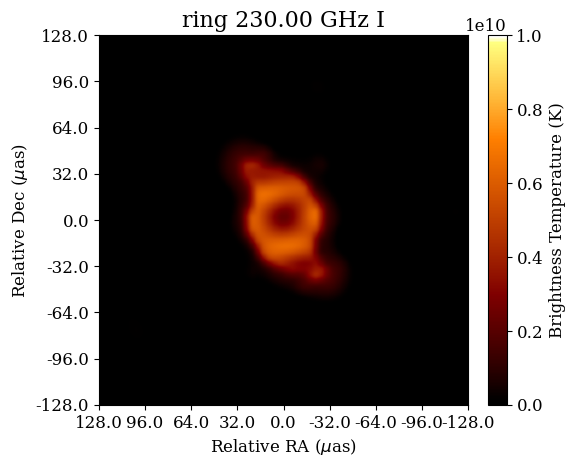

2023-10-18 15:08:30,959 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:30,960 INFO Display              :: Penalty--> 184.49148191051916
2023-10-18 15:08:31,086 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:31,088 INFO Display              :: Penalty--> 184.49148191051916
2023-10-18 15:08:31,214 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:31,215 INFO Display              :: Penalty--> 184.49148191051916
2023-10-18 15:08:31,341 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:31,343 INFO Display              :: Penalty--> 184.49148191051916
2023-10-18 15:08:31,468 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:31,469 INFO Display              :: Penalty--> 184.4608380771646
2023-10-18 15:08:31,595 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:31,596 INFO Display              :: Penalty--> 184.4608380771646
2023-10-18 15:08:31,722 INFO CountIterations      :: iteration = 7 / 25


2998.7303862229583
Data Fidelity:  94.94029106950896


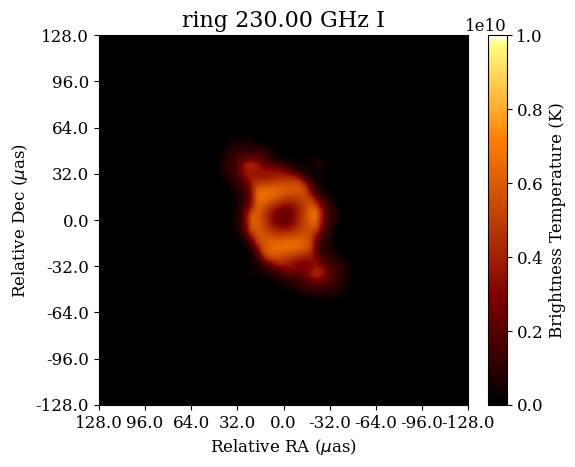

2023-10-18 15:08:34,461 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:34,462 INFO Display              :: Penalty--> 184.26471812164485
2023-10-18 15:08:34,588 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:34,590 INFO Display              :: Penalty--> 184.26471812164485
2023-10-18 15:08:34,716 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:34,717 INFO Display              :: Penalty--> 184.26471812164485
2023-10-18 15:08:34,843 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:34,844 INFO Display              :: Penalty--> 184.26471812164485
2023-10-18 15:08:34,971 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:34,973 INFO Display              :: Penalty--> 184.26471812164485
2023-10-18 15:08:35,099 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:35,100 INFO Display              :: Penalty--> 184.26471812164485
2023-10-18 15:08:35,226 INFO CountIterations      :: iteration = 7 / 2

2998.7416812495894
Data Fidelity:  93.15925270379049


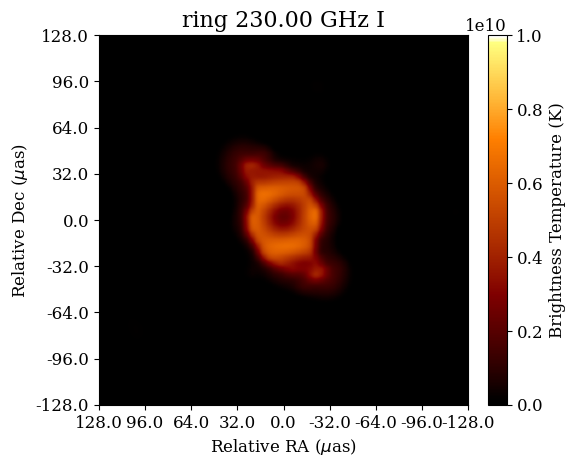

2023-10-18 15:08:37,951 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:37,952 INFO Display              :: Penalty--> 184.04714748277692
2023-10-18 15:08:38,079 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:38,080 INFO Display              :: Penalty--> 184.04714748277692
2023-10-18 15:08:38,207 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:38,209 INFO Display              :: Penalty--> 184.04714748277692
2023-10-18 15:08:38,336 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:38,337 INFO Display              :: Penalty--> 184.04714748277692
2023-10-18 15:08:38,468 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:38,469 INFO Display              :: Penalty--> 184.04714748277692
2023-10-18 15:08:38,623 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:38,624 INFO Display              :: Penalty--> 184.0165036494224
2023-10-18 15:08:38,751 INFO CountIterations      :: iteration = 7 / 25

2998.7542787640577
Data Fidelity:  91.43171687353983


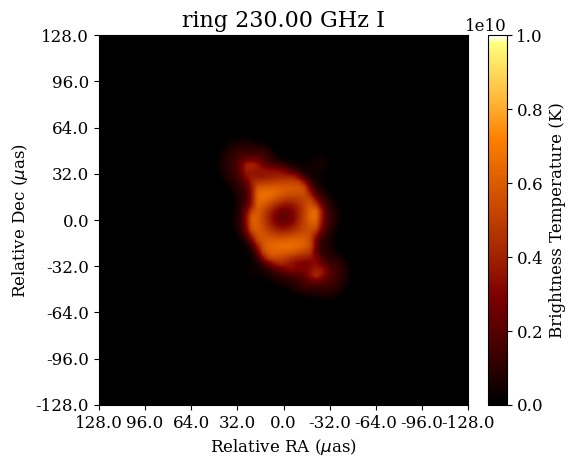

2023-10-18 15:08:41,466 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:41,468 INFO Display              :: Penalty--> 183.7897398605481
2023-10-18 15:08:41,618 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:41,620 INFO Display              :: Penalty--> 183.7897398605481
2023-10-18 15:08:41,751 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:41,752 INFO Display              :: Penalty--> 183.7897398605481
2023-10-18 15:08:41,884 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:41,886 INFO Display              :: Penalty--> 183.7897398605481
2023-10-18 15:08:42,018 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:42,019 INFO Display              :: Penalty--> 183.7897398605481
2023-10-18 15:08:42,150 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:42,152 INFO Display              :: Penalty--> 183.7897398605481
2023-10-18 15:08:42,283 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7409433570365
Data Fidelity:  89.76292741189414


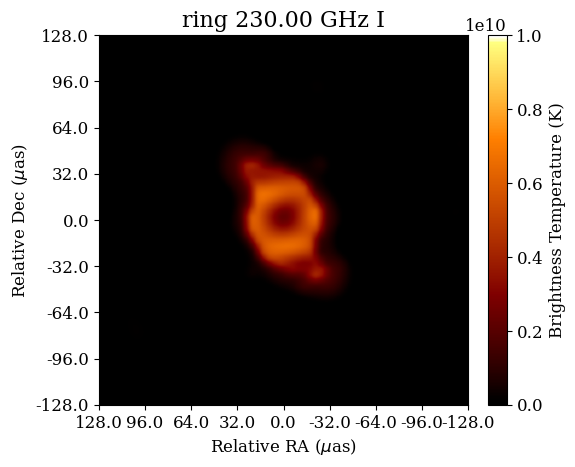

2023-10-18 15:08:45,221 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:45,223 INFO Display              :: Penalty--> 183.4710445716102
2023-10-18 15:08:45,346 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:45,348 INFO Display              :: Penalty--> 183.4710445716102
2023-10-18 15:08:45,476 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:45,477 INFO Display              :: Penalty--> 183.4710445716102
2023-10-18 15:08:45,602 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:45,603 INFO Display              :: Penalty--> 183.4710445716102
2023-10-18 15:08:45,728 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:45,730 INFO Display              :: Penalty--> 183.4710445716102
2023-10-18 15:08:45,855 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:45,856 INFO Display              :: Penalty--> 183.4710445716102
2023-10-18 15:08:45,986 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7630278827614
Data Fidelity:  88.15943818018494


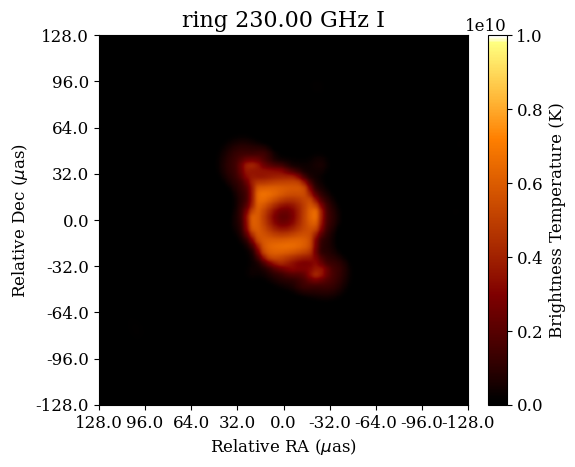

2023-10-18 15:08:48,718 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:48,719 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:48,852 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:48,853 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:48,981 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:48,982 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:49,109 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:49,110 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:49,237 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:49,238 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:49,365 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:49,366 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:49,492 INFO CountIterations      :: iteration = 7 / 2

2998.7593964429025
Data Fidelity:  86.65756495481412


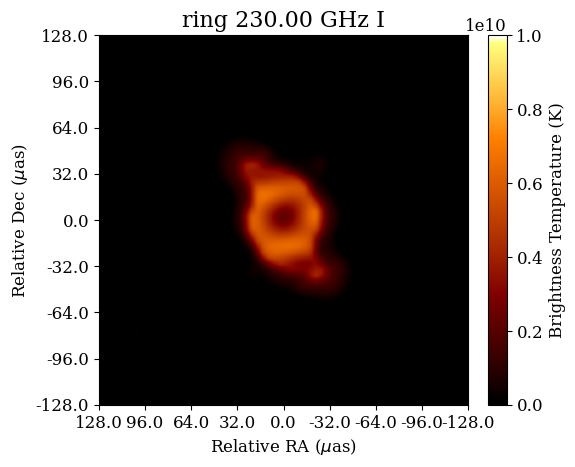

2023-10-18 15:08:52,210 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:52,212 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:52,379 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:52,381 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:52,507 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:52,508 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:52,635 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:52,636 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:52,763 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:52,765 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:52,895 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:52,897 INFO Display              :: Penalty--> 183.24428078273593
2023-10-18 15:08:53,022 INFO CountIterations      :: iteration = 7 / 2

2998.756614538406
Data Fidelity:  85.18613860287986


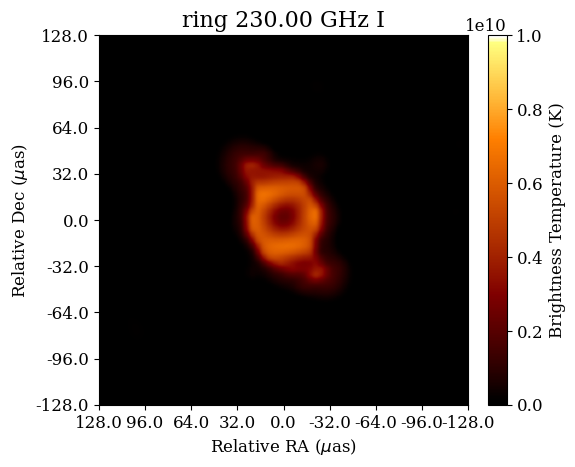

2023-10-18 15:08:55,765 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:55,767 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:55,891 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:55,893 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:56,018 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:56,020 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:56,145 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:56,147 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:56,273 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:56,275 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:56,400 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:56,402 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:56,527 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7553493786436
Data Fidelity:  83.77568505315936


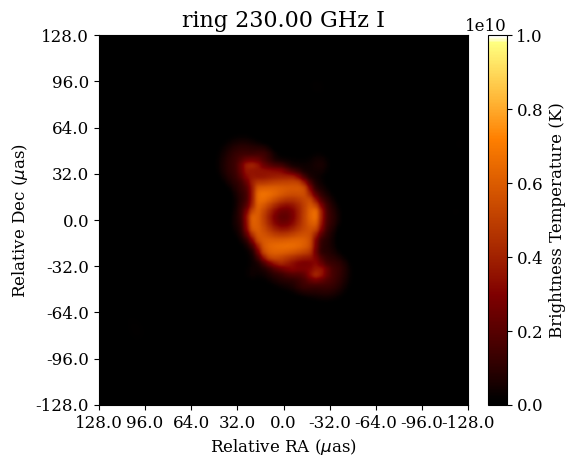

2023-10-18 15:08:59,269 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:08:59,271 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:59,397 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:08:59,398 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:59,524 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:08:59,526 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:59,652 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:08:59,653 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:59,779 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:08:59,781 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:08:59,907 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:08:59,909 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:09:00,035 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7519152853065
Data Fidelity:  82.40553930279694


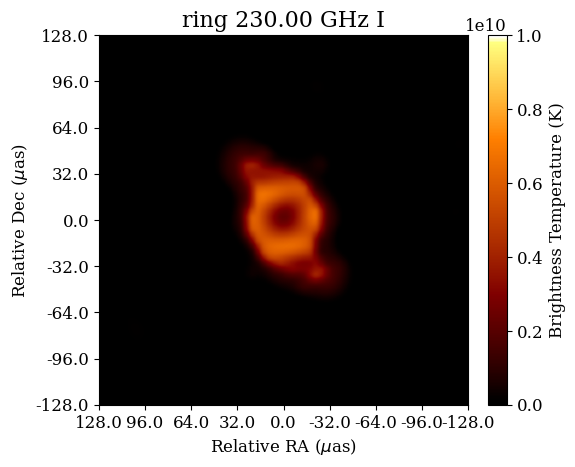

2023-10-18 15:09:02,762 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:02,763 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:09:02,890 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:02,891 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:09:03,018 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:03,019 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:09:03,146 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:03,147 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:09:03,273 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:03,275 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:09:03,401 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:03,402 INFO Display              :: Penalty--> 183.0788046605707
2023-10-18 15:09:03,529 INFO CountIterations      :: iteration = 7 / 25
2023

2998.760716866167
Data Fidelity:  81.06717188633439


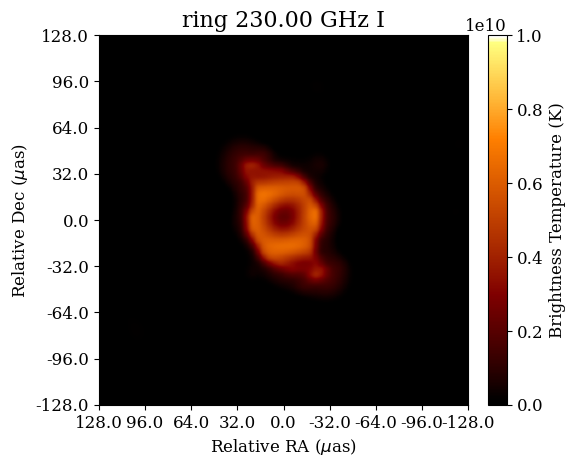

2023-10-18 15:09:06,320 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:06,321 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:06,448 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:06,449 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:06,575 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:06,576 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:06,703 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:06,704 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:06,831 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:06,832 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:06,959 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:06,960 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:07,086 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7395942393623
Data Fidelity:  79.77080153091728


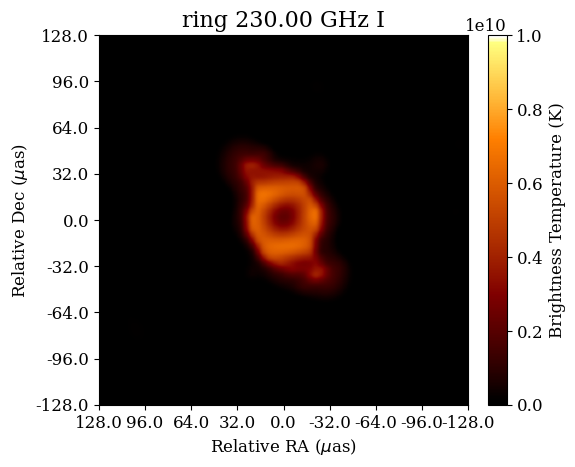

2023-10-18 15:09:09,813 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:09,814 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:09,941 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:09,942 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:10,069 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:10,070 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:10,197 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:10,198 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:10,324 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:10,326 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:10,452 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:10,453 INFO Display              :: Penalty--> 183.0374354855421
2023-10-18 15:09:10,580 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7378533678257
Data Fidelity:  78.50522128590089


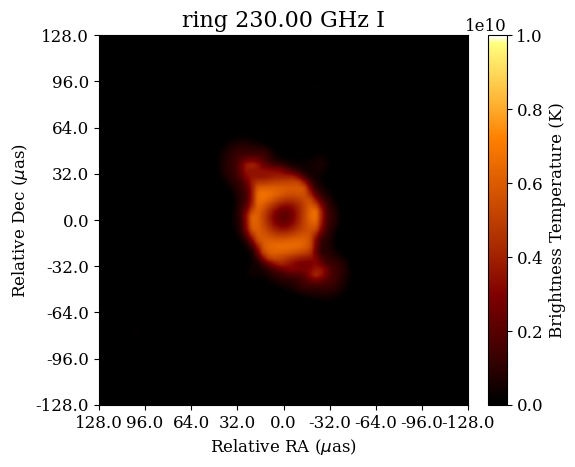

2023-10-18 15:09:13,313 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:13,315 INFO Display              :: Penalty--> 182.97614781883303
2023-10-18 15:09:13,441 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:13,442 INFO Display              :: Penalty--> 182.97614781883303
2023-10-18 15:09:13,568 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:13,569 INFO Display              :: Penalty--> 182.97614781883303
2023-10-18 15:09:13,696 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:13,698 INFO Display              :: Penalty--> 182.9455039854785
2023-10-18 15:09:13,825 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:13,826 INFO Display              :: Penalty--> 182.9455039854785
2023-10-18 15:09:13,964 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:13,966 INFO Display              :: Penalty--> 182.9455039854785
2023-10-18 15:09:14,092 INFO CountIterations      :: iteration = 7 / 25
2

2998.733776065751
Data Fidelity:  77.25627417842679


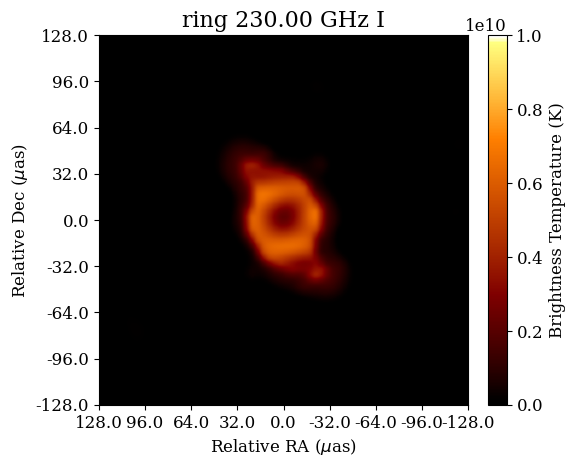

2023-10-18 15:09:16,845 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:16,846 INFO Display              :: Penalty--> 182.8842163187694
2023-10-18 15:09:16,972 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:16,973 INFO Display              :: Penalty--> 182.8842163187694
2023-10-18 15:09:17,099 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:17,101 INFO Display              :: Penalty--> 182.8842163187694
2023-10-18 15:09:17,239 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:17,241 INFO Display              :: Penalty--> 182.8842163187694
2023-10-18 15:09:17,368 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:17,369 INFO Display              :: Penalty--> 182.8842163187694
2023-10-18 15:09:17,496 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:17,498 INFO Display              :: Penalty--> 182.8842163187694
2023-10-18 15:09:17,624 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7306050404254
Data Fidelity:  76.05461361872368


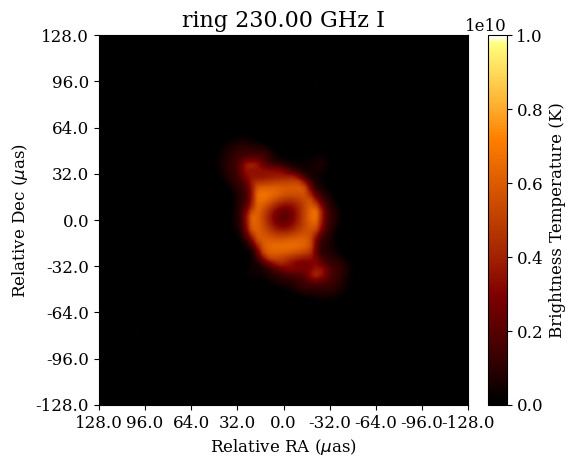

2023-10-18 15:09:20,367 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:20,368 INFO Display              :: Penalty--> 182.85357248541487
2023-10-18 15:09:20,494 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:20,495 INFO Display              :: Penalty--> 182.85357248541487
2023-10-18 15:09:20,621 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:20,624 INFO Display              :: Penalty--> 182.85357248541487
2023-10-18 15:09:20,753 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:20,754 INFO Display              :: Penalty--> 182.68809636324966
2023-10-18 15:09:20,881 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:20,883 INFO Display              :: Penalty--> 182.68809636324966
2023-10-18 15:09:21,013 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:21,014 INFO Display              :: Penalty--> 182.68809636324966
2023-10-18 15:09:21,140 INFO CountIterations      :: iteration = 7 / 2

2998.7229560922333
Data Fidelity:  74.8694998339225


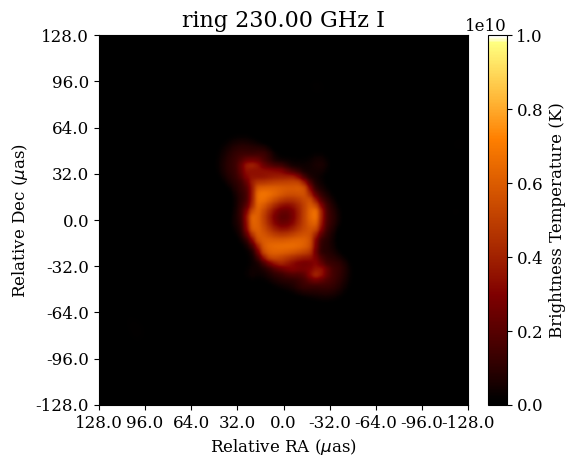

2023-10-18 15:09:23,891 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:23,892 INFO Display              :: Penalty--> 182.65745252989512
2023-10-18 15:09:24,024 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:24,026 INFO Display              :: Penalty--> 182.65745252989512
2023-10-18 15:09:24,156 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:24,158 INFO Display              :: Penalty--> 182.65745252989512
2023-10-18 15:09:24,289 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:24,291 INFO Display              :: Penalty--> 182.65745252989512
2023-10-18 15:09:24,422 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:24,424 INFO Display              :: Penalty--> 182.4919764077299
2023-10-18 15:09:24,583 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:24,586 INFO Display              :: Penalty--> 182.4919764077299
2023-10-18 15:09:24,721 INFO CountIterations      :: iteration = 7 / 25


2998.7245758389577
Data Fidelity:  73.71835048978707


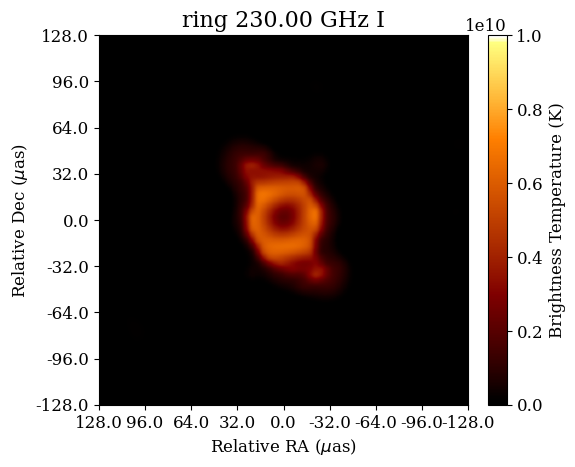

2023-10-18 15:09:27,598 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:27,600 INFO Display              :: Penalty--> 182.46133257437538
2023-10-18 15:09:27,726 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:27,728 INFO Display              :: Penalty--> 182.46133257437538
2023-10-18 15:09:27,854 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:27,856 INFO Display              :: Penalty--> 182.46133257437538
2023-10-18 15:09:27,985 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:27,986 INFO Display              :: Penalty--> 182.46133257437538
2023-10-18 15:09:28,112 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:28,114 INFO Display              :: Penalty--> 182.46133257437538
2023-10-18 15:09:28,242 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:28,244 INFO Display              :: Penalty--> 182.46133257437538
2023-10-18 15:09:28,369 INFO CountIterations      :: iteration = 7 / 2

2998.7274454211947
Data Fidelity:  72.59808883783208


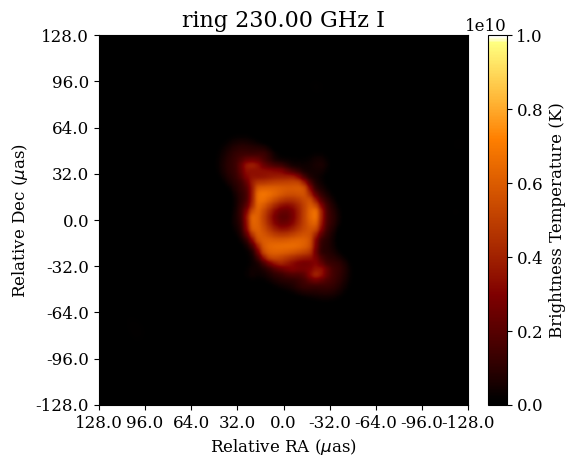

2023-10-18 15:09:31,254 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:31,256 INFO Display              :: Penalty--> 182.4000449076663
2023-10-18 15:09:31,381 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:31,382 INFO Display              :: Penalty--> 182.4000449076663
2023-10-18 15:09:31,507 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:31,508 INFO Display              :: Penalty--> 182.4000449076663
2023-10-18 15:09:31,633 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:31,634 INFO Display              :: Penalty--> 182.4000449076663
2023-10-18 15:09:31,760 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:31,762 INFO Display              :: Penalty--> 182.4000449076663
2023-10-18 15:09:31,886 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:31,887 INFO Display              :: Penalty--> 182.4000449076663
2023-10-18 15:09:32,012 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7231208574103
Data Fidelity:  71.50176931471043


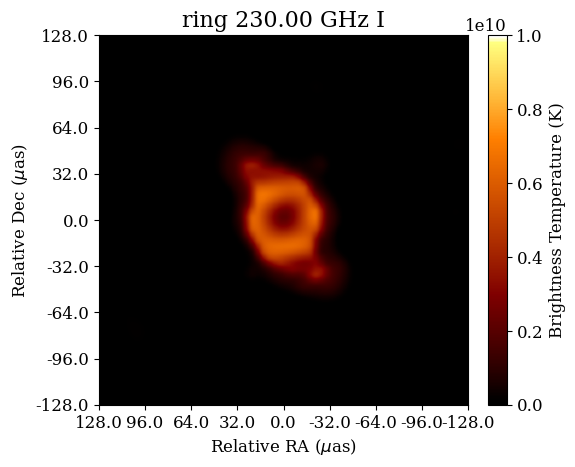

2023-10-18 15:09:34,739 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:34,740 INFO Display              :: Penalty--> 182.32803189928313
2023-10-18 15:09:34,867 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:34,869 INFO Display              :: Penalty--> 182.32803189928313
2023-10-18 15:09:34,994 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:34,996 INFO Display              :: Penalty--> 182.2973880659286
2023-10-18 15:09:35,121 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:35,123 INFO Display              :: Penalty--> 182.2973880659286
2023-10-18 15:09:35,248 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:35,250 INFO Display              :: Penalty--> 182.2973880659286
2023-10-18 15:09:35,376 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:35,377 INFO Display              :: Penalty--> 182.2973880659286
2023-10-18 15:09:35,504 INFO CountIterations      :: iteration = 7 / 25
20

2998.70644867217
Data Fidelity:  70.4354654245269


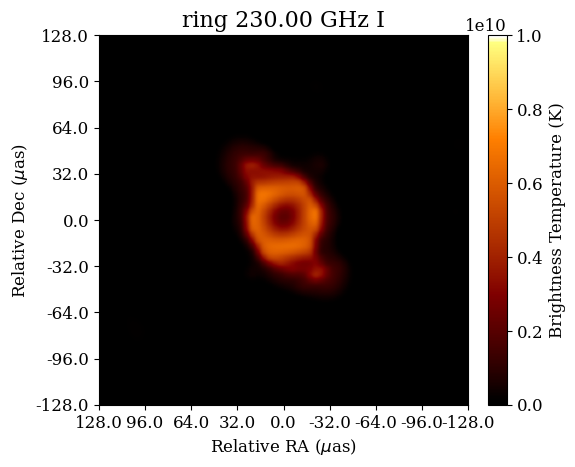

2023-10-18 15:09:38,212 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:38,213 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:38,339 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:38,340 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:38,465 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:38,466 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:38,591 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:38,593 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:38,718 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:38,719 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:38,848 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:38,849 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:38,975 INFO CountIterations      :: iteration = 7 / 2

2998.7214786385625
Data Fidelity:  69.39548234686828


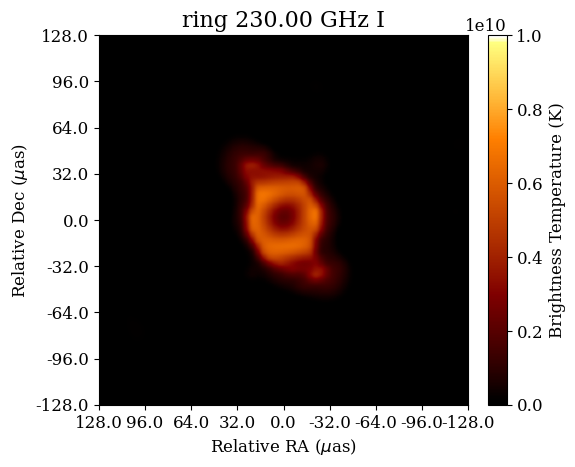

2023-10-18 15:09:41,720 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:41,723 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:41,848 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:41,850 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:41,976 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:41,978 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:42,103 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:42,105 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:42,230 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:42,231 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:42,356 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:42,358 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:42,483 INFO CountIterations      :: iteration = 7 / 2

2998.7229704970077
Data Fidelity:  68.37632235708732


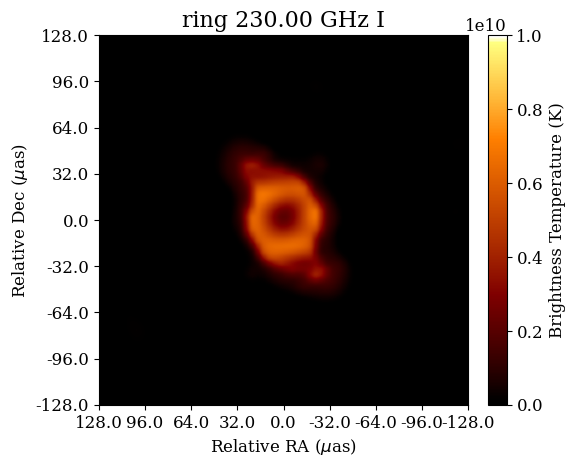

2023-10-18 15:09:45,194 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:45,196 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:45,322 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:45,323 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:45,449 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:45,451 INFO Display              :: Penalty--> 182.26674423257407
2023-10-18 15:09:45,584 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:45,585 INFO Display              :: Penalty--> 182.25601889089998
2023-10-18 15:09:45,712 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:45,713 INFO Display              :: Penalty--> 182.25601889089998
2023-10-18 15:09:45,840 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:45,842 INFO Display              :: Penalty--> 182.22537505754545
2023-10-18 15:09:45,968 INFO CountIterations      :: iteration = 7 / 2

2998.7378535953003
Data Fidelity:  67.37124035622642


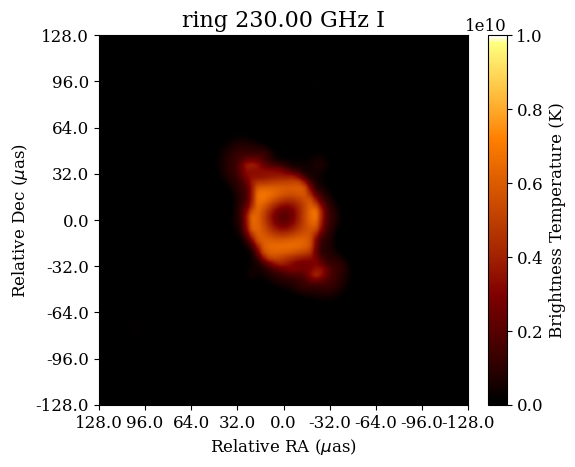

2023-10-18 15:09:48,693 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:48,694 INFO Display              :: Penalty--> 182.22537505754545
2023-10-18 15:09:48,820 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:48,821 INFO Display              :: Penalty--> 182.22537505754545
2023-10-18 15:09:48,948 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:48,950 INFO Display              :: Penalty--> 182.19473122419092
2023-10-18 15:09:49,076 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:49,078 INFO Display              :: Penalty--> 182.1640873908364
2023-10-18 15:09:49,204 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:49,205 INFO Display              :: Penalty--> 182.1640873908364
2023-10-18 15:09:49,332 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:49,333 INFO Display              :: Penalty--> 182.13344355748185
2023-10-18 15:09:49,459 INFO CountIterations      :: iteration = 7 / 25


2998.7090735430434
Data Fidelity:  66.38283031613011


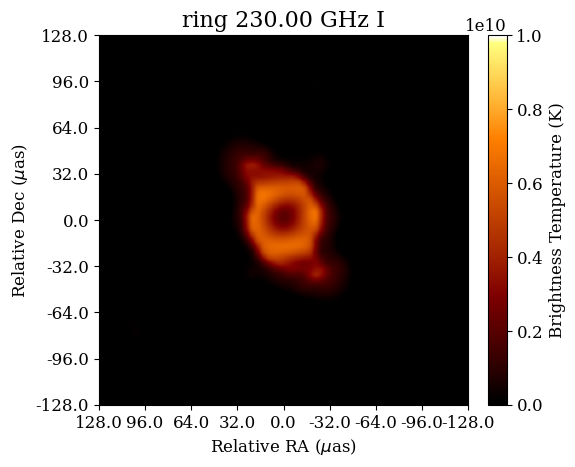

2023-10-18 15:09:52,201 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:52,203 INFO Display              :: Penalty--> 182.13344355748185
2023-10-18 15:09:52,331 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:52,332 INFO Display              :: Penalty--> 182.13344355748185
2023-10-18 15:09:52,460 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:52,461 INFO Display              :: Penalty--> 182.13344355748185
2023-10-18 15:09:52,588 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:52,590 INFO Display              :: Penalty--> 182.13344355748185
2023-10-18 15:09:52,718 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:52,719 INFO Display              :: Penalty--> 182.13344355748185
2023-10-18 15:09:52,849 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:52,850 INFO Display              :: Penalty--> 182.13344355748185
2023-10-18 15:09:52,979 INFO CountIterations      :: iteration = 7 / 2

2998.7100943999335
Data Fidelity:  65.4191445662001


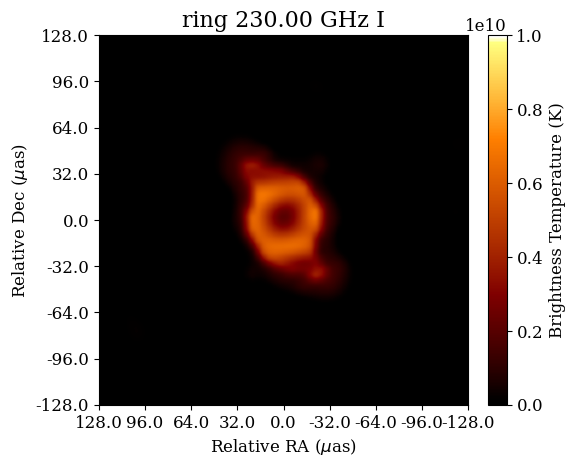

2023-10-18 15:09:55,764 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:55,766 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:55,892 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:55,893 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:56,020 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:56,021 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:56,149 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:56,150 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:56,277 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:56,279 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:56,406 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:56,407 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:56,538 INFO CountIterations      :: iteration = 7 / 25
2023

2998.708408899033
Data Fidelity:  64.48108477496949


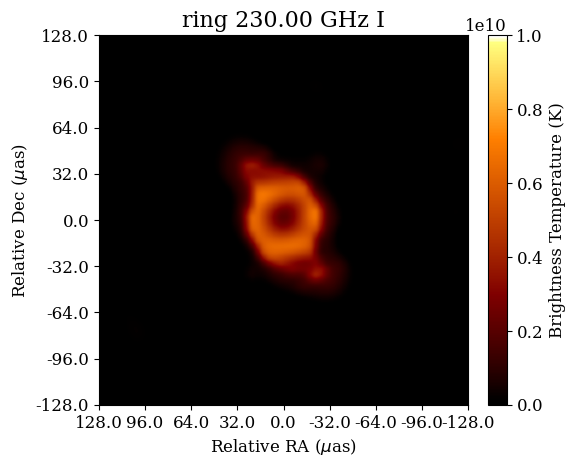

2023-10-18 15:09:59,320 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:09:59,322 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:59,450 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:09:59,452 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:59,579 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:09:59,581 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:59,711 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:09:59,712 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:59,868 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:09:59,869 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:09:59,998 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:09:59,999 INFO Display              :: Penalty--> 182.0721558907728
2023-10-18 15:10:00,127 INFO CountIterations      :: iteration = 7 / 25
2023

2998.7084817011882
Data Fidelity:  63.56003970067076


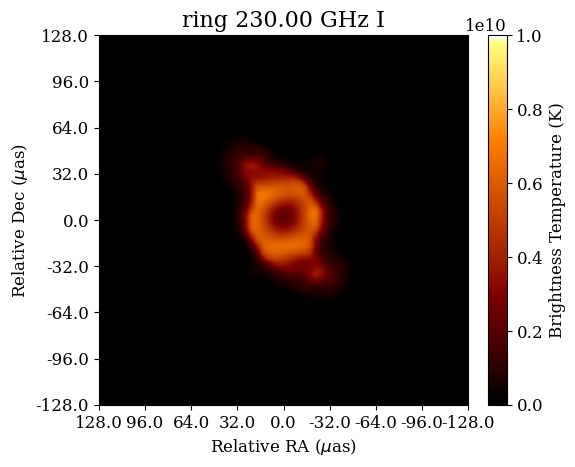

We use  6 scales with threshold 3.5
Current minimum 2756.311038462396
Start optimization with thresholds [3.5 3.5 3.5 3.5 3.5 3.5 3.5]
reverse mode: True
Updated at scale 0 to threshold 5.5 to minimum 2747.1714009442685
Updated at scale 0 to threshold 6.0 to minimum 2746.701948269941
Updated at scale 0 to threshold 6.5 to minimum 2696.3110271731016
Updated at scale 0 to threshold 7.0 to minimum 2670.727872288154
Updated at scale 1 to threshold 5.5 to minimum 2613.943580479255
Updated at scale 2 to threshold 3.0 to minimum 2604.931003473302
Updated at scale 2 to threshold 5.5 to minimum 2563.0127854939706
Updated at scale 3 to threshold 0.5 to minimum 2562.8159920241396
Updated at scale 3 to threshold 1.5 to minimum 2550.488068979579
Updated at scale 3 to threshold 2.0 to minimum 2546.5326960130824
Updated at scale 4 to threshold 0.0 to minimum 2539.9121766908233
Updated at scale 4 to threshold 0.5 to minimum 2515.7919445996713
Updated at scale 5 to threshold 0.0 to minimum 2511.8102604

2023-10-18 15:10:15,281 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:15,283 INFO Display              :: Penalty--> 517.1438607355802
2023-10-18 15:10:15,419 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:15,421 INFO Display              :: Penalty--> 485.8504665401679
2023-10-18 15:10:15,586 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:15,587 INFO Display              :: Penalty--> 479.7967922876606
2023-10-18 15:10:15,735 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:15,737 INFO Display              :: Penalty--> 473.23596606083146
2023-10-18 15:10:15,868 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:15,869 INFO Display              :: Penalty--> 468.04951171430815
2023-10-18 15:10:16,003 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:16,005 INFO Display              :: Penalty--> 463.65572614540014
2023-10-18 15:10:16,136 INFO CountIterations      :: iteration = 7 / 25
2

2877.5315619037747
Data Fidelity:  439.2873166605593


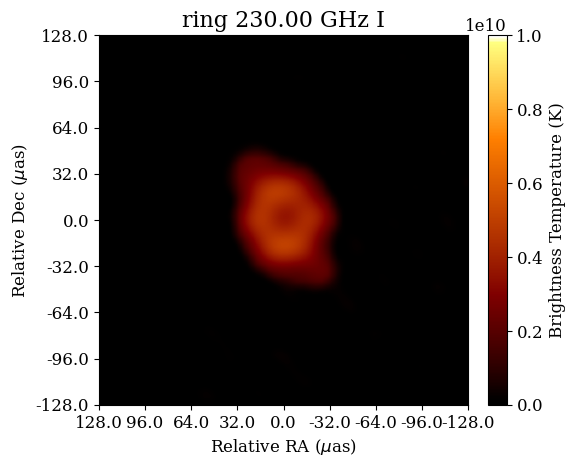

2023-10-18 15:10:19,095 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:19,097 INFO Display              :: Penalty--> 403.5649263135315
2023-10-18 15:10:19,236 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:19,237 INFO Display              :: Penalty--> 402.81109032480697
2023-10-18 15:10:19,372 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:19,373 INFO Display              :: Penalty--> 401.1808430139399
2023-10-18 15:10:19,510 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:19,511 INFO Display              :: Penalty--> 399.83711496698845
2023-10-18 15:10:19,650 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:19,652 INFO Display              :: Penalty--> 398.1762238227668
2023-10-18 15:10:19,786 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:19,788 INFO Display              :: Penalty--> 397.01942258132885
2023-10-18 15:10:19,922 INFO CountIterations      :: iteration = 7 / 25
2

2941.238788479356
Data Fidelity:  319.2728316776689


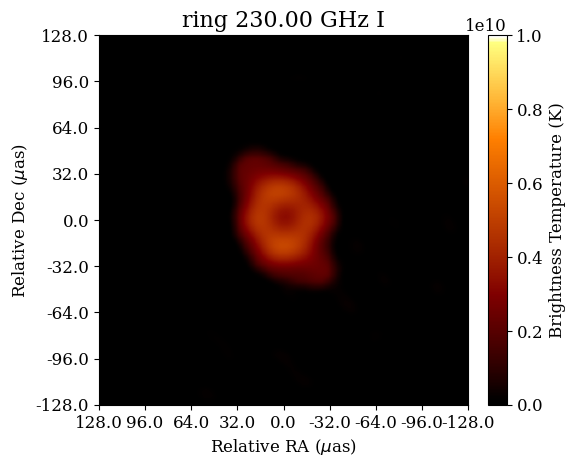

2023-10-18 15:10:23,108 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:23,110 INFO Display              :: Penalty--> 376.4809802234751
2023-10-18 15:10:23,268 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:23,270 INFO Display              :: Penalty--> 376.0887403124356
2023-10-18 15:10:23,402 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:23,404 INFO Display              :: Penalty--> 375.8926203569158
2023-10-18 15:10:23,551 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:23,552 INFO Display              :: Penalty--> 375.53255589294935
2023-10-18 15:10:23,724 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:23,725 INFO Display              :: Penalty--> 375.1602344735903
2023-10-18 15:10:23,858 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:23,860 INFO Display              :: Penalty--> 374.62243693206597
2023-10-18 15:10:24,008 INFO CountIterations      :: iteration = 7 / 25
20

2954.4347220042237
Data Fidelity:  272.25024248758314


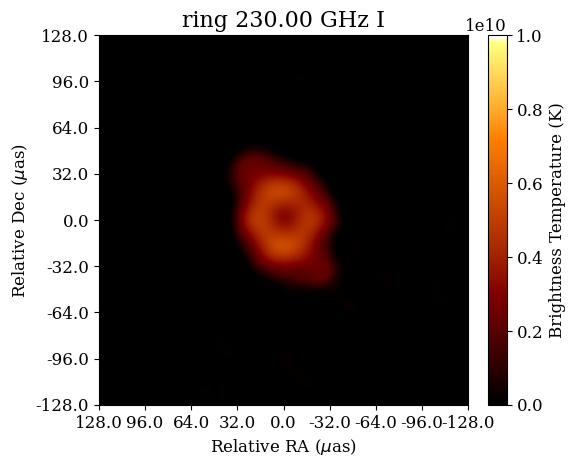

2023-10-18 15:10:27,275 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:27,277 INFO Display              :: Penalty--> 367.6034853965865
2023-10-18 15:10:27,421 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:27,422 INFO Display              :: Penalty--> 367.58203471323833
2023-10-18 15:10:27,554 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:27,556 INFO Display              :: Penalty--> 367.1484256271702
2023-10-18 15:10:27,691 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:27,693 INFO Display              :: Penalty--> 367.1484256271702
2023-10-18 15:10:27,834 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:27,836 INFO Display              :: Penalty--> 366.5789800578212
2023-10-18 15:10:27,981 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:27,982 INFO Display              :: Penalty--> 366.37213476062726
2023-10-18 15:10:28,110 INFO CountIterations      :: iteration = 7 / 25
20

2962.399615084728
Data Fidelity:  243.3446962609446


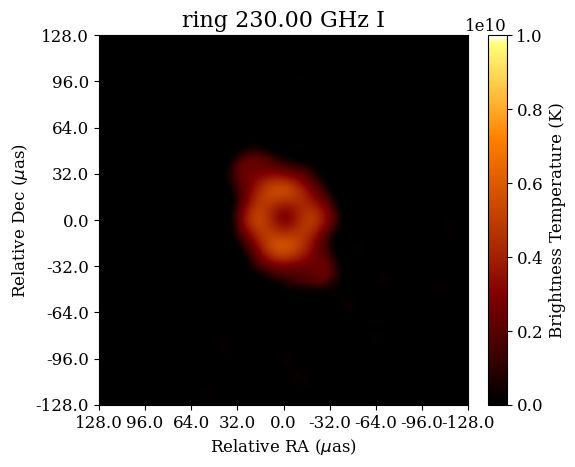

2023-10-18 15:10:30,982 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:30,984 INFO Display              :: Penalty--> 359.59579866174465
2023-10-18 15:10:31,143 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:31,144 INFO Display              :: Penalty--> 359.3996787062249
2023-10-18 15:10:31,286 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:31,287 INFO Display              :: Penalty--> 359.33839103951584
2023-10-18 15:10:31,437 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:31,439 INFO Display              :: Penalty--> 358.99671345351135
2023-10-18 15:10:31,585 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:31,587 INFO Display              :: Penalty--> 358.8005934979916
2023-10-18 15:10:31,738 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:31,740 INFO Display              :: Penalty--> 358.5738297091173
2023-10-18 15:10:31,890 INFO CountIterations      :: iteration = 7 / 25
2

2968.6233273299713
Data Fidelity:  223.59133409416222


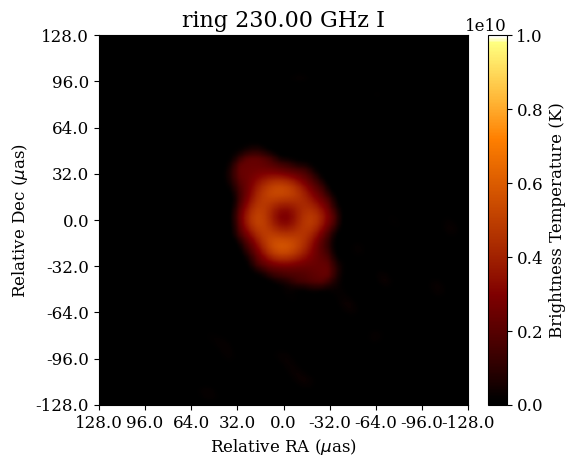

2023-10-18 15:10:34,960 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:34,962 INFO Display              :: Penalty--> 354.6882031987477
2023-10-18 15:10:35,104 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:35,105 INFO Display              :: Penalty--> 354.49208324322797
2023-10-18 15:10:35,240 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:35,241 INFO Display              :: Penalty--> 354.4307955765189
2023-10-18 15:10:35,385 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:35,387 INFO Display              :: Penalty--> 354.14274412093556
2023-10-18 15:10:35,526 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:35,527 INFO Display              :: Penalty--> 354.0600057708783
2023-10-18 15:10:35,669 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:35,670 INFO Display              :: Penalty--> 353.69840969319335
2023-10-18 15:10:35,810 INFO CountIterations      :: iteration = 7 / 25
2

2972.9076377126876
Data Fidelity:  208.57030929409413


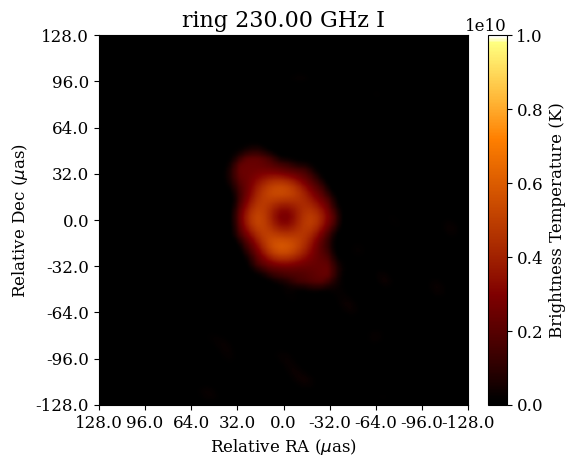

2023-10-18 15:10:38,769 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:38,771 INFO Display              :: Penalty--> 349.77294562151354
2023-10-18 15:10:38,901 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:38,903 INFO Display              :: Penalty--> 349.7622202798395
2023-10-18 15:10:39,055 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:39,057 INFO Display              :: Penalty--> 349.6702887797759
2023-10-18 15:10:39,208 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:39,210 INFO Display              :: Penalty--> 349.6702887797759
2023-10-18 15:10:39,364 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:39,367 INFO Display              :: Penalty--> 349.4940873159366
2023-10-18 15:10:39,503 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:39,506 INFO Display              :: Penalty--> 349.4940873159366
2023-10-18 15:10:39,641 INFO CountIterations      :: iteration = 7 / 25
202

2976.282974814222
Data Fidelity:  197.17057582022395


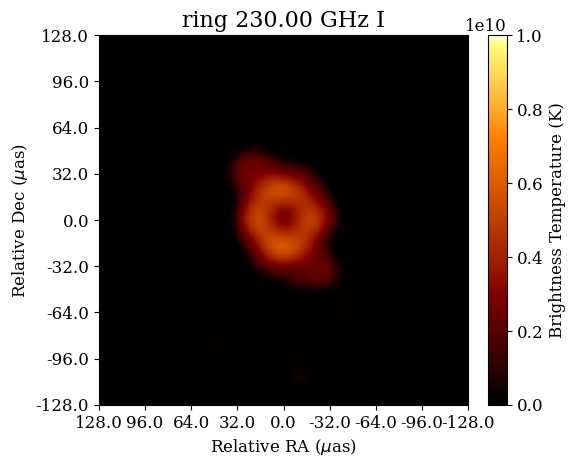

2023-10-18 15:10:42,671 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:42,673 INFO Display              :: Penalty--> 347.22032008257366
2023-10-18 15:10:42,820 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:42,821 INFO Display              :: Penalty--> 347.22032008257366
2023-10-18 15:10:42,960 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:42,962 INFO Display              :: Penalty--> 347.18967624921913
2023-10-18 15:10:43,095 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:43,096 INFO Display              :: Penalty--> 347.178950907545
2023-10-18 15:10:43,228 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:43,230 INFO Display              :: Penalty--> 347.178950907545
2023-10-18 15:10:43,373 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:43,374 INFO Display              :: Penalty--> 347.1483070741905
2023-10-18 15:10:43,514 INFO CountIterations      :: iteration = 7 / 25
202

2978.920494890159
Data Fidelity:  188.09578889336015


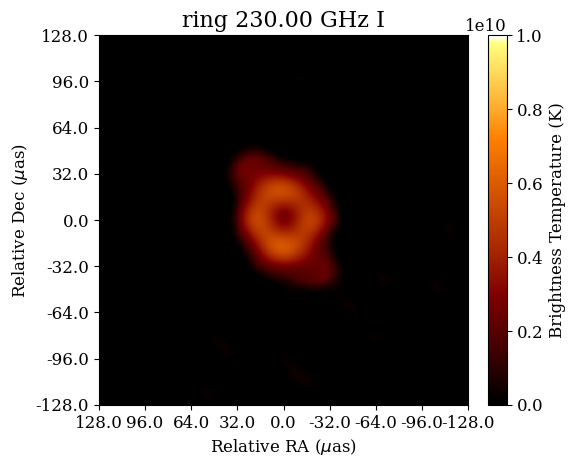

2023-10-18 15:10:46,447 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:46,449 INFO Display              :: Penalty--> 345.73562982424204
2023-10-18 15:10:46,585 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:46,586 INFO Display              :: Penalty--> 345.70498599088756
2023-10-18 15:10:46,730 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:46,732 INFO Display              :: Penalty--> 345.5395098687223
2023-10-18 15:10:46,870 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:46,871 INFO Display              :: Penalty--> 345.37403374655713
2023-10-18 15:10:47,004 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:47,006 INFO Display              :: Penalty--> 345.37403374655713
2023-10-18 15:10:47,137 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:47,139 INFO Display              :: Penalty--> 345.37403374655713
2023-10-18 15:10:47,286 INFO CountIterations      :: iteration = 7 / 25

2981.0116222739452
Data Fidelity:  180.40129675785803


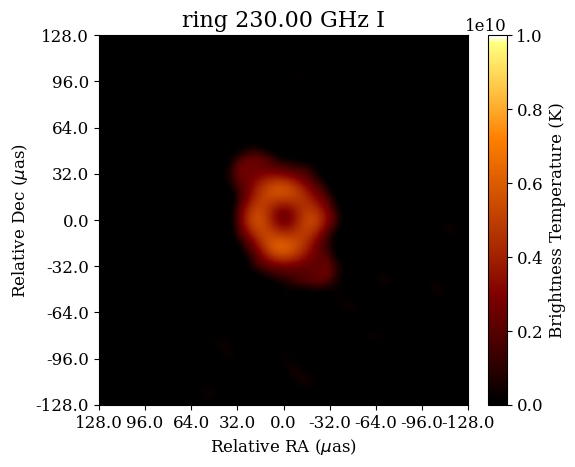

2023-10-18 15:10:50,257 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:50,259 INFO Display              :: Penalty--> 343.7912843773895
2023-10-18 15:10:50,395 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:50,396 INFO Display              :: Penalty--> 343.7912843773895
2023-10-18 15:10:50,535 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:50,536 INFO Display              :: Penalty--> 343.7912843773895
2023-10-18 15:10:50,673 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:50,674 INFO Display              :: Penalty--> 343.78362341905085
2023-10-18 15:10:50,809 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:50,810 INFO Display              :: Penalty--> 343.78362341905085
2023-10-18 15:10:50,945 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:50,947 INFO Display              :: Penalty--> 343.7529795856963
2023-10-18 15:10:51,085 INFO CountIterations      :: iteration = 7 / 25
20

2982.779511905118
Data Fidelity:  173.77498093253675


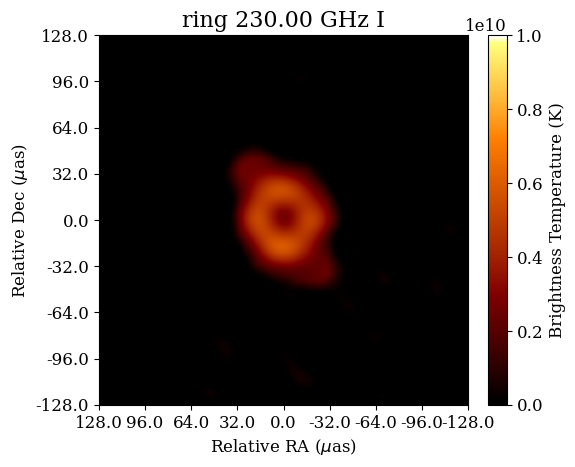

2023-10-18 15:10:54,222 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:54,223 INFO Display              :: Penalty--> 342.07063833607583
2023-10-18 15:10:54,379 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:54,381 INFO Display              :: Penalty--> 342.0399945027213
2023-10-18 15:10:54,513 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:54,514 INFO Display              :: Penalty--> 342.00935066936677
2023-10-18 15:10:54,647 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:54,649 INFO Display              :: Penalty--> 341.97870683601224
2023-10-18 15:10:54,783 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:54,785 INFO Display              :: Penalty--> 341.9174191693032
2023-10-18 15:10:54,919 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:54,921 INFO Display              :: Penalty--> 341.9174191693032
2023-10-18 15:10:55,054 INFO CountIterations      :: iteration = 7 / 25
2

2984.3543038749312
Data Fidelity:  167.94185097973255


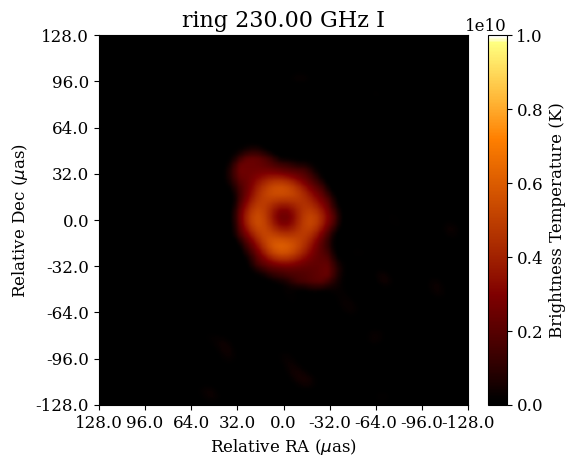

2023-10-18 15:10:58,275 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:10:58,276 INFO Display              :: Penalty--> 340.7529563915772
2023-10-18 15:10:58,423 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:10:58,425 INFO Display              :: Penalty--> 340.74529543323854
2023-10-18 15:10:58,577 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:10:58,578 INFO Display              :: Penalty--> 340.65336393317494
2023-10-18 15:10:58,712 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:10:58,713 INFO Display              :: Penalty--> 340.6426385915008
2023-10-18 15:10:58,852 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:10:58,854 INFO Display              :: Penalty--> 340.4771624693356
2023-10-18 15:10:58,998 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:10:59,000 INFO Display              :: Penalty--> 340.46643712766155
2023-10-18 15:10:59,134 INFO CountIterations      :: iteration = 7 / 25
2

2985.5486485093293
Data Fidelity:  162.75810571784214


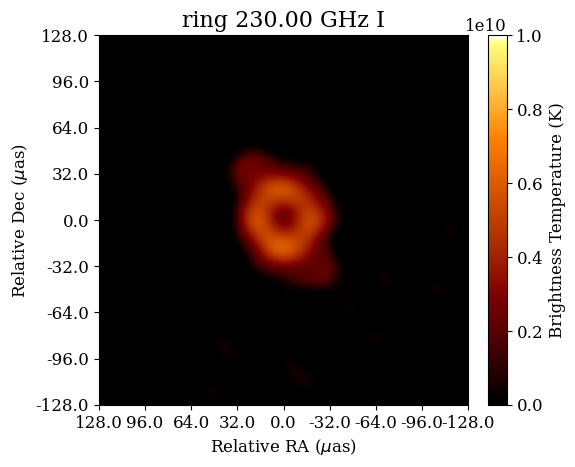

2023-10-18 15:11:02,091 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:02,092 INFO Display              :: Penalty--> 339.7141327526555
2023-10-18 15:11:02,224 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:02,225 INFO Display              :: Penalty--> 339.5379312888162
2023-10-18 15:11:02,357 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:02,358 INFO Display              :: Penalty--> 339.34181133329645
2023-10-18 15:11:02,491 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:02,492 INFO Display              :: Penalty--> 339.3111674999419
2023-10-18 15:11:02,643 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:02,644 INFO Display              :: Penalty--> 339.3111674999419
2023-10-18 15:11:02,795 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:02,797 INFO Display              :: Penalty--> 338.949571422257
2023-10-18 15:11:02,945 INFO CountIterations      :: iteration = 7 / 25
2023

2986.653470088606
Data Fidelity:  157.7958744873925


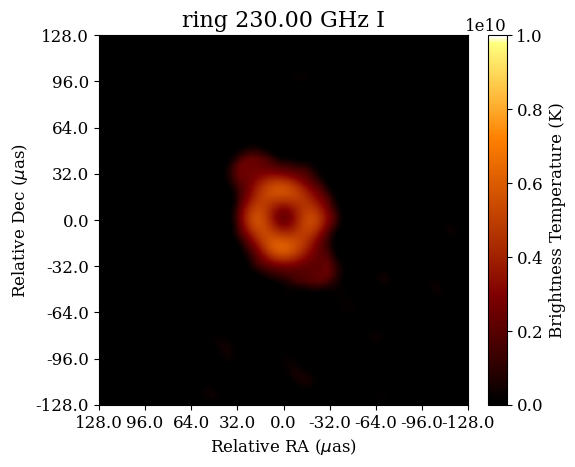

2023-10-18 15:11:06,055 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:06,056 INFO Display              :: Penalty--> 337.196749355921
2023-10-18 15:11:06,194 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:06,195 INFO Display              :: Penalty--> 336.86579711159055
2023-10-18 15:11:06,365 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:06,367 INFO Display              :: Penalty--> 336.86579711159055
2023-10-18 15:11:06,514 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:06,515 INFO Display              :: Penalty--> 336.86579711159055
2023-10-18 15:11:06,653 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:06,654 INFO Display              :: Penalty--> 336.68959564775133
2023-10-18 15:11:06,801 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:06,802 INFO Display              :: Penalty--> 336.68959564775133
2023-10-18 15:11:06,951 INFO CountIterations      :: iteration = 7 / 25


2987.3526281744334
Data Fidelity:  153.05058123962777


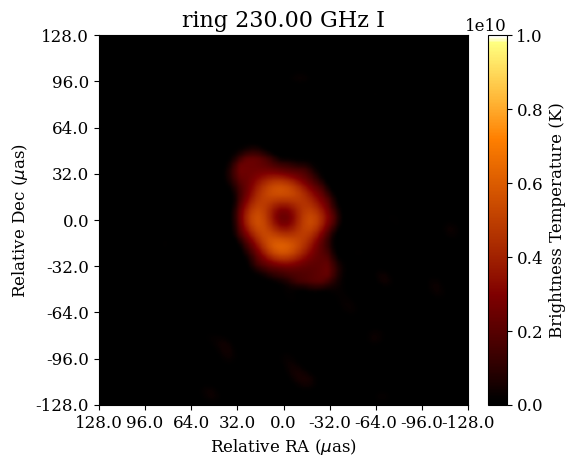

2023-10-18 15:11:10,045 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:10,047 INFO Display              :: Penalty--> 335.5128759146329
2023-10-18 15:11:10,187 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:10,189 INFO Display              :: Penalty--> 335.4822320812783
2023-10-18 15:11:10,337 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:10,338 INFO Display              :: Penalty--> 335.4515882479238
2023-10-18 15:11:10,484 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:10,486 INFO Display              :: Penalty--> 335.4515882479238
2023-10-18 15:11:10,619 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:10,621 INFO Display              :: Penalty--> 335.2248244590495
2023-10-18 15:11:10,777 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:10,779 INFO Display              :: Penalty--> 335.2248244590495
2023-10-18 15:11:10,920 INFO CountIterations      :: iteration = 7 / 25
2023

2988.2277420897954
Data Fidelity:  147.94845536067072


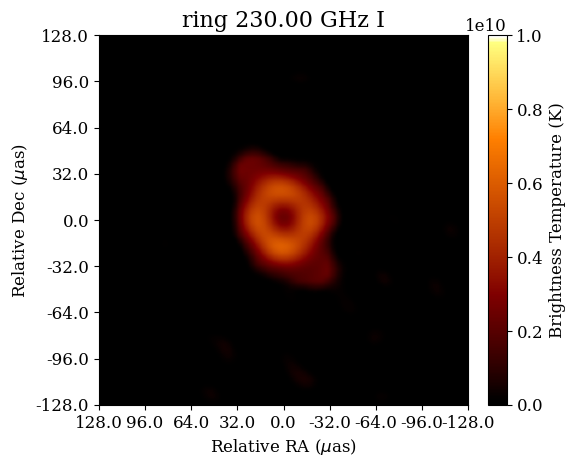

2023-10-18 15:11:14,047 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:14,049 INFO Display              :: Penalty--> 333.39079681227327
2023-10-18 15:11:14,178 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:14,180 INFO Display              :: Penalty--> 333.36015297891873
2023-10-18 15:11:14,311 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:14,312 INFO Display              :: Penalty--> 333.3295091455642
2023-10-18 15:11:14,445 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:14,447 INFO Display              :: Penalty--> 333.29886531220967
2023-10-18 15:11:14,580 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:14,582 INFO Display              :: Penalty--> 333.29886531220967
2023-10-18 15:11:14,731 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:14,734 INFO Display              :: Penalty--> 333.29886531220967
2023-10-18 15:11:14,874 INFO CountIterations      :: iteration = 7 / 25

2988.546369552286
Data Fidelity:  141.11057455544508


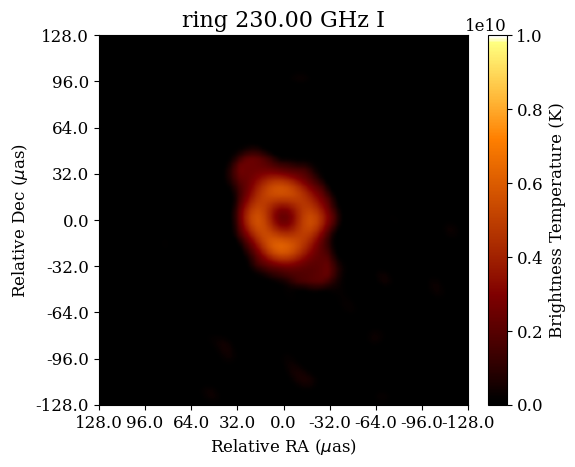

2023-10-18 15:11:17,886 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:17,888 INFO Display              :: Penalty--> 331.98578052066347
2023-10-18 15:11:18,021 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:18,022 INFO Display              :: Penalty--> 331.82030439849825
2023-10-18 15:11:18,154 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:18,156 INFO Display              :: Penalty--> 331.65482827633303
2023-10-18 15:11:18,288 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:18,290 INFO Display              :: Penalty--> 331.3238760320026
2023-10-18 15:11:18,439 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:18,441 INFO Display              :: Penalty--> 331.3238760320026
2023-10-18 15:11:18,588 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:18,590 INFO Display              :: Penalty--> 331.29323219864807
2023-10-18 15:11:18,721 INFO CountIterations      :: iteration = 7 / 25


2988.6257412826685
Data Fidelity:  122.93522195121118


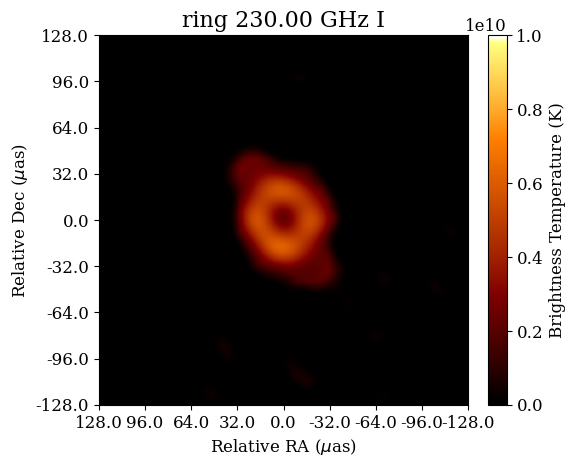

2023-10-18 15:11:21,798 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:21,800 INFO Display              :: Penalty--> 328.2043430436993
2023-10-18 15:11:21,946 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:21,948 INFO Display              :: Penalty--> 327.83202162434026
2023-10-18 15:11:22,079 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:22,080 INFO Display              :: Penalty--> 327.59453249379186
2023-10-18 15:11:22,211 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:22,213 INFO Display              :: Penalty--> 327.39841253827217
2023-10-18 15:11:22,343 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:22,344 INFO Display              :: Penalty--> 327.20229258275236
2023-10-18 15:11:22,475 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:22,477 INFO Display              :: Penalty--> 327.17164874939783
2023-10-18 15:11:22,606 INFO CountIterations      :: iteration = 7 / 25

2988.7744563474666
Data Fidelity:  91.26533105845678


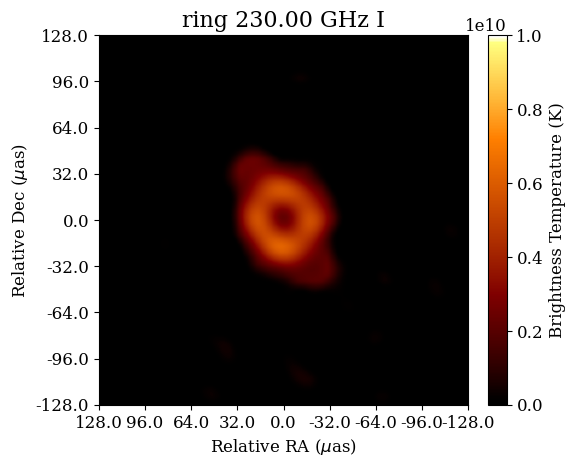

2023-10-18 15:11:25,577 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:25,578 INFO Display              :: Penalty--> 323.226266763987
2023-10-18 15:11:25,726 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:25,728 INFO Display              :: Penalty--> 322.864670686302
2023-10-18 15:11:25,887 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:25,888 INFO Display              :: Penalty--> 322.5337184419716
2023-10-18 15:11:26,045 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:26,046 INFO Display              :: Penalty--> 322.1721223642866
2023-10-18 15:11:26,199 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:26,200 INFO Display              :: Penalty--> 322.11083469757756
2023-10-18 15:11:26,330 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:26,332 INFO Display              :: Penalty--> 321.6144063310819
2023-10-18 15:11:26,485 INFO CountIterations      :: iteration = 7 / 25
2023-

2989.883081613395
Data Fidelity:  76.82391229692593


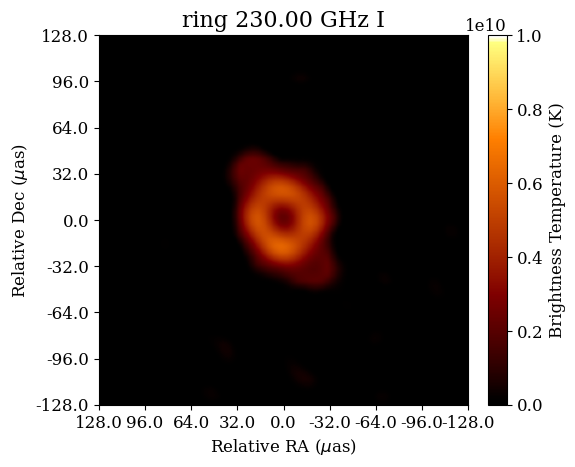

2023-10-18 15:11:29,474 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:29,476 INFO Display              :: Penalty--> 319.64094924254255
2023-10-18 15:11:29,614 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:29,616 INFO Display              :: Penalty--> 319.47547312037733
2023-10-18 15:11:29,761 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:29,763 INFO Display              :: Penalty--> 319.4448292870228
2023-10-18 15:11:29,917 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:29,918 INFO Display              :: Penalty--> 319.41418545366827
2023-10-18 15:11:30,059 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:30,061 INFO Display              :: Penalty--> 319.38354162031374
2023-10-18 15:11:30,211 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:30,212 INFO Display              :: Penalty--> 319.3528977869592
2023-10-18 15:11:30,347 INFO CountIterations      :: iteration = 7 / 25


2990.4302664287034
Data Fidelity:  68.64180487906751


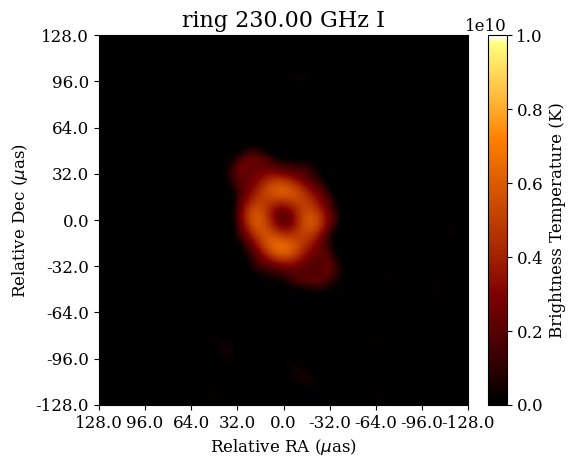

2023-10-18 15:11:33,348 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:33,350 INFO Display              :: Penalty--> 316.6439910097081
2023-10-18 15:11:33,495 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:33,496 INFO Display              :: Penalty--> 316.6439910097081
2023-10-18 15:11:33,643 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:33,645 INFO Display              :: Penalty--> 316.4785148875429
2023-10-18 15:11:33,795 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:33,797 INFO Display              :: Penalty--> 316.44787105418834
2023-10-18 15:11:33,932 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:33,933 INFO Display              :: Penalty--> 316.4172272208338
2023-10-18 15:11:34,080 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:34,081 INFO Display              :: Penalty--> 316.2211072653141
2023-10-18 15:11:34,230 INFO CountIterations      :: iteration = 7 / 25
202

2990.740228372557
Data Fidelity:  62.998770344868575


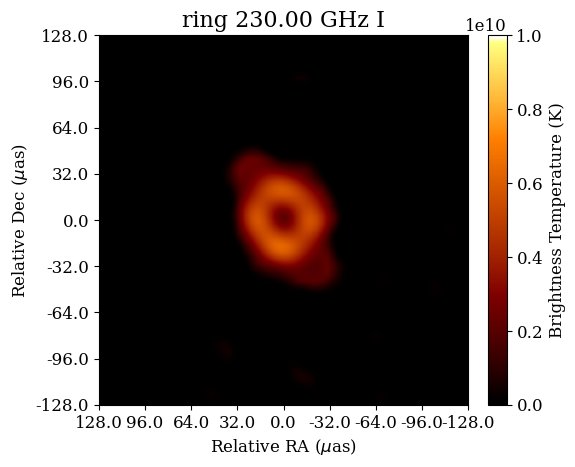

2023-10-18 15:11:37,239 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:37,240 INFO Display              :: Penalty--> 314.563280504428
2023-10-18 15:11:37,374 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:37,375 INFO Display              :: Penalty--> 314.39780438226273
2023-10-18 15:11:37,504 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:37,505 INFO Display              :: Penalty--> 314.35949959056956
2023-10-18 15:11:37,634 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:37,635 INFO Display              :: Penalty--> 314.328855757215
2023-10-18 15:11:37,768 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:37,770 INFO Display              :: Penalty--> 314.16337963504986
2023-10-18 15:11:37,916 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:37,917 INFO Display              :: Penalty--> 314.16337963504986
2023-10-18 15:11:38,072 INFO CountIterations      :: iteration = 7 / 25
20

2990.9680919934863
Data Fidelity:  58.61971420840588


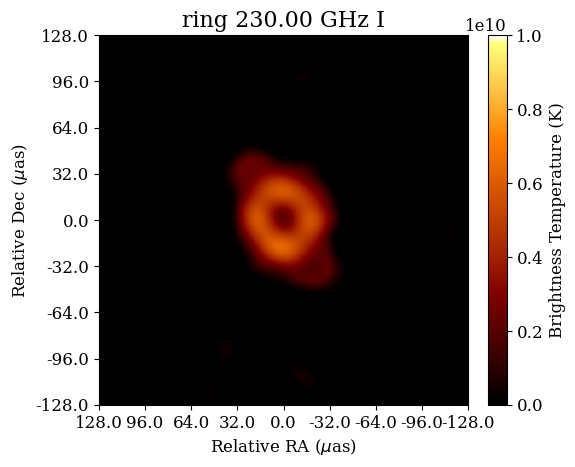

2023-10-18 15:11:41,041 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:41,043 INFO Display              :: Penalty--> 312.48256999914776
2023-10-18 15:11:41,176 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:41,178 INFO Display              :: Penalty--> 312.4519261657932
2023-10-18 15:11:41,326 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:41,327 INFO Display              :: Penalty--> 312.4519261657932
2023-10-18 15:11:41,476 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:41,478 INFO Display              :: Penalty--> 312.4519261657932
2023-10-18 15:11:41,617 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:41,618 INFO Display              :: Penalty--> 312.27878908528936
2023-10-18 15:11:41,770 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:41,771 INFO Display              :: Penalty--> 312.27878908528936
2023-10-18 15:11:41,930 INFO CountIterations      :: iteration = 7 / 25
2

2991.2437716244394
Data Fidelity:  55.041601962272594


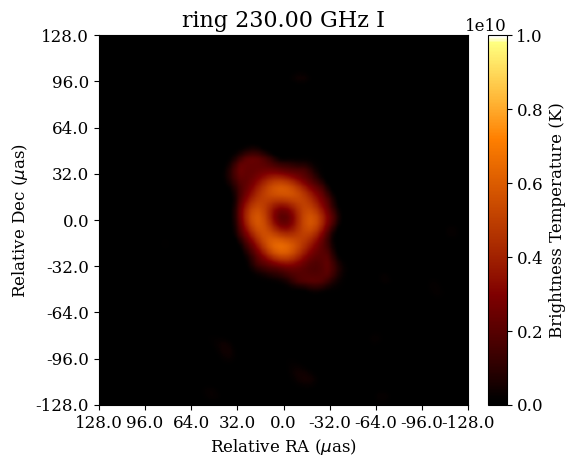

2023-10-18 15:11:44,936 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:44,937 INFO Display              :: Penalty--> 311.15722825220905
2023-10-18 15:11:45,077 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:45,079 INFO Display              :: Penalty--> 310.99175213004384
2023-10-18 15:11:45,213 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:45,215 INFO Display              :: Penalty--> 310.99175213004384
2023-10-18 15:11:45,355 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:45,357 INFO Display              :: Penalty--> 310.9611082966893
2023-10-18 15:11:45,498 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:45,500 INFO Display              :: Penalty--> 310.9611082966893
2023-10-18 15:11:45,632 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:45,634 INFO Display              :: Penalty--> 310.9611082966893
2023-10-18 15:11:45,767 INFO CountIterations      :: iteration = 7 / 25
2

2991.5517652745193
Data Fidelity:  51.8827727414006


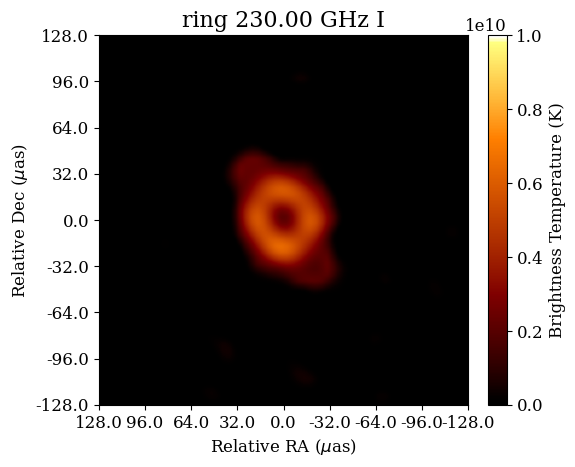

2023-10-18 15:11:48,820 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:48,821 INFO Display              :: Penalty--> 309.66334542182034
2023-10-18 15:11:48,972 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:48,974 INFO Display              :: Penalty--> 309.66334542182034
2023-10-18 15:11:49,107 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:49,108 INFO Display              :: Penalty--> 309.66334542182034
2023-10-18 15:11:49,260 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:49,262 INFO Display              :: Penalty--> 309.66334542182034
2023-10-18 15:11:49,417 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:49,419 INFO Display              :: Penalty--> 309.4978692996551
2023-10-18 15:11:49,550 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:49,551 INFO Display              :: Penalty--> 309.32166783581584
2023-10-18 15:11:49,687 INFO CountIterations      :: iteration = 7 / 25

2991.8034273733647
Data Fidelity:  49.12509072077236


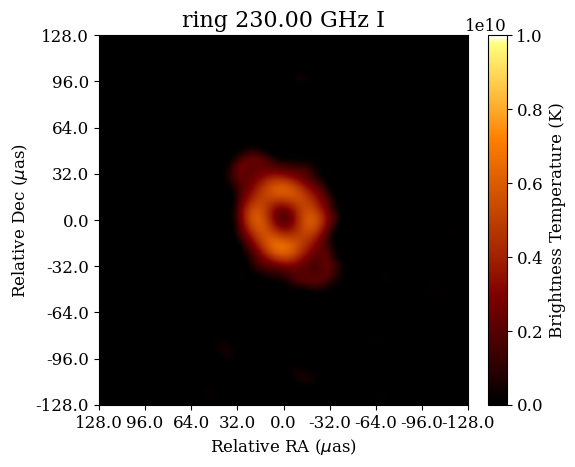

2023-10-18 15:11:52,800 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:52,801 INFO Display              :: Penalty--> 308.2460727527673
2023-10-18 15:11:52,937 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:52,939 INFO Display              :: Penalty--> 308.2460727527673
2023-10-18 15:11:53,090 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:53,092 INFO Display              :: Penalty--> 308.2460727527673
2023-10-18 15:11:53,227 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:53,228 INFO Display              :: Penalty--> 308.2460727527673
2023-10-18 15:11:53,375 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:53,377 INFO Display              :: Penalty--> 308.2154289194128
2023-10-18 15:11:53,527 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:53,529 INFO Display              :: Penalty--> 308.18478508605824
2023-10-18 15:11:53,664 INFO CountIterations      :: iteration = 7 / 25
202

2992.116059050462
Data Fidelity:  46.67751537268183


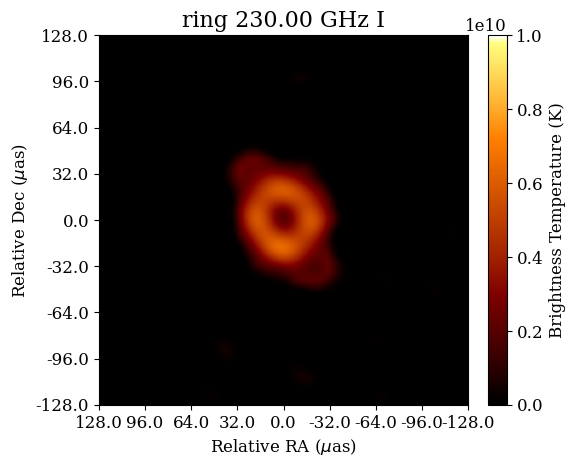

2023-10-18 15:11:56,761 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:11:56,763 INFO Display              :: Penalty--> 307.55505604447035
2023-10-18 15:11:56,912 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:11:56,914 INFO Display              :: Penalty--> 307.5244122111158
2023-10-18 15:11:57,045 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:11:57,046 INFO Display              :: Penalty--> 307.5244122111158
2023-10-18 15:11:57,183 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:11:57,185 INFO Display              :: Penalty--> 307.5244122111158
2023-10-18 15:11:57,338 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:11:57,341 INFO Display              :: Penalty--> 307.34821074727654
2023-10-18 15:11:57,517 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:11:57,519 INFO Display              :: Penalty--> 307.30684157224795
2023-10-18 15:11:57,664 INFO CountIterations      :: iteration = 7 / 25
2

2992.3795173577882
Data Fidelity:  44.39548516945776


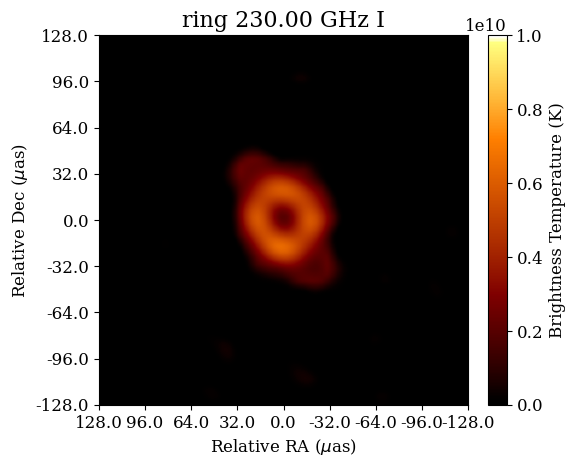

2023-10-18 15:12:00,813 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:00,814 INFO Display              :: Penalty--> 306.64646869730547
2023-10-18 15:12:00,963 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:00,965 INFO Display              :: Penalty--> 306.61582486395093
2023-10-18 15:12:01,102 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:01,104 INFO Display              :: Penalty--> 306.61582486395093
2023-10-18 15:12:01,242 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:01,243 INFO Display              :: Penalty--> 306.4503487417857
2023-10-18 15:12:01,408 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:01,409 INFO Display              :: Penalty--> 306.4503487417857
2023-10-18 15:12:01,549 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:01,551 INFO Display              :: Penalty--> 306.4503487417857
2023-10-18 15:12:01,688 INFO CountIterations      :: iteration = 7 / 25
2

2992.6961422144627
Data Fidelity:  42.35764992235646


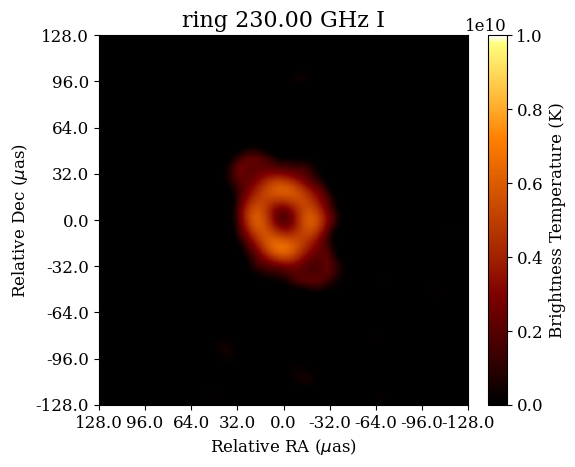

2023-10-18 15:12:04,863 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:04,865 INFO Display              :: Penalty--> 305.92480815565403
2023-10-18 15:12:05,006 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:05,008 INFO Display              :: Penalty--> 305.92480815565403
2023-10-18 15:12:05,145 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:05,146 INFO Display              :: Penalty--> 305.92480815565403
2023-10-18 15:12:05,284 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:05,286 INFO Display              :: Penalty--> 305.92480815565403
2023-10-18 15:12:05,443 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:05,444 INFO Display              :: Penalty--> 305.8941643222995
2023-10-18 15:12:05,603 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:05,604 INFO Display              :: Penalty--> 305.8941643222995
2023-10-18 15:12:05,747 INFO CountIterations      :: iteration = 7 / 25


2993.014445314141
Data Fidelity:  40.47321332499607


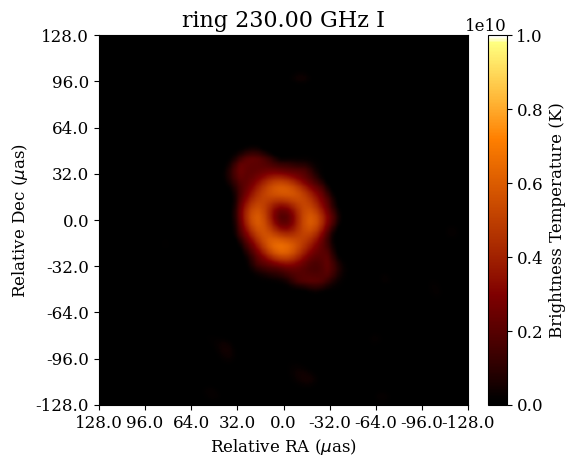

2023-10-18 15:12:08,801 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:08,803 INFO Display              :: Penalty--> 305.53256824461454
2023-10-18 15:12:08,975 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:08,976 INFO Display              :: Penalty--> 305.53256824461454
2023-10-18 15:12:09,110 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:09,111 INFO Display              :: Penalty--> 305.5218429029404
2023-10-18 15:12:09,241 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:09,243 INFO Display              :: Penalty--> 305.5218429029404
2023-10-18 15:12:09,395 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:09,398 INFO Display              :: Penalty--> 305.5218429029404
2023-10-18 15:12:09,539 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:09,541 INFO Display              :: Penalty--> 305.5218429029404
2023-10-18 15:12:09,685 INFO CountIterations      :: iteration = 7 / 25
20

2993.301909602623
Data Fidelity:  38.72253504930504


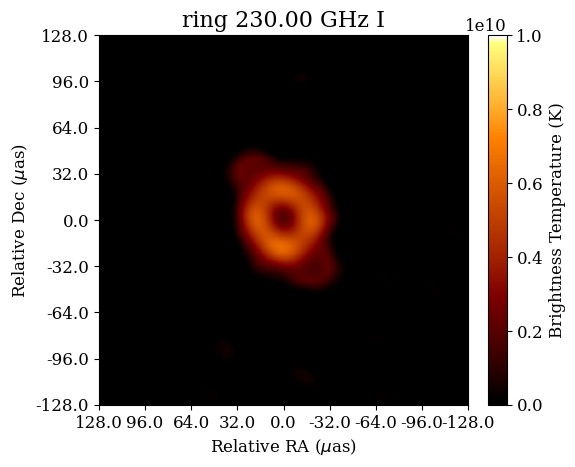

2023-10-18 15:12:12,579 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:12,581 INFO Display              :: Penalty--> 305.14186052524275
2023-10-18 15:12:12,732 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:12,734 INFO Display              :: Penalty--> 305.14186052524275
2023-10-18 15:12:12,869 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:12,871 INFO Display              :: Penalty--> 305.14186052524275
2023-10-18 15:12:13,021 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:13,022 INFO Display              :: Penalty--> 305.14186052524275
2023-10-18 15:12:13,180 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:13,181 INFO Display              :: Penalty--> 304.97638440307753
2023-10-18 15:12:13,327 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:13,328 INFO Display              :: Penalty--> 304.97638440307753
2023-10-18 15:12:13,483 INFO CountIterations      :: iteration = 7 / 2

2993.5594983065457
Data Fidelity:  37.00936755343026


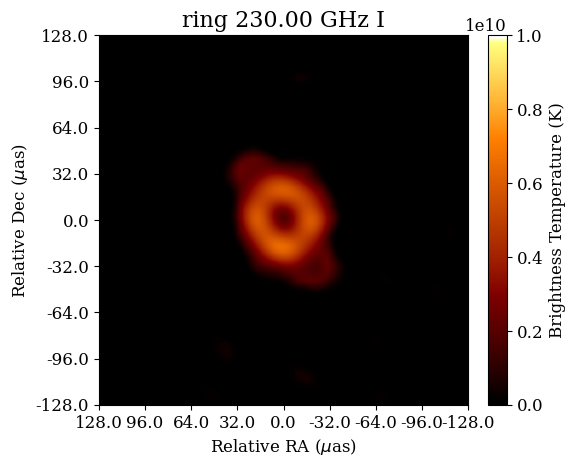

2023-10-18 15:12:16,479 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:16,490 INFO Display              :: Penalty--> 303.9850592838046
2023-10-18 15:12:16,644 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:16,646 INFO Display              :: Penalty--> 303.9850592838046
2023-10-18 15:12:16,793 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:16,795 INFO Display              :: Penalty--> 303.9850592838046
2023-10-18 15:12:16,946 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:16,947 INFO Display              :: Penalty--> 303.9544154504501
2023-10-18 15:12:17,093 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:17,095 INFO Display              :: Penalty--> 303.7889393282849
2023-10-18 15:12:17,231 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:17,232 INFO Display              :: Penalty--> 303.7889393282849
2023-10-18 15:12:17,366 INFO CountIterations      :: iteration = 7 / 25
2023

2993.7582834027253
Data Fidelity:  35.463110707794385


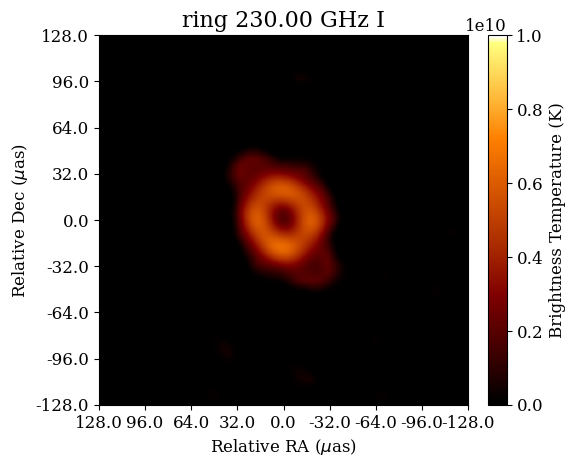

2023-10-18 15:12:20,544 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:20,546 INFO Display              :: Penalty--> 303.35533024221684
2023-10-18 15:12:20,679 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:20,680 INFO Display              :: Penalty--> 303.35533024221684
2023-10-18 15:12:20,810 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:20,812 INFO Display              :: Penalty--> 303.3246864088623
2023-10-18 15:12:20,943 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:20,945 INFO Display              :: Penalty--> 303.3246864088623
2023-10-18 15:12:21,086 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:21,087 INFO Display              :: Penalty--> 303.1285664533425
2023-10-18 15:12:21,236 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:21,238 INFO Display              :: Penalty--> 303.1285664533425
2023-10-18 15:12:21,365 INFO CountIterations      :: iteration = 7 / 25
20

2994.0540324928597
Data Fidelity:  33.98067961538533


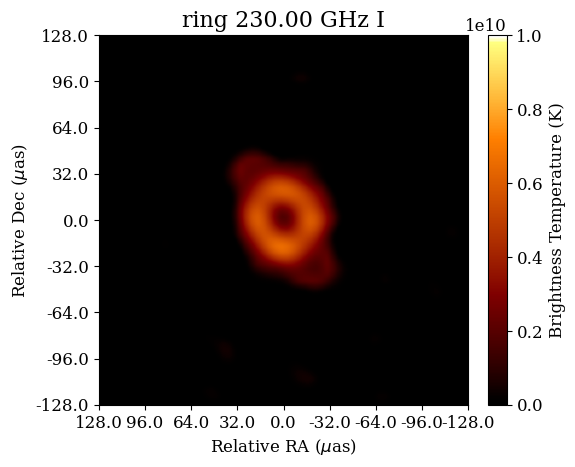

2023-10-18 15:12:24,451 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:24,452 INFO Display              :: Penalty--> 302.42682440337154
2023-10-18 15:12:24,586 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:24,588 INFO Display              :: Penalty--> 302.42682440337154
2023-10-18 15:12:24,744 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:24,746 INFO Display              :: Penalty--> 302.42682440337154
2023-10-18 15:12:24,877 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:24,878 INFO Display              :: Penalty--> 302.42682440337154
2023-10-18 15:12:25,032 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:25,034 INFO Display              :: Penalty--> 302.396180570017
2023-10-18 15:12:25,177 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:25,179 INFO Display              :: Penalty--> 302.396180570017
2023-10-18 15:12:25,309 INFO CountIterations      :: iteration = 7 / 25
20

2994.2174916448485
Data Fidelity:  32.63159305444423


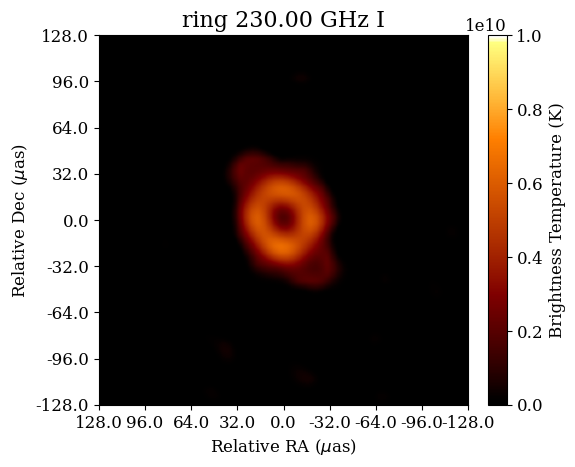

2023-10-18 15:12:28,387 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:28,389 INFO Display              :: Penalty--> 302.12804760611397
2023-10-18 15:12:28,563 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:28,564 INFO Display              :: Penalty--> 302.12804760611397
2023-10-18 15:12:28,696 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:28,697 INFO Display              :: Penalty--> 302.12804760611397
2023-10-18 15:12:28,835 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:28,836 INFO Display              :: Penalty--> 302.12804760611397
2023-10-18 15:12:29,023 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:29,025 INFO Display              :: Penalty--> 302.12804760611397
2023-10-18 15:12:29,168 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:29,170 INFO Display              :: Penalty--> 301.9625714839488
2023-10-18 15:12:29,305 INFO CountIterations      :: iteration = 7 / 25

2994.451247667129
Data Fidelity:  31.37132043658938


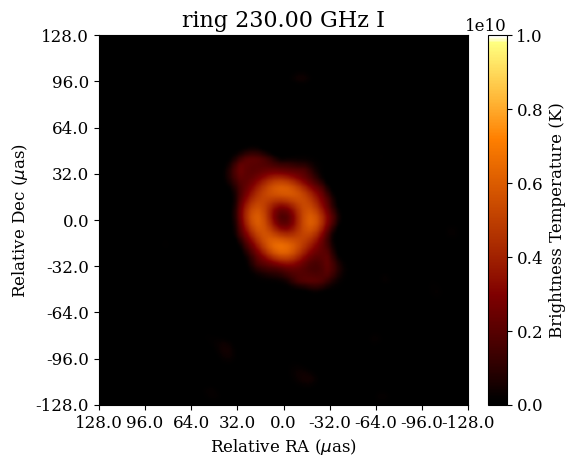

2023-10-18 15:12:32,458 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:32,460 INFO Display              :: Penalty--> 301.9135413505816
2023-10-18 15:12:32,615 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:32,617 INFO Display              :: Penalty--> 301.9135413505816
2023-10-18 15:12:32,757 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:32,758 INFO Display              :: Penalty--> 301.9135413505816
2023-10-18 15:12:32,891 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:32,892 INFO Display              :: Penalty--> 301.9135413505816
2023-10-18 15:12:33,022 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:33,024 INFO Display              :: Penalty--> 301.9135413505816
2023-10-18 15:12:33,157 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:33,159 INFO Display              :: Penalty--> 301.9135413505816
2023-10-18 15:12:33,317 INFO CountIterations      :: iteration = 7 / 25
2023

2994.6718643530085
Data Fidelity:  30.17856904829948


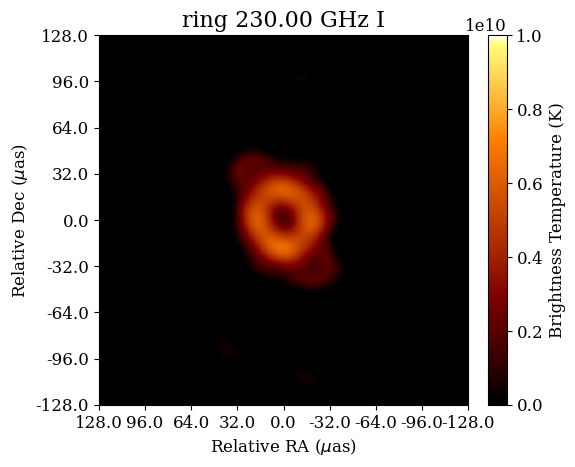

2023-10-18 15:12:36,263 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:36,265 INFO Display              :: Penalty--> 301.6852453700395
2023-10-18 15:12:36,414 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:36,415 INFO Display              :: Penalty--> 301.6852453700395
2023-10-18 15:12:36,563 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:36,565 INFO Display              :: Penalty--> 301.6852453700395
2023-10-18 15:12:36,697 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:36,699 INFO Display              :: Penalty--> 301.6852453700395
2023-10-18 15:12:36,853 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:36,856 INFO Display              :: Penalty--> 301.6852453700395
2023-10-18 15:12:36,992 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:36,995 INFO Display              :: Penalty--> 301.6852453700395
2023-10-18 15:12:37,128 INFO CountIterations      :: iteration = 7 / 25
2023

2994.9046616994656
Data Fidelity:  29.04139953498069


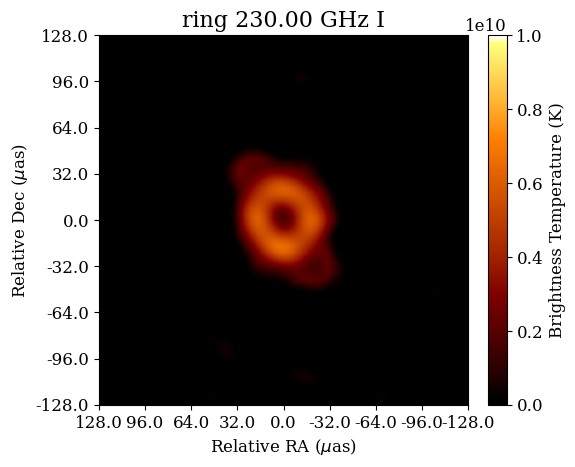

2023-10-18 15:12:40,243 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:40,245 INFO Display              :: Penalty--> 301.4584815811653
2023-10-18 15:12:40,402 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:40,405 INFO Display              :: Penalty--> 301.4584815811653
2023-10-18 15:12:40,543 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:40,545 INFO Display              :: Penalty--> 301.4584815811653
2023-10-18 15:12:40,676 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:40,678 INFO Display              :: Penalty--> 301.4584815811653
2023-10-18 15:12:40,829 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:40,831 INFO Display              :: Penalty--> 301.4584815811653
2023-10-18 15:12:40,988 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:40,990 INFO Display              :: Penalty--> 301.4584815811653
2023-10-18 15:12:41,123 INFO CountIterations      :: iteration = 7 / 25
2023

2995.1214609345066
Data Fidelity:  27.948470236395217


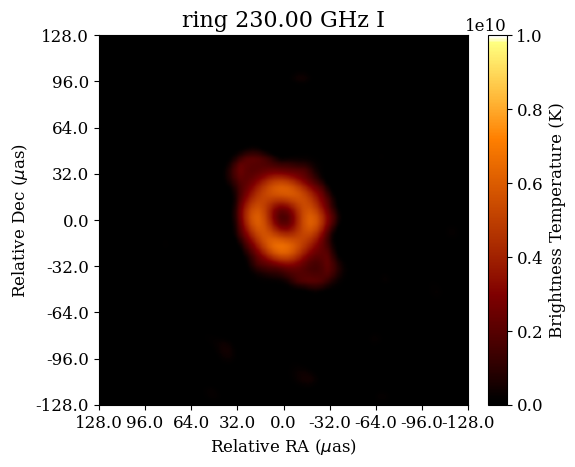

2023-10-18 15:12:44,421 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:44,423 INFO Display              :: Penalty--> 300.92068403964106
2023-10-18 15:12:44,581 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:44,583 INFO Display              :: Penalty--> 300.92068403964106
2023-10-18 15:12:44,713 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:44,714 INFO Display              :: Penalty--> 300.92068403964106
2023-10-18 15:12:44,856 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:44,857 INFO Display              :: Penalty--> 300.92068403964106
2023-10-18 15:12:45,004 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:45,006 INFO Display              :: Penalty--> 300.92068403964106
2023-10-18 15:12:45,145 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:45,147 INFO Display              :: Penalty--> 300.92068403964106
2023-10-18 15:12:45,282 INFO CountIterations      :: iteration = 7 / 2

2995.2687944726595
Data Fidelity:  26.92429269272306


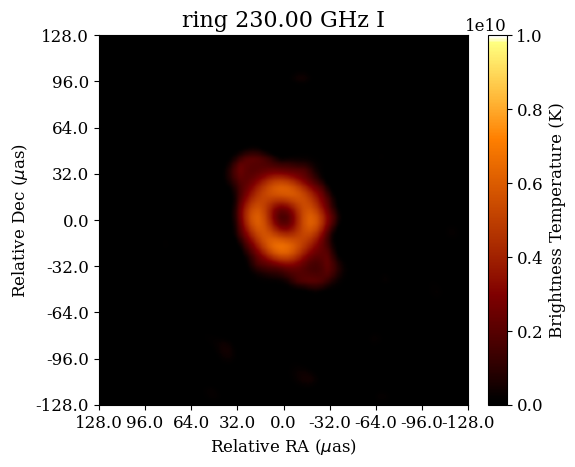

2023-10-18 15:12:48,284 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:48,285 INFO Display              :: Penalty--> 300.62497162571907
2023-10-18 15:12:48,417 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:48,418 INFO Display              :: Penalty--> 300.62497162571907
2023-10-18 15:12:48,562 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:48,563 INFO Display              :: Penalty--> 300.61424628404495
2023-10-18 15:12:48,725 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:48,727 INFO Display              :: Penalty--> 300.61424628404495
2023-10-18 15:12:48,883 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:48,885 INFO Display              :: Penalty--> 300.61424628404495
2023-10-18 15:12:49,031 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:49,032 INFO Display              :: Penalty--> 300.61424628404495
2023-10-18 15:12:49,171 INFO CountIterations      :: iteration = 7 / 2

2995.388652691171
Data Fidelity:  25.948680424189646


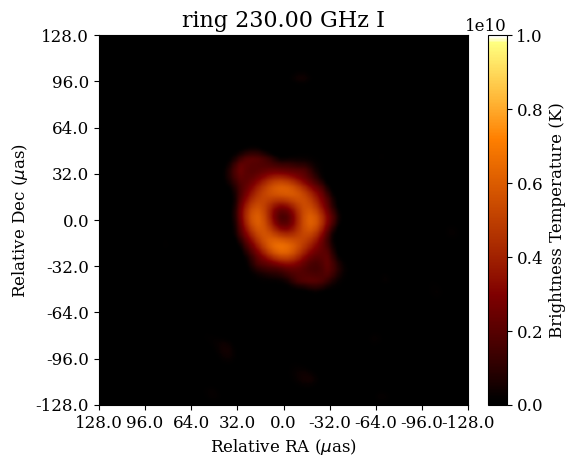

2023-10-18 15:12:52,336 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:52,337 INFO Display              :: Penalty--> 300.0458049091662
2023-10-18 15:12:52,474 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:52,476 INFO Display              :: Penalty--> 300.0458049091662
2023-10-18 15:12:52,625 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:52,628 INFO Display              :: Penalty--> 300.0350795674921
2023-10-18 15:12:52,767 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:52,770 INFO Display              :: Penalty--> 300.0350795674921
2023-10-18 15:12:52,927 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:52,929 INFO Display              :: Penalty--> 300.0350795674921
2023-10-18 15:12:53,076 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:53,078 INFO Display              :: Penalty--> 300.0350795674921
2023-10-18 15:12:53,212 INFO CountIterations      :: iteration = 7 / 25
2023

2995.607221289527
Data Fidelity:  25.032954207883815


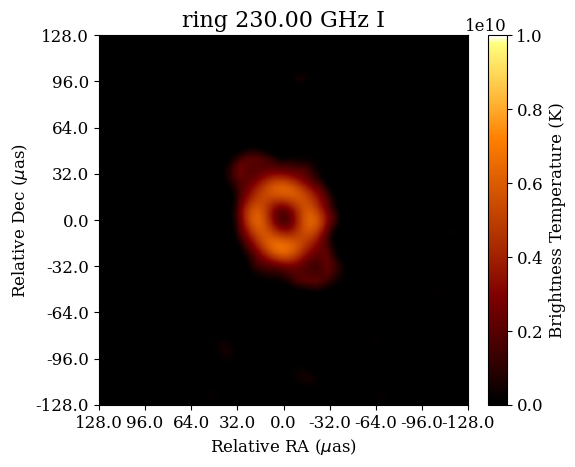

2023-10-18 15:12:56,322 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:12:56,324 INFO Display              :: Penalty--> 299.66275814813304
2023-10-18 15:12:56,453 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:12:56,455 INFO Display              :: Penalty--> 299.652032806459
2023-10-18 15:12:56,587 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:12:56,588 INFO Display              :: Penalty--> 299.48655668429376
2023-10-18 15:12:56,721 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:12:56,723 INFO Display              :: Penalty--> 299.48655668429376
2023-10-18 15:12:56,863 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:12:56,864 INFO Display              :: Penalty--> 299.48655668429376
2023-10-18 15:12:57,011 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:12:57,012 INFO Display              :: Penalty--> 299.48655668429376
2023-10-18 15:12:57,147 INFO CountIterations      :: iteration = 7 / 25


2995.667499639412
Data Fidelity:  24.167779167158674


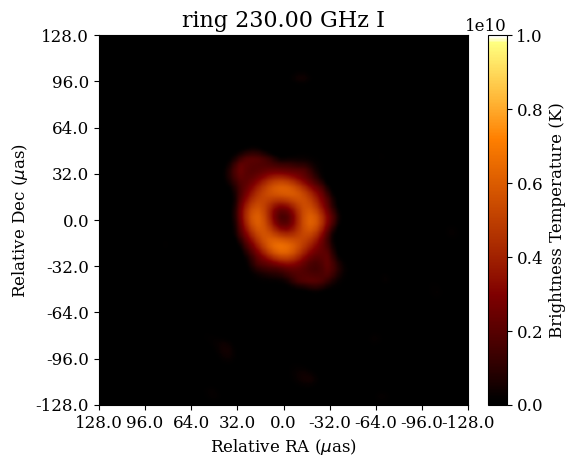

2023-10-18 15:13:00,276 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:00,277 INFO Display              :: Penalty--> 299.24906755374536
2023-10-18 15:13:00,435 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:00,436 INFO Display              :: Penalty--> 299.2414065954067
2023-10-18 15:13:00,572 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:00,573 INFO Display              :: Penalty--> 299.23374563706807
2023-10-18 15:13:00,707 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:00,708 INFO Display              :: Penalty--> 299.23374563706807
2023-10-18 15:13:00,842 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:00,844 INFO Display              :: Penalty--> 299.23374563706807
2023-10-18 15:13:00,995 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:00,997 INFO Display              :: Penalty--> 299.06826951490285
2023-10-18 15:13:01,144 INFO CountIterations      :: iteration = 7 / 25

2995.800574472483
Data Fidelity:  23.33698027193014


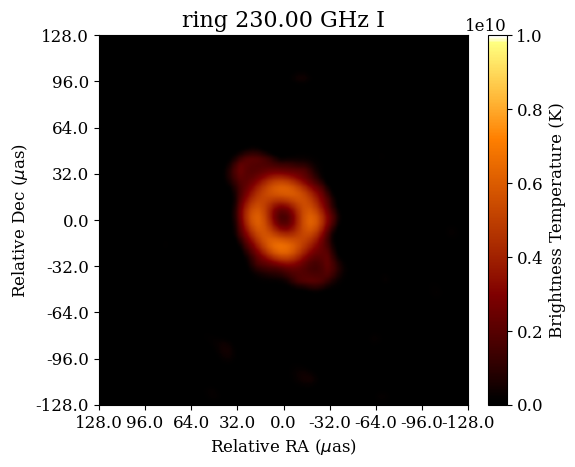

2023-10-18 15:13:04,228 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:04,230 INFO Display              :: Penalty--> 298.86142421770904
2023-10-18 15:13:04,359 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:04,361 INFO Display              :: Penalty--> 298.86142421770904
2023-10-18 15:13:04,493 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:04,494 INFO Display              :: Penalty--> 298.86142421770904
2023-10-18 15:13:04,644 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:04,645 INFO Display              :: Penalty--> 298.86142421770904
2023-10-18 15:13:04,796 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:04,798 INFO Display              :: Penalty--> 298.6959480955438
2023-10-18 15:13:04,946 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:04,948 INFO Display              :: Penalty--> 298.6959480955438
2023-10-18 15:13:05,094 INFO CountIterations      :: iteration = 7 / 25


2995.8996278858185
Data Fidelity:  22.55715607566158


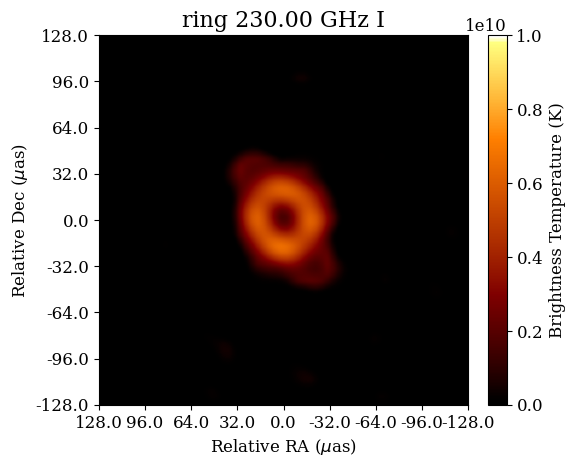

2023-10-18 15:13:08,142 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:08,144 INFO Display              :: Penalty--> 298.5197466317045
2023-10-18 15:13:08,285 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:08,286 INFO Display              :: Penalty--> 298.5197466317045
2023-10-18 15:13:08,437 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:08,439 INFO Display              :: Penalty--> 298.5197466317045
2023-10-18 15:13:08,583 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:08,585 INFO Display              :: Penalty--> 298.5197466317045
2023-10-18 15:13:08,741 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:08,743 INFO Display              :: Penalty--> 298.5197466317045
2023-10-18 15:13:08,888 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:08,889 INFO Display              :: Penalty--> 298.5197466317045
2023-10-18 15:13:09,050 INFO CountIterations      :: iteration = 7 / 25
2023

2996.0506003968285
Data Fidelity:  21.820398522170752


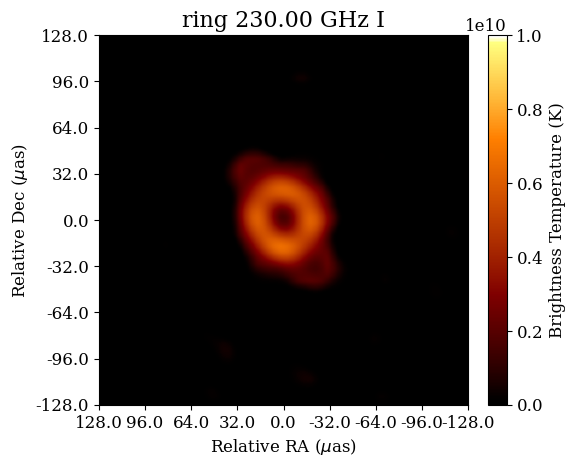

2023-10-18 15:13:12,146 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:12,147 INFO Display              :: Penalty--> 298.3680596565995
2023-10-18 15:13:12,309 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:12,311 INFO Display              :: Penalty--> 298.3680596565995
2023-10-18 15:13:12,447 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:12,449 INFO Display              :: Penalty--> 298.3680596565995
2023-10-18 15:13:12,582 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:12,584 INFO Display              :: Penalty--> 298.3680596565995
2023-10-18 15:13:12,723 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:12,724 INFO Display              :: Penalty--> 298.20258353443427
2023-10-18 15:13:12,884 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:12,886 INFO Display              :: Penalty--> 298.20258353443427
2023-10-18 15:13:13,037 INFO CountIterations      :: iteration = 7 / 25
20

2996.1362645479976
Data Fidelity:  21.114040882139253


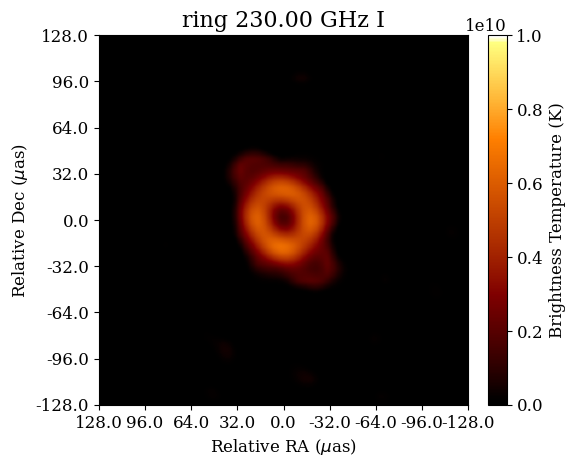

2023-10-18 15:13:16,183 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:16,184 INFO Display              :: Penalty--> 298.16427874274115
2023-10-18 15:13:16,362 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:16,366 INFO Display              :: Penalty--> 298.16427874274115
2023-10-18 15:13:16,506 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:16,507 INFO Display              :: Penalty--> 298.16427874274115
2023-10-18 15:13:16,644 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:16,645 INFO Display              :: Penalty--> 298.16427874274115
2023-10-18 15:13:16,782 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:16,783 INFO Display              :: Penalty--> 298.16427874274115
2023-10-18 15:13:16,933 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:16,935 INFO Display              :: Penalty--> 298.16427874274115
2023-10-18 15:13:17,068 INFO CountIterations      :: iteration = 7 / 2

2996.269863519572
Data Fidelity:  20.44654029057009


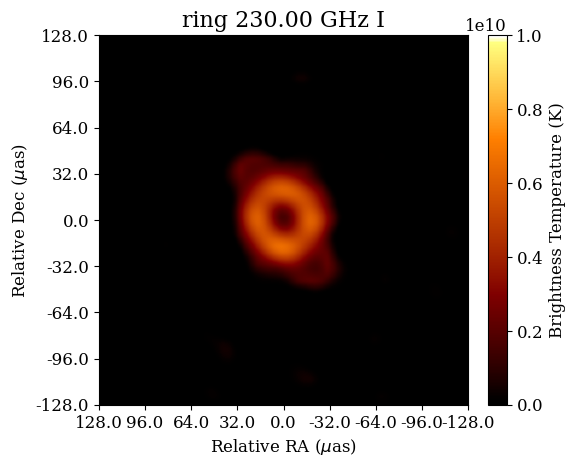

2023-10-18 15:13:20,153 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:20,154 INFO Display              :: Penalty--> 297.8455834538033
2023-10-18 15:13:20,307 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:20,309 INFO Display              :: Penalty--> 297.8455834538033
2023-10-18 15:13:20,439 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:20,441 INFO Display              :: Penalty--> 297.8455834538033
2023-10-18 15:13:20,573 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:20,575 INFO Display              :: Penalty--> 297.81493962044874
2023-10-18 15:13:20,706 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:20,708 INFO Display              :: Penalty--> 297.81493962044874
2023-10-18 15:13:20,852 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:20,853 INFO Display              :: Penalty--> 297.81493962044874
2023-10-18 15:13:20,999 INFO CountIterations      :: iteration = 7 / 25
2

2996.374527991614
Data Fidelity:  19.81334025139041


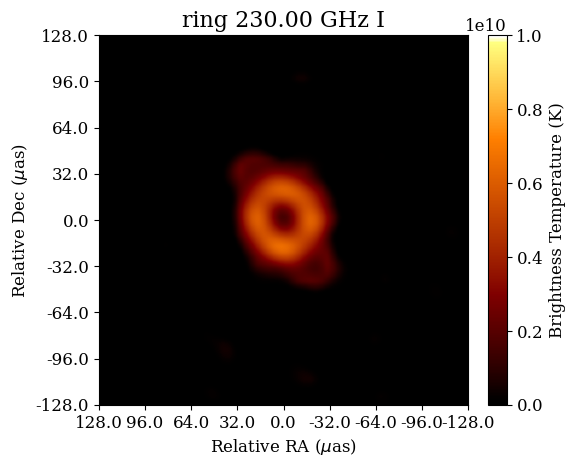

2023-10-18 15:13:24,018 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:24,019 INFO Display              :: Penalty--> 297.618819664929
2023-10-18 15:13:24,153 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:24,155 INFO Display              :: Penalty--> 297.618819664929
2023-10-18 15:13:24,300 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:24,302 INFO Display              :: Penalty--> 297.618819664929
2023-10-18 15:13:24,435 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:24,437 INFO Display              :: Penalty--> 297.618819664929
2023-10-18 15:13:24,584 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:24,585 INFO Display              :: Penalty--> 297.618819664929
2023-10-18 15:13:24,720 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:24,722 INFO Display              :: Penalty--> 297.618819664929
2023-10-18 15:13:24,856 INFO CountIterations      :: iteration = 7 / 25
2023-10-18

2996.4613644767796
Data Fidelity:  19.21383598075064


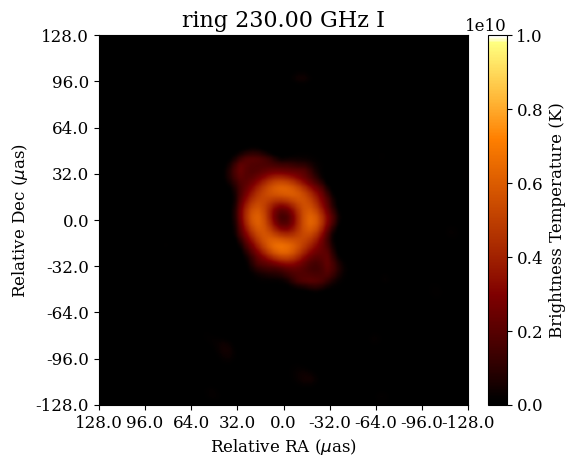

2023-10-18 15:13:27,825 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:27,826 INFO Display              :: Penalty--> 297.55753199821993
2023-10-18 15:13:27,969 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:27,970 INFO Display              :: Penalty--> 297.55753199821993
2023-10-18 15:13:28,101 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:28,102 INFO Display              :: Penalty--> 297.55753199821993
2023-10-18 15:13:28,237 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:28,239 INFO Display              :: Penalty--> 297.55753199821993
2023-10-18 15:13:28,381 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:28,382 INFO Display              :: Penalty--> 297.55753199821993
2023-10-18 15:13:28,533 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:28,535 INFO Display              :: Penalty--> 297.55753199821993
2023-10-18 15:13:28,668 INFO CountIterations      :: iteration = 7 / 2

2996.605139648545
Data Fidelity:  18.6402194382807


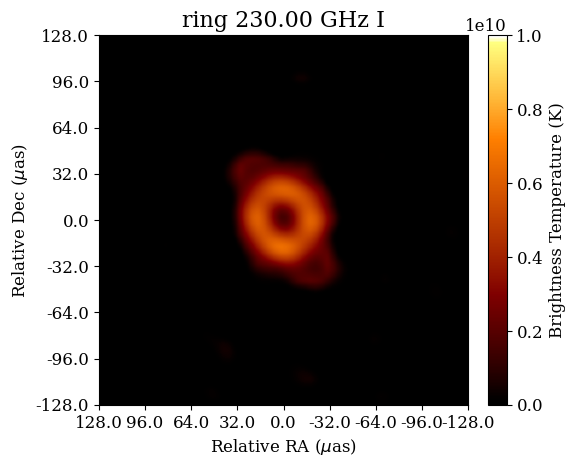

We use  6 scales with threshold 0.5
Current minimum 2776.705459523193
Start optimization with thresholds [0.5 0.5 0.5 0.5 0.5 0.5 0.5]
reverse mode: True
Updated at scale 2 to threshold 0.0 to minimum 2714.808527543699
Updated at scale 3 to threshold 0.0 to minimum 2712.1054014291904
Updated at scale 3 to threshold 4.5 to minimum 2710.6633905150716
Updated at scale 6 to threshold 1.0 to minimum 2680.939076919111
Updated at scale 6 to threshold 1.5 to minimum 2662.077422548359
Updated at scale 6 to threshold 2.0 to minimum 2646.887347442294
Updated at scale 6 to threshold 2.5 to minimum 2627.7714973672205
Updated at scale 6 to threshold 3.0 to minimum 2609.179280295675
Updated at scale 6 to threshold 3.5 to minimum 2596.1373604149285
Updated at scale 6 to threshold 4.0 to minimum 2584.7625726167657
Updated at scale 6 to threshold 4.5 to minimum 2571.475397495823
Updated at scale 6 to threshold 5.0 to minimum 2562.9960294268526
Updated at scale 6 to threshold 5.5 to minimum 2550.81419909

2023-10-18 15:13:44,121 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:44,123 INFO Display              :: Penalty--> 776.3221407740305


Updated at scale 6 to threshold 9.0 to minimum 2473.079677845056
Updated at scale 6 to threshold 9.5 to minimum 2468.0008680951146
We use thresholds:  [0.5 0.5 0.  4.5 0.5 0.5 9.5]


2023-10-18 15:13:44,263 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:44,265 INFO Display              :: Penalty--> 731.8913162392344
2023-10-18 15:13:44,401 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:44,403 INFO Display              :: Penalty--> 721.3856348682933
2023-10-18 15:13:44,541 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:44,542 INFO Display              :: Penalty--> 712.9892459132736
2023-10-18 15:13:44,681 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:44,682 INFO Display              :: Penalty--> 706.4330145275999
2023-10-18 15:13:44,849 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:44,850 INFO Display              :: Penalty--> 699.5044623005163
2023-10-18 15:13:44,992 INFO CountIterations      :: iteration = 7 / 25
2023-10-18 15:13:44,994 INFO Display              :: Penalty--> 691.6213569762361
2023-10-18 15:13:45,133 INFO CountIterations      :: iteration = 8 / 25
2023

2761.7928706057664
Data Fidelity:  207.75177395387448


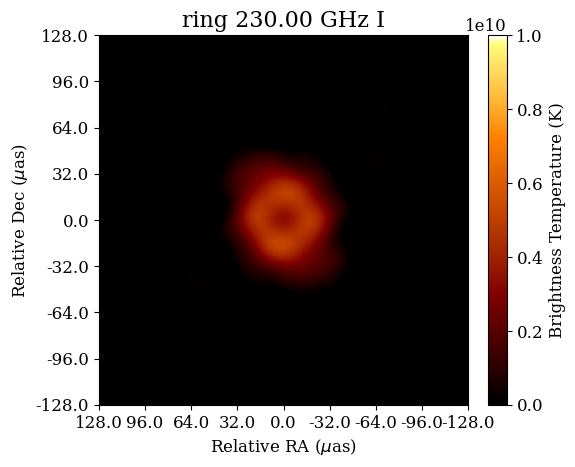

2023-10-18 15:13:47,897 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:47,899 INFO Display              :: Penalty--> 617.062586723847
2023-10-18 15:13:48,048 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:48,049 INFO Display              :: Penalty--> 617.0012990571379
2023-10-18 15:13:48,185 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:48,186 INFO Display              :: Penalty--> 616.3102823488409
2023-10-18 15:13:48,323 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:48,324 INFO Display              :: Penalty--> 615.5564463601165
2023-10-18 15:13:48,470 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:48,472 INFO Display              :: Penalty--> 614.5160911074763
2023-10-18 15:13:48,619 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:48,620 INFO Display              :: Penalty--> 613.3225166880637
2023-10-18 15:13:48,774 INFO CountIterations      :: iteration = 7 / 25
2023-

2952.748471288125
Data Fidelity:  122.87074849484756


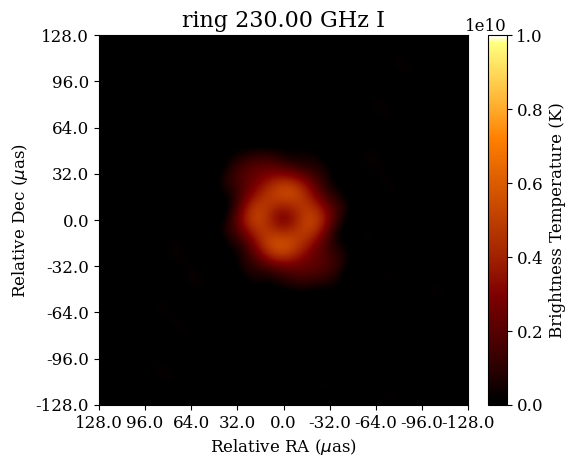

2023-10-18 15:13:51,664 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:51,665 INFO Display              :: Penalty--> 587.860630687186
2023-10-18 15:13:51,805 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:51,806 INFO Display              :: Penalty--> 587.3258975289972
2023-10-18 15:13:51,943 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:51,944 INFO Display              :: Penalty--> 586.365216243079
2023-10-18 15:13:52,108 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:52,109 INFO Display              :: Penalty--> 585.1272094212006
2023-10-18 15:13:52,248 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:52,249 INFO Display              :: Penalty--> 584.630781054705
2023-10-18 15:13:52,385 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:52,386 INFO Display              :: Penalty--> 584.3825665824826
2023-10-18 15:13:52,519 INFO CountIterations      :: iteration = 7 / 25
2023-10

2963.400568227159
Data Fidelity:  88.48068021143284


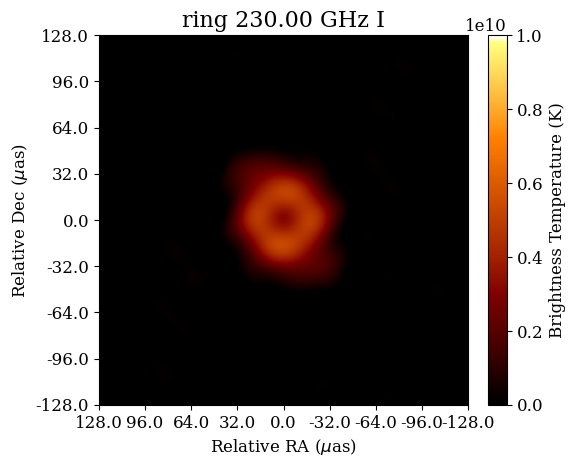

2023-10-18 15:13:55,607 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:55,608 INFO Display              :: Penalty--> 574.4861683422006
2023-10-18 15:13:55,744 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:55,745 INFO Display              :: Penalty--> 574.2594045533262
2023-10-18 15:13:55,873 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:55,874 INFO Display              :: Penalty--> 574.199649078285
2023-10-18 15:13:56,010 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:56,011 INFO Display              :: Penalty--> 573.6342720867417
2023-10-18 15:13:56,146 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:13:56,147 INFO Display              :: Penalty--> 573.1271183785718
2023-10-18 15:13:56,303 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:13:56,304 INFO Display              :: Penalty--> 572.920273081378
2023-10-18 15:13:56,447 INFO CountIterations      :: iteration = 7 / 25
2023-1

2970.2355390115526
Data Fidelity:  69.86089570775201


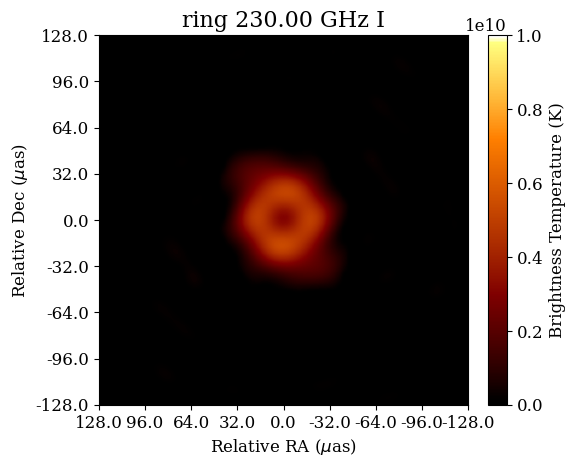

2023-10-18 15:13:59,474 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:13:59,476 INFO Display              :: Penalty--> 565.4891654549757
2023-10-18 15:13:59,612 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:13:59,613 INFO Display              :: Penalty--> 565.4278777882666
2023-10-18 15:13:59,760 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:13:59,761 INFO Display              :: Penalty--> 565.0785392439235
2023-10-18 15:13:59,911 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:13:59,912 INFO Display              :: Penalty--> 564.6556554995294
2023-10-18 15:14:00,101 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:00,102 INFO Display              :: Penalty--> 564.4901793773641
2023-10-18 15:14:00,240 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:00,242 INFO Display              :: Penalty--> 564.1132613830019
2023-10-18 15:14:00,371 INFO CountIterations      :: iteration = 7 / 25
2023

2975.061654783073
Data Fidelity:  58.04543780971665


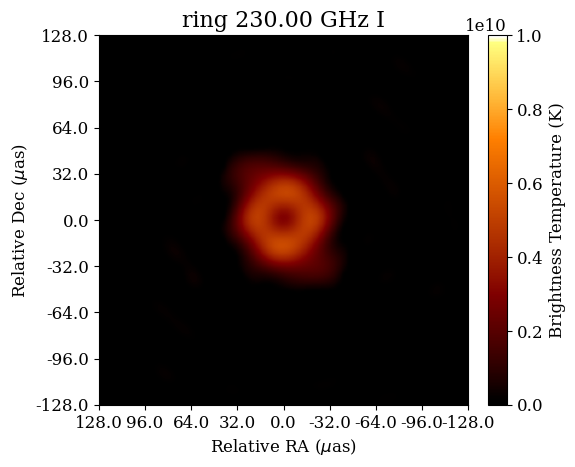

2023-10-18 15:14:03,393 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:03,395 INFO Display              :: Penalty--> 559.157163205886
2023-10-18 15:14:03,545 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:03,547 INFO Display              :: Penalty--> 559.1157940308575
2023-10-18 15:14:03,683 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:03,685 INFO Display              :: Penalty--> 559.0774892391643
2023-10-18 15:14:03,821 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:03,822 INFO Display              :: Penalty--> 559.0162015724552
2023-10-18 15:14:03,977 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:03,979 INFO Display              :: Penalty--> 559.0162015724552
2023-10-18 15:14:04,114 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:04,116 INFO Display              :: Penalty--> 559.0162015724552
2023-10-18 15:14:04,254 INFO CountIterations      :: iteration = 7 / 25
2023-

2978.5615775202123
Data Fidelity:  50.14324377458001


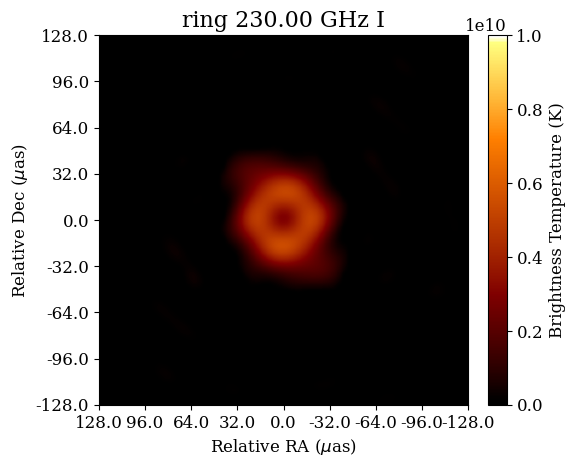

2023-10-18 15:14:07,291 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:07,292 INFO Display              :: Penalty--> 555.1903293812284
2023-10-18 15:14:07,459 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:07,460 INFO Display              :: Penalty--> 555.1903293812284
2023-10-18 15:14:07,602 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:07,603 INFO Display              :: Penalty--> 555.0983978811647
2023-10-18 15:14:07,741 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:07,742 INFO Display              :: Penalty--> 555.0983978811647
2023-10-18 15:14:07,880 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:07,881 INFO Display              :: Penalty--> 555.0064663811012
2023-10-18 15:14:08,029 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:08,032 INFO Display              :: Penalty--> 555.0064663811012
2023-10-18 15:14:08,178 INFO CountIterations      :: iteration = 7 / 25
2023

2981.4235190101863
Data Fidelity:  43.868502086781334


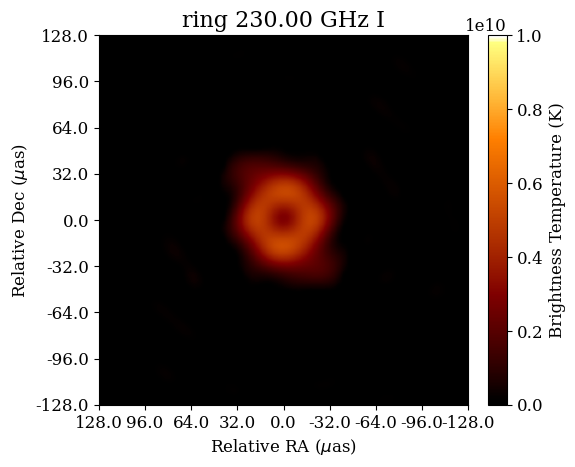

2023-10-18 15:14:11,271 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:11,272 INFO Display              :: Penalty--> 550.4456730763093
2023-10-18 15:14:11,429 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:11,431 INFO Display              :: Penalty--> 550.218909287435
2023-10-18 15:14:11,566 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:11,567 INFO Display              :: Penalty--> 550.2112483290964
2023-10-18 15:14:11,700 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:11,701 INFO Display              :: Penalty--> 550.1698791540678
2023-10-18 15:14:11,846 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:11,848 INFO Display              :: Penalty--> 549.6428069542176
2023-10-18 15:14:11,988 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:11,989 INFO Display              :: Penalty--> 549.3118547098871
2023-10-18 15:14:12,123 INFO CountIterations      :: iteration = 7 / 25
2023-

2983.3855142261114
Data Fidelity:  38.948386586456124


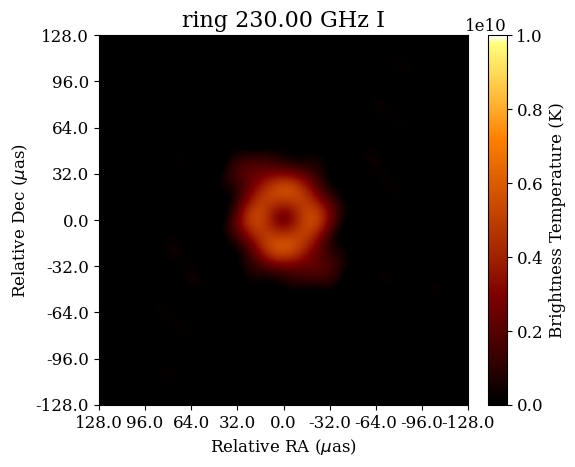

2023-10-18 15:14:15,097 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:15,098 INFO Display              :: Penalty--> 544.3756761803502
2023-10-18 15:14:15,245 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:15,246 INFO Display              :: Penalty--> 544.2837446802865
2023-10-18 15:14:15,397 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:15,399 INFO Display              :: Penalty--> 543.7873163137908
2023-10-18 15:14:15,539 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:15,541 INFO Display              :: Penalty--> 543.7459471387622
2023-10-18 15:14:15,692 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:15,694 INFO Display              :: Penalty--> 543.7153033054077
2023-10-18 15:14:15,845 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:15,847 INFO Display              :: Penalty--> 543.6846594720531
2023-10-18 15:14:15,990 INFO CountIterations      :: iteration = 7 / 25
2023

2985.186242486994
Data Fidelity:  35.15658455258533


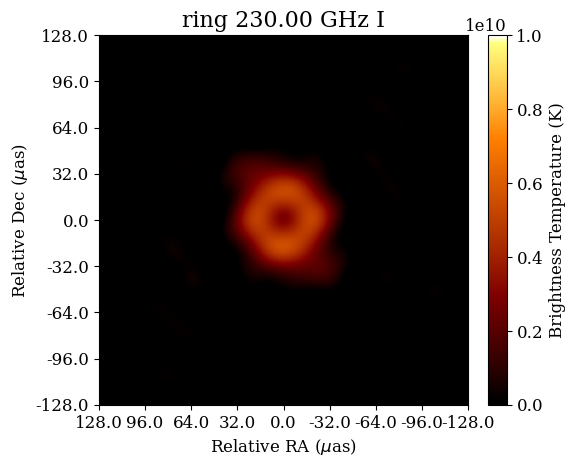

2023-10-18 15:14:19,138 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:19,140 INFO Display              :: Penalty--> 541.738781833533
2023-10-18 15:14:19,300 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:19,302 INFO Display              :: Penalty--> 541.4078295892026
2023-10-18 15:14:19,446 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:19,447 INFO Display              :: Penalty--> 541.2209027836893
2023-10-18 15:14:19,587 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:19,589 INFO Display              :: Penalty--> 541.055426661524
2023-10-18 15:14:19,739 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:19,740 INFO Display              :: Penalty--> 541.055426661524
2023-10-18 15:14:19,880 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:19,881 INFO Display              :: Penalty--> 541.055426661524
2023-10-18 15:14:20,037 INFO CountIterations      :: iteration = 7 / 25
2023-10-

2986.797257963116
Data Fidelity:  32.016111397656154


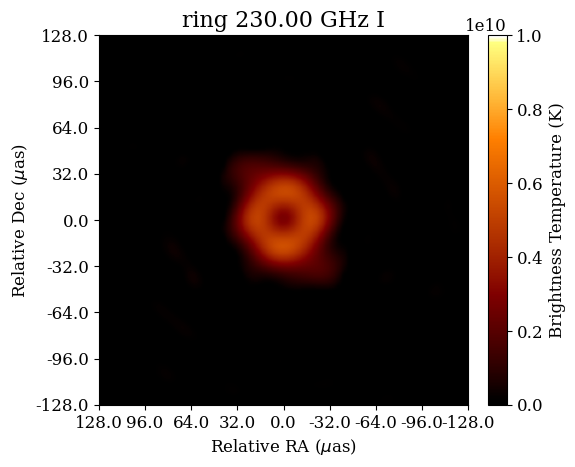

2023-10-18 15:14:23,220 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:23,222 INFO Display              :: Penalty--> 539.2106725171752
2023-10-18 15:14:23,358 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:23,360 INFO Display              :: Penalty--> 539.2106725171752
2023-10-18 15:14:23,493 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:23,494 INFO Display              :: Penalty--> 539.2106725171752
2023-10-18 15:14:23,628 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:23,629 INFO Display              :: Penalty--> 539.0451963950101
2023-10-18 15:14:23,738 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:23,740 INFO Display              :: Penalty--> 539.0145525616555
2023-10-18 15:14:23,867 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:23,868 INFO Display              :: Penalty--> 539.0145525616555
2023-10-18 15:14:23,997 INFO CountIterations      :: iteration = 7 / 25
2023

2987.8551346044487
Data Fidelity:  29.37001685078341


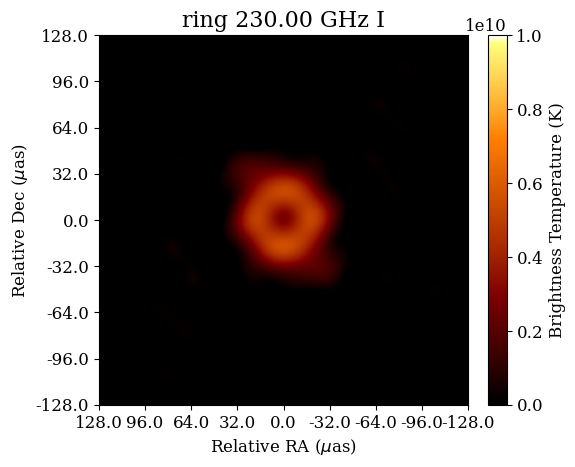

2023-10-18 15:14:27,234 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:27,235 INFO Display              :: Penalty--> 537.1177039006039
2023-10-18 15:14:27,366 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:27,367 INFO Display              :: Penalty--> 537.0870600672494
2023-10-18 15:14:27,499 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:27,500 INFO Display              :: Penalty--> 537.0564162338948
2023-10-18 15:14:27,632 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:27,634 INFO Display              :: Penalty--> 537.0257724005403
2023-10-18 15:14:27,784 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:27,786 INFO Display              :: Penalty--> 536.8602962783751
2023-10-18 15:14:27,935 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:27,938 INFO Display              :: Penalty--> 536.8112661450078
2023-10-18 15:14:28,088 INFO CountIterations      :: iteration = 7 / 25
2023

2988.7407178697395
Data Fidelity:  27.10332219525137


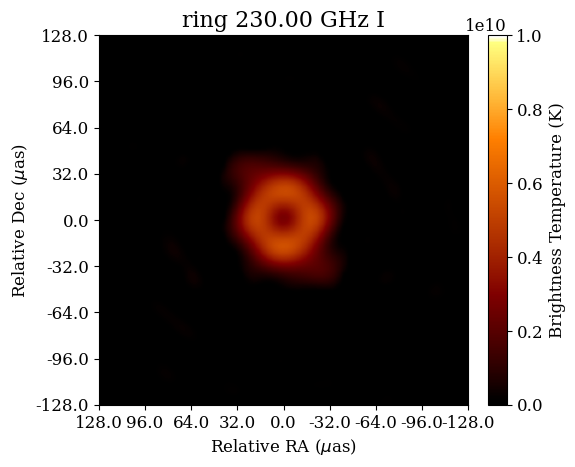

2023-10-18 15:14:31,326 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:31,328 INFO Display              :: Penalty--> 535.1488428091185
2023-10-18 15:14:31,475 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:31,477 INFO Display              :: Penalty--> 535.1488428091185
2023-10-18 15:14:31,608 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:31,609 INFO Display              :: Penalty--> 534.9220790202442
2023-10-18 15:14:31,743 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:31,745 INFO Display              :: Penalty--> 534.9220790202442
2023-10-18 15:14:31,888 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:31,891 INFO Display              :: Penalty--> 534.9220790202442
2023-10-18 15:14:32,038 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:32,041 INFO Display              :: Penalty--> 534.7489419397403
2023-10-18 15:14:32,177 INFO CountIterations      :: iteration = 7 / 25
2023

2989.90008383403
Data Fidelity:  25.05209311842551


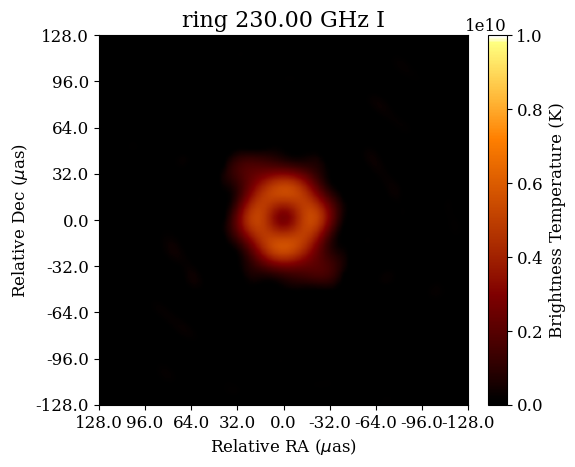

2023-10-18 15:14:35,246 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:35,247 INFO Display              :: Penalty--> 532.5196099985892
2023-10-18 15:14:35,405 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:35,406 INFO Display              :: Penalty--> 532.5196099985892
2023-10-18 15:14:35,549 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:35,550 INFO Display              :: Penalty--> 532.5196099985892
2023-10-18 15:14:35,687 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:35,689 INFO Display              :: Penalty--> 532.4889661652347
2023-10-18 15:14:35,851 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:35,852 INFO Display              :: Penalty--> 532.4889661652347
2023-10-18 15:14:36,001 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:36,003 INFO Display              :: Penalty--> 532.3127647013953
2023-10-18 15:14:36,135 INFO CountIterations      :: iteration = 7 / 25
2023

2990.345832111233
Data Fidelity:  23.306992339088332


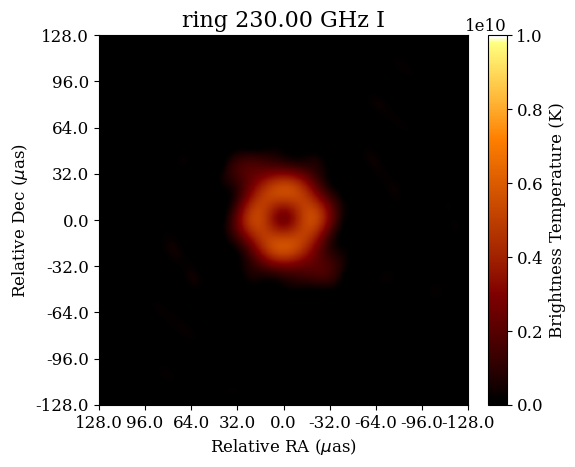

2023-10-18 15:14:39,184 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:39,186 INFO Display              :: Penalty--> 530.7867058459844
2023-10-18 15:14:39,330 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:39,332 INFO Display              :: Penalty--> 530.7867058459844
2023-10-18 15:14:39,465 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:39,467 INFO Display              :: Penalty--> 530.6105043821451
2023-10-18 15:14:39,600 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:39,602 INFO Display              :: Penalty--> 530.5798605487905
2023-10-18 15:14:39,742 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:39,744 INFO Display              :: Penalty--> 530.4143844266254
2023-10-18 15:14:39,893 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:39,895 INFO Display              :: Penalty--> 530.0757712239563
2023-10-18 15:14:40,029 INFO CountIterations      :: iteration = 7 / 25
2023

2991.0651357073
Data Fidelity:  21.76601626378308


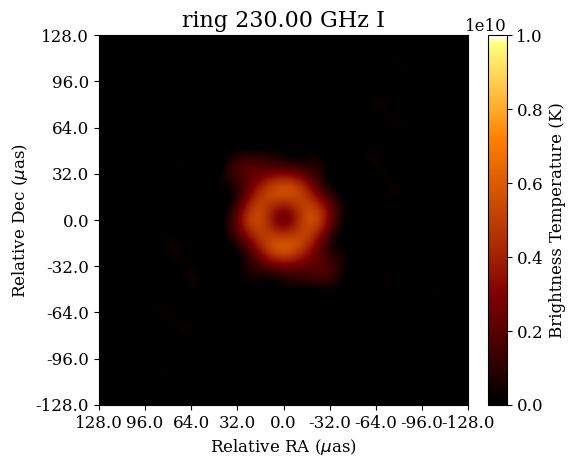

2023-10-18 15:14:43,018 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:43,020 INFO Display              :: Penalty--> 528.381172440994
2023-10-18 15:14:43,172 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:43,173 INFO Display              :: Penalty--> 528.3505286076395
2023-10-18 15:14:43,336 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:43,337 INFO Display              :: Penalty--> 528.1544086521197
2023-10-18 15:14:43,476 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:43,477 INFO Display              :: Penalty--> 527.9889325299545
2023-10-18 15:14:43,621 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:43,623 INFO Display              :: Penalty--> 527.9889325299545
2023-10-18 15:14:43,786 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:43,788 INFO Display              :: Penalty--> 527.9506277382613
2023-10-18 15:14:43,929 INFO CountIterations      :: iteration = 7 / 25
2023-

2991.7224358508147
Data Fidelity:  20.403027456503754


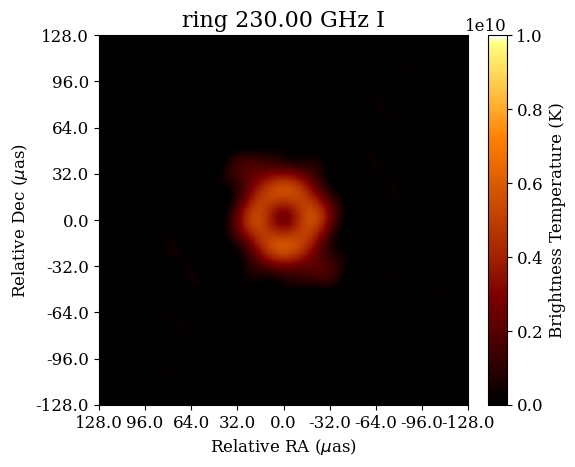

2023-10-18 15:14:47,177 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:47,178 INFO Display              :: Penalty--> 526.628350374658
2023-10-18 15:14:47,319 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:47,321 INFO Display              :: Penalty--> 526.5977065413034
2023-10-18 15:14:47,479 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:47,481 INFO Display              :: Penalty--> 526.5670627079489
2023-10-18 15:14:47,617 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:47,619 INFO Display              :: Penalty--> 526.5594017496103
2023-10-18 15:14:47,753 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:47,754 INFO Display              :: Penalty--> 526.5517407912718
2023-10-18 15:14:47,897 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:47,898 INFO Display              :: Penalty--> 526.2207885469413
2023-10-18 15:14:48,042 INFO CountIterations      :: iteration = 7 / 25
2023-

2992.2132942281974
Data Fidelity:  19.2021998606478


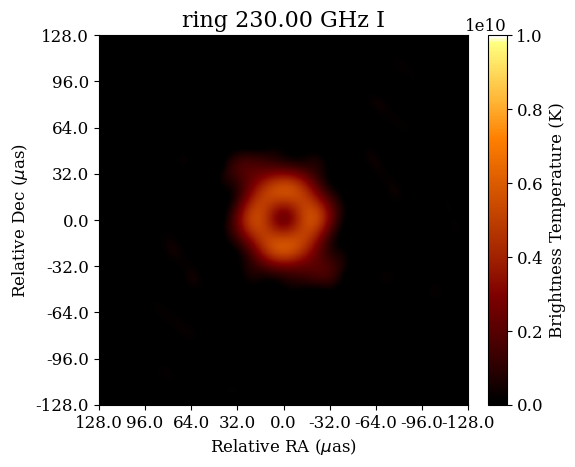

2023-10-18 15:14:51,108 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:51,110 INFO Display              :: Penalty--> 525.5313040303121
2023-10-18 15:14:51,241 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:51,242 INFO Display              :: Penalty--> 525.5313040303121
2023-10-18 15:14:51,396 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:51,398 INFO Display              :: Penalty--> 525.3658279081469
2023-10-18 15:14:51,534 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:51,535 INFO Display              :: Penalty--> 525.3658279081469
2023-10-18 15:14:51,671 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:51,673 INFO Display              :: Penalty--> 525.3658279081469
2023-10-18 15:14:51,815 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:51,816 INFO Display              :: Penalty--> 525.3351840747923
2023-10-18 15:14:51,959 INFO CountIterations      :: iteration = 7 / 25
2023

2992.759049492962
Data Fidelity:  18.116094544641495


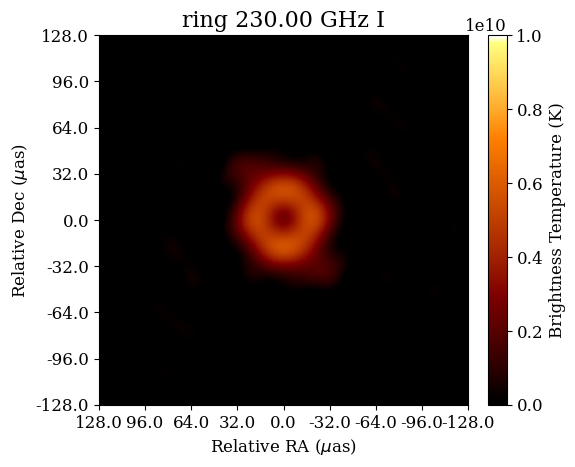

2023-10-18 15:14:55,127 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:55,129 INFO Display              :: Penalty--> 524.3024897804909
2023-10-18 15:14:55,273 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:55,274 INFO Display              :: Penalty--> 524.3024897804909
2023-10-18 15:14:55,411 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:55,412 INFO Display              :: Penalty--> 524.1262883166515
2023-10-18 15:14:55,550 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:55,552 INFO Display              :: Penalty--> 524.0879835249583
2023-10-18 15:14:55,699 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:55,701 INFO Display              :: Penalty--> 523.9225074027931
2023-10-18 15:14:55,848 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:55,850 INFO Display              :: Penalty--> 523.7493703222892
2023-10-18 15:14:55,984 INFO CountIterations      :: iteration = 7 / 25
2023

2993.0969887777
Data Fidelity:  17.11638071591001


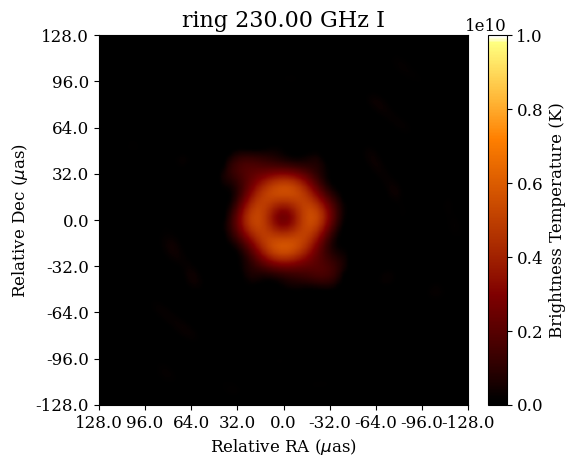

2023-10-18 15:14:59,204 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:14:59,205 INFO Display              :: Penalty--> 522.6431314058862
2023-10-18 15:14:59,346 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:14:59,348 INFO Display              :: Penalty--> 522.6431314058862
2023-10-18 15:14:59,480 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:14:59,482 INFO Display              :: Penalty--> 522.6431314058862
2023-10-18 15:14:59,616 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:14:59,618 INFO Display              :: Penalty--> 522.6431314058862
2023-10-18 15:14:59,765 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:14:59,767 INFO Display              :: Penalty--> 522.6431314058862
2023-10-18 15:14:59,914 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:14:59,916 INFO Display              :: Penalty--> 522.6431314058862
2023-10-18 15:15:00,049 INFO CountIterations      :: iteration = 7 / 25
2023

2993.504887209361
Data Fidelity:  16.200805853786242


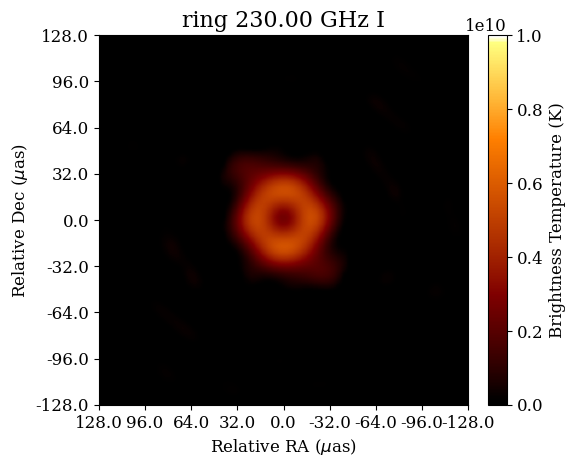

2023-10-18 15:15:03,075 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:03,076 INFO Display              :: Penalty--> 520.9393394729176
2023-10-18 15:15:03,218 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:03,219 INFO Display              :: Penalty--> 520.9393394729176
2023-10-18 15:15:03,355 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:03,357 INFO Display              :: Penalty--> 520.7432195173977
2023-10-18 15:15:03,518 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:03,519 INFO Display              :: Penalty--> 520.7432195173977
2023-10-18 15:15:03,665 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:03,667 INFO Display              :: Penalty--> 520.7432195173977
2023-10-18 15:15:03,819 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:03,820 INFO Display              :: Penalty--> 520.7432195173977
2023-10-18 15:15:03,965 INFO CountIterations      :: iteration = 7 / 25
2023

2993.814635368691
Data Fidelity:  15.397701462133021


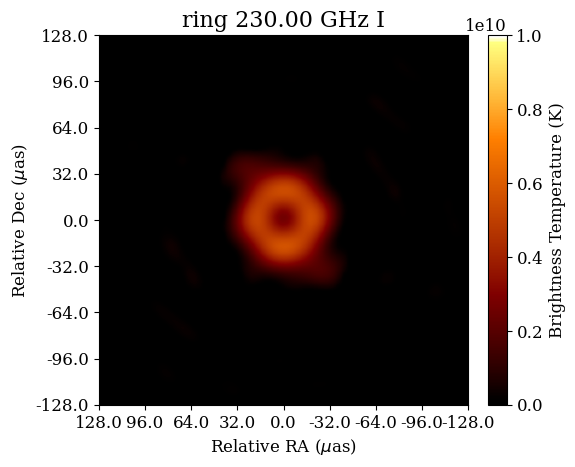

2023-10-18 15:15:06,957 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:06,959 INFO Display              :: Penalty--> 520.0537350007686
2023-10-18 15:15:07,126 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:07,128 INFO Display              :: Penalty--> 520.0537350007686
2023-10-18 15:15:07,267 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:07,268 INFO Display              :: Penalty--> 520.0537350007686
2023-10-18 15:15:07,412 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:07,414 INFO Display              :: Penalty--> 519.8576150452487
2023-10-18 15:15:07,555 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:07,556 INFO Display              :: Penalty--> 519.6814135814095
2023-10-18 15:15:07,690 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:07,691 INFO Display              :: Penalty--> 519.650769748055
2023-10-18 15:15:07,826 INFO CountIterations      :: iteration = 7 / 25
2023-

2994.1487160613688
Data Fidelity:  14.623328794190922


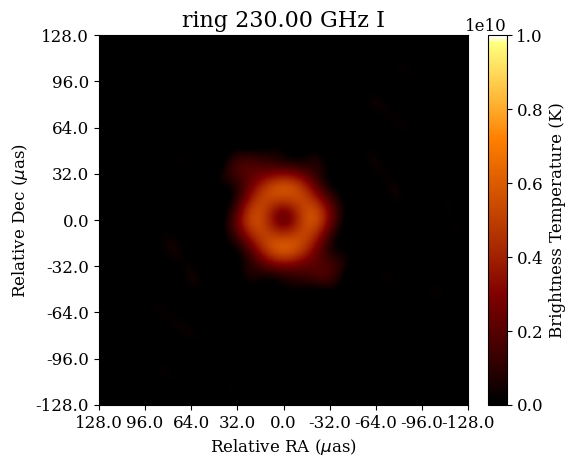

2023-10-18 15:15:10,767 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:10,768 INFO Display              :: Penalty--> 518.4112301565598
2023-10-18 15:15:10,902 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:10,904 INFO Display              :: Penalty--> 518.4112301565598
2023-10-18 15:15:11,035 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:11,037 INFO Display              :: Penalty--> 518.4112301565598
2023-10-18 15:15:11,170 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:11,172 INFO Display              :: Penalty--> 518.4112301565598
2023-10-18 15:15:11,313 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:11,315 INFO Display              :: Penalty--> 518.4112301565598
2023-10-18 15:15:11,450 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:11,452 INFO Display              :: Penalty--> 518.3805863232052
2023-10-18 15:15:11,586 INFO CountIterations      :: iteration = 7 / 25
2023

2994.3983288174286
Data Fidelity:  13.92881770327233


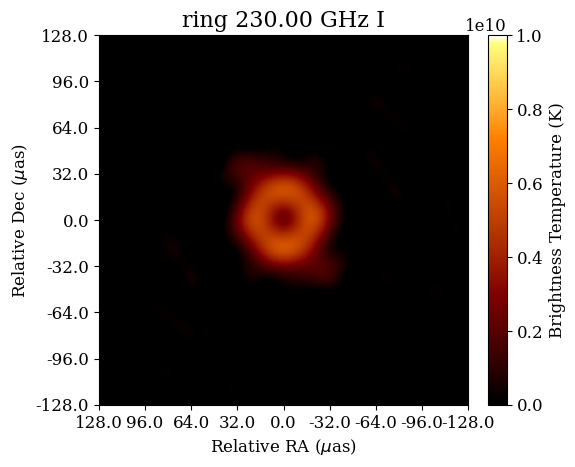

2023-10-18 15:15:14,462 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:14,464 INFO Display              :: Penalty--> 516.7595321623445
2023-10-18 15:15:14,610 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:14,611 INFO Display              :: Penalty--> 516.7288883289899
2023-10-18 15:15:14,754 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:14,755 INFO Display              :: Penalty--> 516.3979360846595
2023-10-18 15:15:14,894 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:14,896 INFO Display              :: Penalty--> 516.3979360846595
2023-10-18 15:15:15,040 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:15,041 INFO Display              :: Penalty--> 516.3979360846595
2023-10-18 15:15:15,181 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:15,183 INFO Display              :: Penalty--> 516.3979360846595
2023-10-18 15:15:15,324 INFO CountIterations      :: iteration = 7 / 25
2023

2994.812917952985
Data Fidelity:  13.308801283078221


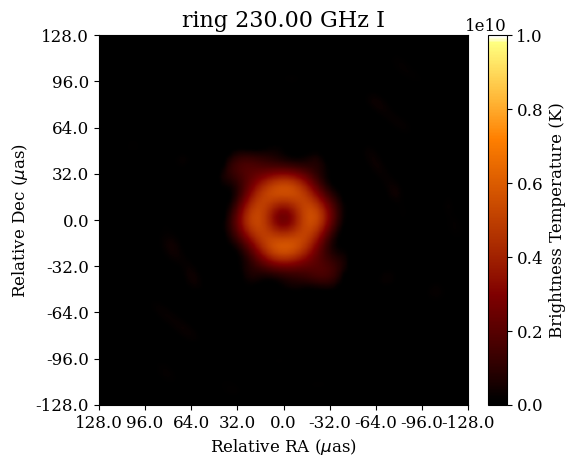

2023-10-18 15:15:18,381 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:18,382 INFO Display              :: Penalty--> 516.3075367762636
2023-10-18 15:15:18,518 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:18,520 INFO Display              :: Penalty--> 516.3075367762636
2023-10-18 15:15:18,658 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:18,660 INFO Display              :: Penalty--> 516.1313353124243
2023-10-18 15:15:18,797 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:18,799 INFO Display              :: Penalty--> 516.1313353124243
2023-10-18 15:15:18,935 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:18,936 INFO Display              :: Penalty--> 516.1313353124243
2023-10-18 15:15:19,071 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:19,073 INFO Display              :: Penalty--> 516.1006914790697
2023-10-18 15:15:19,205 INFO CountIterations      :: iteration = 7 / 25
2023

2995.097911391478
Data Fidelity:  12.734529347956247


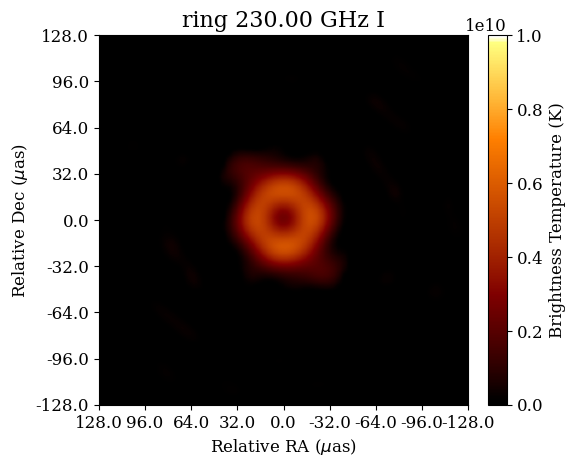

2023-10-18 15:15:22,248 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:22,250 INFO Display              :: Penalty--> 515.7099831817487
2023-10-18 15:15:22,395 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:22,397 INFO Display              :: Penalty--> 515.5445070595836
2023-10-18 15:15:22,533 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:22,534 INFO Display              :: Penalty--> 515.5445070595836
2023-10-18 15:15:22,670 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:22,672 INFO Display              :: Penalty--> 515.5445070595836
2023-10-18 15:15:22,801 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:22,803 INFO Display              :: Penalty--> 515.3683055957441
2023-10-18 15:15:22,942 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:22,944 INFO Display              :: Penalty--> 515.3683055957441
2023-10-18 15:15:23,079 INFO CountIterations      :: iteration = 7 / 25
2023

2995.194289695516
Data Fidelity:  12.195159776996967


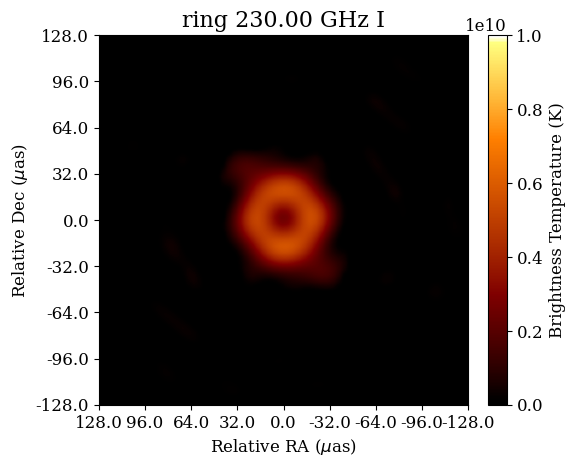

2023-10-18 15:15:26,051 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:26,052 INFO Display              :: Penalty--> 514.5960827290577
2023-10-18 15:15:26,183 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:26,184 INFO Display              :: Penalty--> 514.5960827290577
2023-10-18 15:15:26,315 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:26,316 INFO Display              :: Penalty--> 514.5960827290577
2023-10-18 15:15:26,446 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:26,448 INFO Display              :: Penalty--> 514.5960827290577
2023-10-18 15:15:26,586 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:26,587 INFO Display              :: Penalty--> 514.5960827290577
2023-10-18 15:15:26,724 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:26,726 INFO Display              :: Penalty--> 514.5960827290577
2023-10-18 15:15:26,861 INFO CountIterations      :: iteration = 7 / 25
2023

2995.4137040782175
Data Fidelity:  11.702901771009493


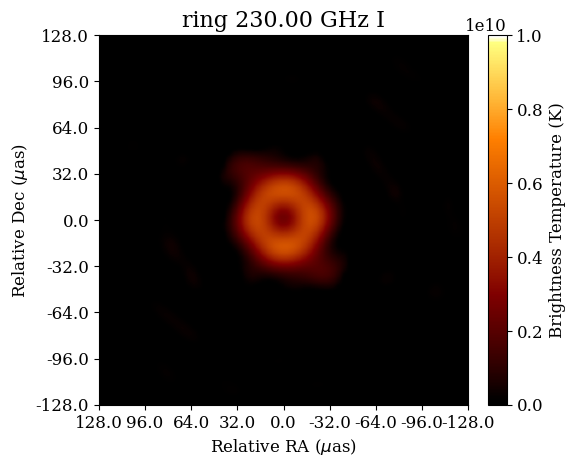

2023-10-18 15:15:29,773 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:29,775 INFO Display              :: Penalty--> 513.7380582848771
2023-10-18 15:15:29,911 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:29,912 INFO Display              :: Penalty--> 513.7380582848771
2023-10-18 15:15:30,047 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:30,048 INFO Display              :: Penalty--> 513.7380582848771
2023-10-18 15:15:30,184 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:30,185 INFO Display              :: Penalty--> 513.7380582848771
2023-10-18 15:15:30,317 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:30,319 INFO Display              :: Penalty--> 513.7380582848771
2023-10-18 15:15:30,453 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:30,454 INFO Display              :: Penalty--> 513.5725821627119
2023-10-18 15:15:30,590 INFO CountIterations      :: iteration = 7 / 25
2023

2995.607760553345
Data Fidelity:  11.23305270367199


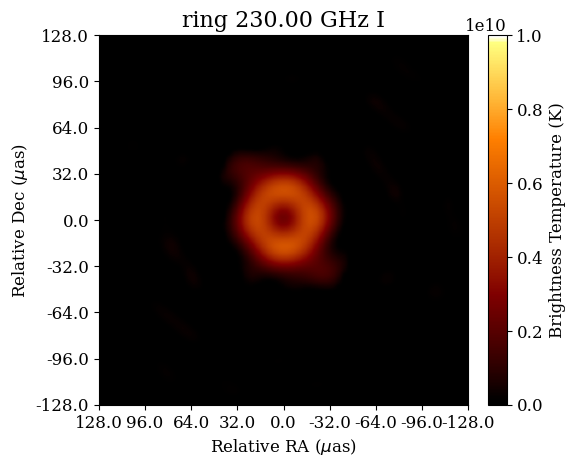

2023-10-18 15:15:33,493 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:33,495 INFO Display              :: Penalty--> 512.7666516572848
2023-10-18 15:15:33,637 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:33,640 INFO Display              :: Penalty--> 512.7666516572848
2023-10-18 15:15:33,775 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:33,777 INFO Display              :: Penalty--> 512.6011755351195
2023-10-18 15:15:33,914 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:33,916 INFO Display              :: Penalty--> 512.6011755351195
2023-10-18 15:15:34,053 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:34,055 INFO Display              :: Penalty--> 512.6011755351195
2023-10-18 15:15:34,185 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:34,187 INFO Display              :: Penalty--> 512.4356994129544
2023-10-18 15:15:34,323 INFO CountIterations      :: iteration = 7 / 25
2023

2995.7415220661733
Data Fidelity:  10.813848712510985


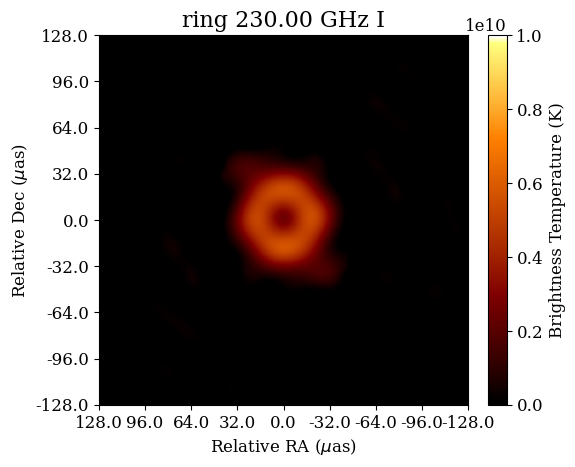

2023-10-18 15:15:37,264 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:37,266 INFO Display              :: Penalty--> 511.67420246589126
2023-10-18 15:15:37,412 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:37,414 INFO Display              :: Penalty--> 511.67420246589126
2023-10-18 15:15:37,556 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:37,557 INFO Display              :: Penalty--> 511.67420246589126
2023-10-18 15:15:37,717 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:37,718 INFO Display              :: Penalty--> 511.67420246589126
2023-10-18 15:15:37,848 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:37,849 INFO Display              :: Penalty--> 511.6052538408435
2023-10-18 15:15:37,981 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:37,983 INFO Display              :: Penalty--> 511.6052538408435
2023-10-18 15:15:38,127 INFO CountIterations      :: iteration = 7 / 25


2995.8969502714267
Data Fidelity:  10.414763933964926


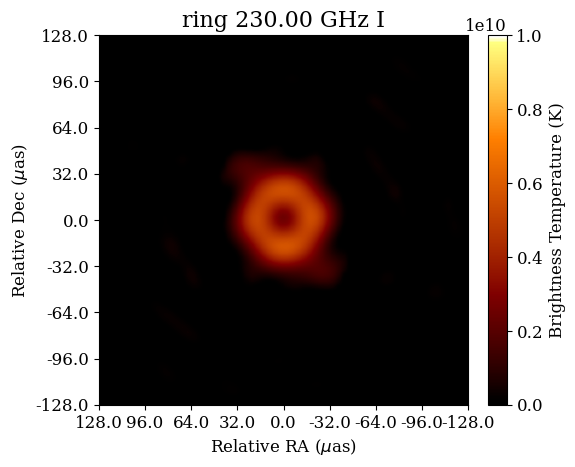

2023-10-18 15:15:41,011 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:41,012 INFO Display              :: Penalty--> 510.9985076742715
2023-10-18 15:15:41,149 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:41,151 INFO Display              :: Penalty--> 510.9985076742715
2023-10-18 15:15:41,281 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:41,283 INFO Display              :: Penalty--> 510.9985076742715
2023-10-18 15:15:41,418 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:41,420 INFO Display              :: Penalty--> 510.9985076742715
2023-10-18 15:15:41,556 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:41,558 INFO Display              :: Penalty--> 510.9985076742715
2023-10-18 15:15:41,694 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:41,696 INFO Display              :: Penalty--> 510.9985076742715
2023-10-18 15:15:41,833 INFO CountIterations      :: iteration = 7 / 25
2023

2996.058086984948
Data Fidelity:  10.057081488496392


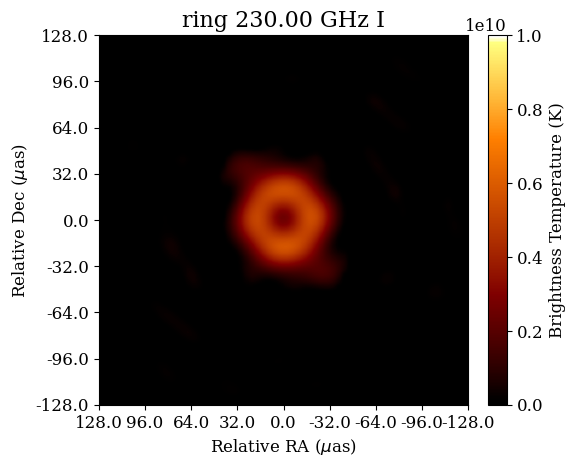

2023-10-18 15:15:44,795 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:44,796 INFO Display              :: Penalty--> 509.9448906938194
2023-10-18 15:15:44,930 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:44,932 INFO Display              :: Penalty--> 509.93416535214527
2023-10-18 15:15:45,063 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:45,065 INFO Display              :: Penalty--> 509.93416535214527
2023-10-18 15:15:45,199 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:45,200 INFO Display              :: Penalty--> 509.93416535214527
2023-10-18 15:15:45,341 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:45,343 INFO Display              :: Penalty--> 509.93416535214527
2023-10-18 15:15:45,478 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:45,479 INFO Display              :: Penalty--> 509.76868922998
2023-10-18 15:15:45,614 INFO CountIterations      :: iteration = 7 / 25
20

2996.2849540700604
Data Fidelity:  9.72232690477408


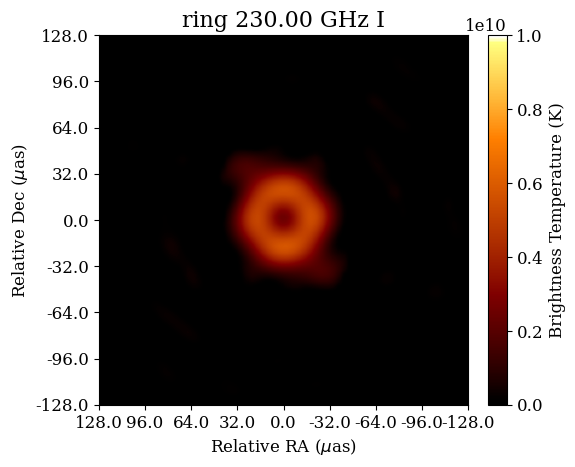

2023-10-18 15:15:48,653 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:48,654 INFO Display              :: Penalty--> 509.32741918557326
2023-10-18 15:15:48,790 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:48,791 INFO Display              :: Penalty--> 509.28911439388014
2023-10-18 15:15:48,931 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:48,932 INFO Display              :: Penalty--> 509.28911439388014
2023-10-18 15:15:49,064 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:49,066 INFO Display              :: Penalty--> 509.28911439388014
2023-10-18 15:15:49,226 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:49,228 INFO Display              :: Penalty--> 509.28911439388014
2023-10-18 15:15:49,366 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:49,367 INFO Display              :: Penalty--> 509.123638271715
2023-10-18 15:15:49,517 INFO CountIterations      :: iteration = 7 / 25


2996.365278693208
Data Fidelity:  9.405913476297629


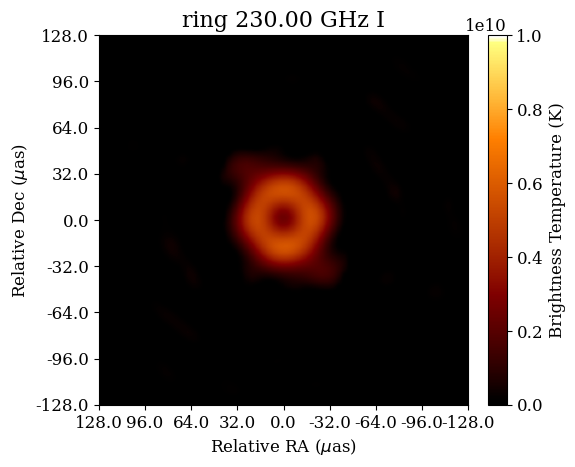

2023-10-18 15:15:52,614 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:52,616 INFO Display              :: Penalty--> 507.8840986802196
2023-10-18 15:15:52,753 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:52,754 INFO Display              :: Penalty--> 507.8840986802196
2023-10-18 15:15:52,900 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:52,902 INFO Display              :: Penalty--> 507.8840986802196
2023-10-18 15:15:53,067 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:53,068 INFO Display              :: Penalty--> 507.8534548468651
2023-10-18 15:15:53,204 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:53,205 INFO Display              :: Penalty--> 507.82281101351055
2023-10-18 15:15:53,345 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:53,346 INFO Display              :: Penalty--> 507.82281101351055
2023-10-18 15:15:53,502 INFO CountIterations      :: iteration = 7 / 25
20

2996.520073525171
Data Fidelity:  9.113458880713459


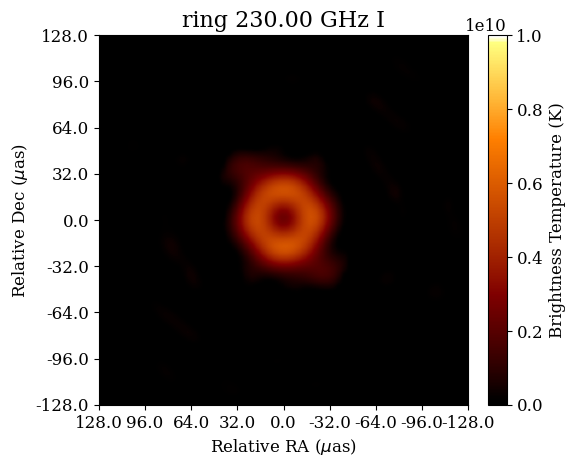

2023-10-18 15:15:56,643 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:15:56,645 INFO Display              :: Penalty--> 507.48113342750605
2023-10-18 15:15:56,777 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:15:56,779 INFO Display              :: Penalty--> 507.48113342750605
2023-10-18 15:15:56,933 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:15:56,934 INFO Display              :: Penalty--> 507.4504895941515
2023-10-18 15:15:57,076 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:15:57,078 INFO Display              :: Penalty--> 507.28501347198625
2023-10-18 15:15:57,213 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:15:57,214 INFO Display              :: Penalty--> 507.27428813031213
2023-10-18 15:15:57,359 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:15:57,360 INFO Display              :: Penalty--> 507.10881200814697
2023-10-18 15:15:57,499 INFO CountIterations      :: iteration = 7 / 25

2996.6772595110133
Data Fidelity:  8.836559425705405


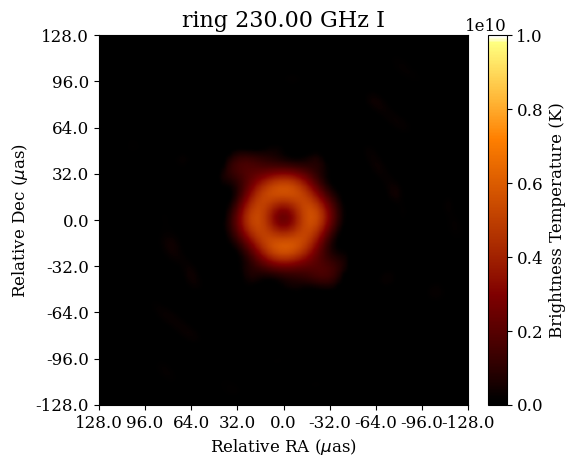

2023-10-18 15:16:00,548 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:00,550 INFO Display              :: Penalty--> 506.66447758040476
2023-10-18 15:16:00,682 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:00,684 INFO Display              :: Penalty--> 506.66447758040476
2023-10-18 15:16:00,820 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:00,822 INFO Display              :: Penalty--> 506.66447758040476
2023-10-18 15:16:00,979 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:00,981 INFO Display              :: Penalty--> 506.63383374705023
2023-10-18 15:16:01,125 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:01,127 INFO Display              :: Penalty--> 506.63383374705023
2023-10-18 15:16:01,281 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:01,284 INFO Display              :: Penalty--> 506.6031899136957
2023-10-18 15:16:01,440 INFO CountIterations      :: iteration = 7 / 25

2996.753665466559
Data Fidelity:  8.574960018711055


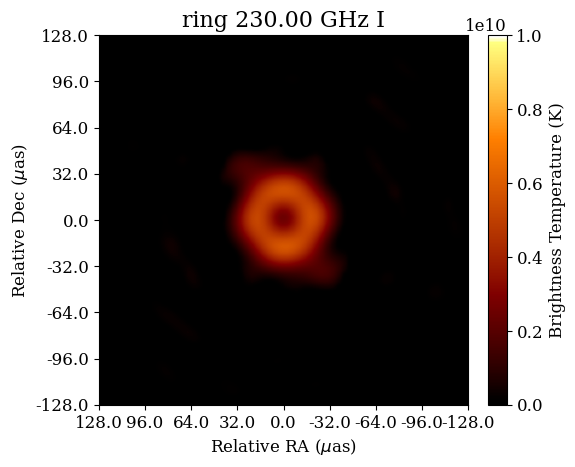

2023-10-18 15:16:04,562 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:04,563 INFO Display              :: Penalty--> 506.0546664525481
2023-10-18 15:16:04,703 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:04,705 INFO Display              :: Penalty--> 506.0546664525481
2023-10-18 15:16:04,873 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:04,875 INFO Display              :: Penalty--> 506.0546664525481
2023-10-18 15:16:05,035 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:05,036 INFO Display              :: Penalty--> 506.0546664525481
2023-10-18 15:16:05,181 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:05,183 INFO Display              :: Penalty--> 506.0546664525481
2023-10-18 15:16:05,350 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:05,352 INFO Display              :: Penalty--> 506.0546664525481
2023-10-18 15:16:05,514 INFO CountIterations      :: iteration = 7 / 25
2023

2996.9117158440313
Data Fidelity:  8.348267999665067


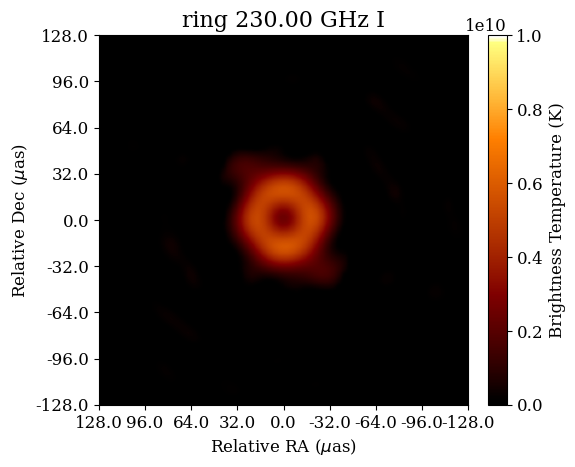

2023-10-18 15:16:08,735 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:08,737 INFO Display              :: Penalty--> 505.8478211553542
2023-10-18 15:16:08,909 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:08,911 INFO Display              :: Penalty--> 505.8478211553542
2023-10-18 15:16:09,053 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:09,055 INFO Display              :: Penalty--> 505.8478211553542
2023-10-18 15:16:09,204 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:09,206 INFO Display              :: Penalty--> 505.8478211553542
2023-10-18 15:16:09,350 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:09,351 INFO Display              :: Penalty--> 505.8478211553542
2023-10-18 15:16:09,487 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:09,489 INFO Display              :: Penalty--> 505.8478211553542
2023-10-18 15:16:09,622 INFO CountIterations      :: iteration = 7 / 25
2023

2997.0118380694166
Data Fidelity:  8.119729365442558


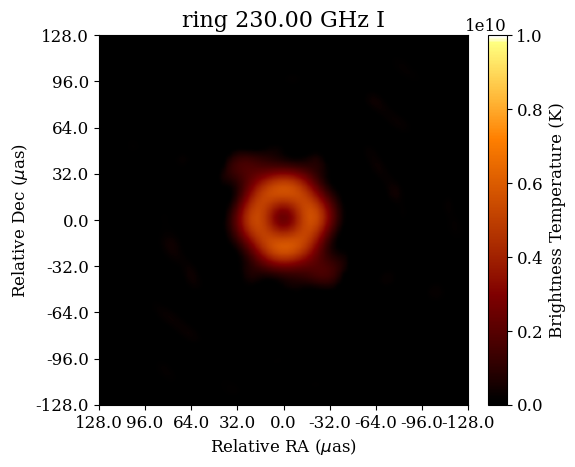

2023-10-18 15:16:13,044 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:13,046 INFO Display              :: Penalty--> 505.2594612887949
2023-10-18 15:16:13,189 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:13,191 INFO Display              :: Penalty--> 505.2594612887949
2023-10-18 15:16:13,333 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:13,335 INFO Display              :: Penalty--> 505.2594612887949
2023-10-18 15:16:13,499 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:13,501 INFO Display              :: Penalty--> 505.2288174554404
2023-10-18 15:16:13,665 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:13,667 INFO Display              :: Penalty--> 505.2288174554404
2023-10-18 15:16:13,802 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:13,804 INFO Display              :: Penalty--> 505.06334133327516
2023-10-18 15:16:13,943 INFO CountIterations      :: iteration = 7 / 25
202

2997.1496654561315
Data Fidelity:  7.907175067904896


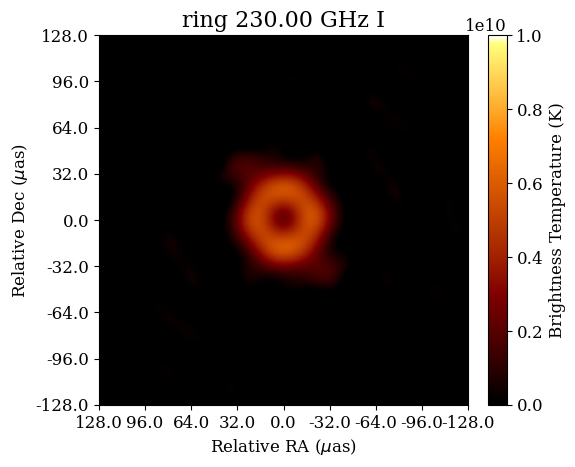

2023-10-18 15:16:16,918 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:16,919 INFO Display              :: Penalty--> 504.8151268610527
2023-10-18 15:16:17,052 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:17,053 INFO Display              :: Penalty--> 504.8151268610527
2023-10-18 15:16:17,190 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:17,191 INFO Display              :: Penalty--> 504.8151268610527
2023-10-18 15:16:17,323 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:17,324 INFO Display              :: Penalty--> 504.8151268610527
2023-10-18 15:16:17,456 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:17,458 INFO Display              :: Penalty--> 504.8151268610527
2023-10-18 15:16:17,605 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:17,607 INFO Display              :: Penalty--> 504.7844830276982
2023-10-18 15:16:17,755 INFO CountIterations      :: iteration = 7 / 25
2023

2997.2096313061475
Data Fidelity:  7.71397076473037


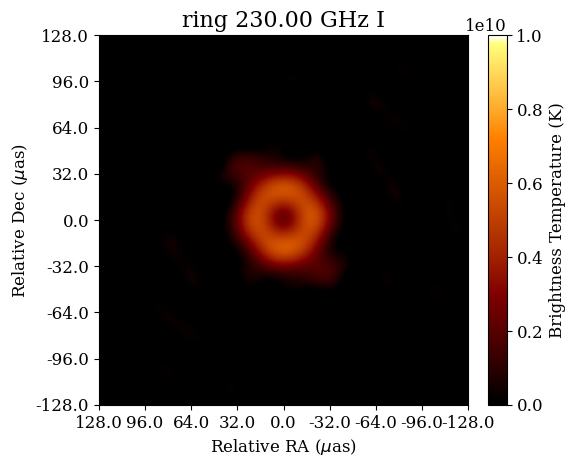

2023-10-18 15:16:20,916 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:20,918 INFO Display              :: Penalty--> 504.38917873332326
2023-10-18 15:16:21,063 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:21,064 INFO Display              :: Penalty--> 504.38917873332326
2023-10-18 15:16:21,199 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:21,201 INFO Display              :: Penalty--> 504.38917873332326
2023-10-18 15:16:21,336 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:21,338 INFO Display              :: Penalty--> 504.38917873332326
2023-10-18 15:16:21,472 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:21,474 INFO Display              :: Penalty--> 504.22370261115805
2023-10-18 15:16:21,618 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:21,620 INFO Display              :: Penalty--> 504.22370261115805
2023-10-18 15:16:21,759 INFO CountIterations      :: iteration = 7 / 2

2997.2915287533087
Data Fidelity:  7.5183980181610295


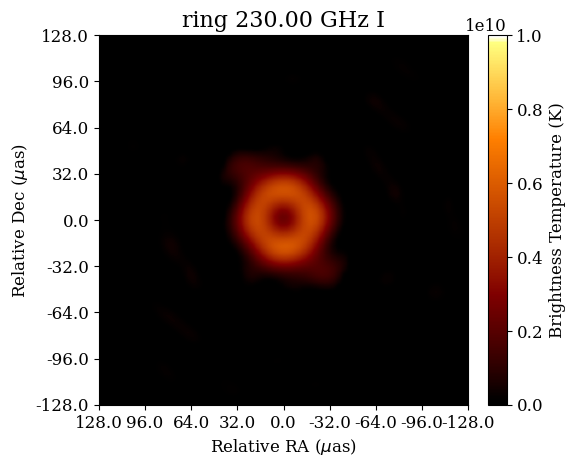

2023-10-18 15:16:24,853 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:24,854 INFO Display              :: Penalty--> 503.6353427445988
2023-10-18 15:16:24,995 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:24,997 INFO Display              :: Penalty--> 503.6353427445988
2023-10-18 15:16:25,141 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:25,143 INFO Display              :: Penalty--> 503.6353427445988
2023-10-18 15:16:25,278 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:25,279 INFO Display              :: Penalty--> 503.6353427445988
2023-10-18 15:16:25,426 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:25,427 INFO Display              :: Penalty--> 503.6353427445988
2023-10-18 15:16:25,570 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:25,572 INFO Display              :: Penalty--> 503.6246174029247
2023-10-18 15:16:25,719 INFO CountIterations      :: iteration = 7 / 25
2023

2997.3700106061187
Data Fidelity:  7.345329275537894


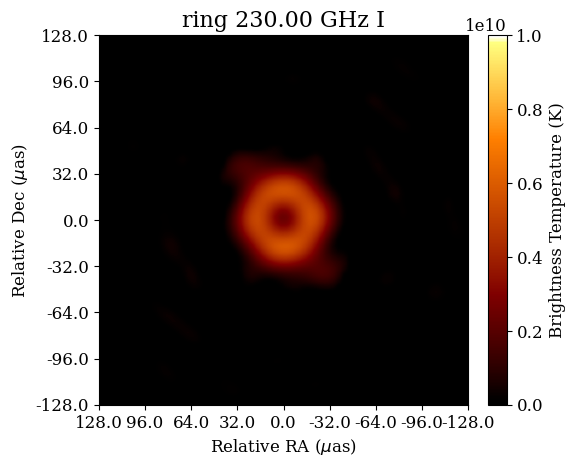

2023-10-18 15:16:28,862 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:28,864 INFO Display              :: Penalty--> 503.53268590286115
2023-10-18 15:16:29,002 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:29,003 INFO Display              :: Penalty--> 503.53268590286115
2023-10-18 15:16:29,151 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:29,152 INFO Display              :: Penalty--> 503.53268590286115
2023-10-18 15:16:29,305 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:29,307 INFO Display              :: Penalty--> 503.53268590286115
2023-10-18 15:16:29,463 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:29,465 INFO Display              :: Penalty--> 503.50204206950656
2023-10-18 15:16:29,600 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:29,602 INFO Display              :: Penalty--> 503.50204206950656
2023-10-18 15:16:29,735 INFO CountIterations      :: iteration = 7 / 2

2997.4780935796935
Data Fidelity:  7.184686306077626


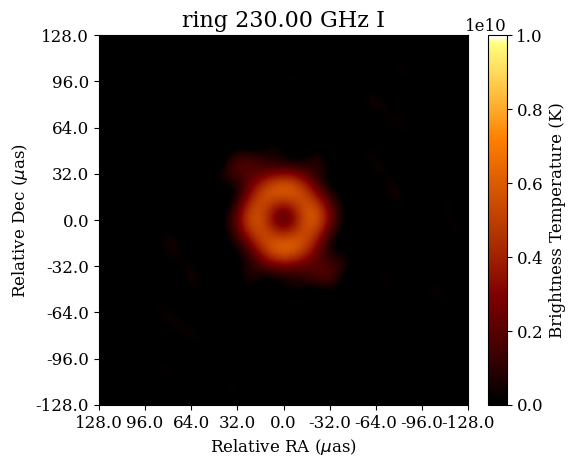

2023-10-18 15:16:32,883 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:32,885 INFO Display              :: Penalty--> 503.3258406056673
2023-10-18 15:16:33,043 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:33,045 INFO Display              :: Penalty--> 503.3258406056673
2023-10-18 15:16:33,211 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:33,212 INFO Display              :: Penalty--> 503.3258406056673
2023-10-18 15:16:33,359 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:33,360 INFO Display              :: Penalty--> 503.3258406056673
2023-10-18 15:16:33,499 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:33,500 INFO Display              :: Penalty--> 503.3258406056673
2023-10-18 15:16:33,645 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:33,647 INFO Display              :: Penalty--> 503.3258406056673
2023-10-18 15:16:33,787 INFO CountIterations      :: iteration = 7 / 25
2023

2997.5239577289476
Data Fidelity:  7.028408040236083


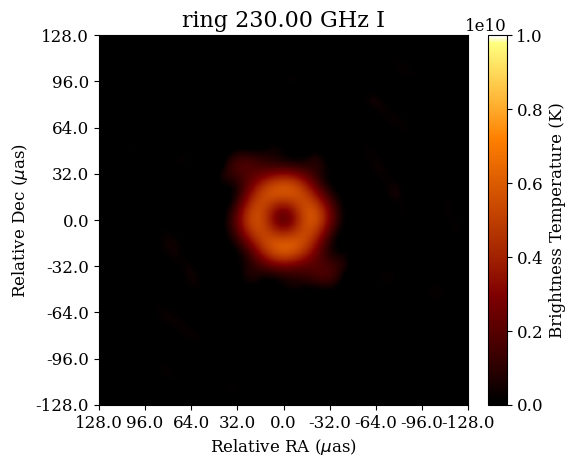

2023-10-18 15:16:36,995 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:36,997 INFO Display              :: Penalty--> 503.03012819174523
2023-10-18 15:16:37,142 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:37,144 INFO Display              :: Penalty--> 503.03012819174523
2023-10-18 15:16:37,281 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:37,282 INFO Display              :: Penalty--> 503.03012819174523
2023-10-18 15:16:37,424 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:37,426 INFO Display              :: Penalty--> 503.03012819174523
2023-10-18 15:16:37,567 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:37,569 INFO Display              :: Penalty--> 503.03012819174523
2023-10-18 15:16:37,713 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:37,715 INFO Display              :: Penalty--> 502.8340082362255
2023-10-18 15:16:37,886 INFO CountIterations      :: iteration = 7 / 25

2997.570070648943
Data Fidelity:  6.872391676762416


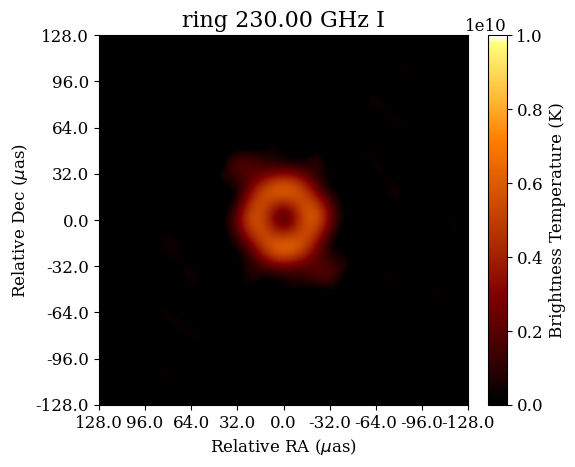

2023-10-18 15:16:41,140 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:41,141 INFO Display              :: Penalty--> 502.54595678064214
2023-10-18 15:16:41,283 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:41,285 INFO Display              :: Penalty--> 502.54595678064214
2023-10-18 15:16:41,439 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:41,440 INFO Display              :: Penalty--> 502.54595678064214
2023-10-18 15:16:41,588 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:41,590 INFO Display              :: Penalty--> 502.54595678064214
2023-10-18 15:16:41,728 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:41,730 INFO Display              :: Penalty--> 502.5153129472876
2023-10-18 15:16:41,887 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:41,889 INFO Display              :: Penalty--> 502.5153129472876
2023-10-18 15:16:42,024 INFO CountIterations      :: iteration = 7 / 25


2997.6747104465603
Data Fidelity:  6.7302810135606785


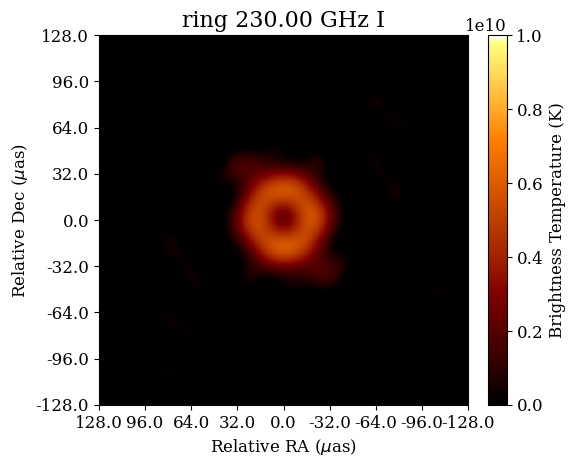

2023-10-18 15:16:45,111 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:45,113 INFO Display              :: Penalty--> 502.1858923166757
2023-10-18 15:16:45,247 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:45,248 INFO Display              :: Penalty--> 502.1858923166757
2023-10-18 15:16:45,383 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:45,384 INFO Display              :: Penalty--> 502.1858923166757
2023-10-18 15:16:45,516 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:45,517 INFO Display              :: Penalty--> 502.02041619451046
2023-10-18 15:16:45,655 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:45,657 INFO Display              :: Penalty--> 501.85494007234524
2023-10-18 15:16:45,796 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:45,797 INFO Display              :: Penalty--> 501.85494007234524
2023-10-18 15:16:45,948 INFO CountIterations      :: iteration = 7 / 25
2

2997.7216320503094
Data Fidelity:  6.589332496074378


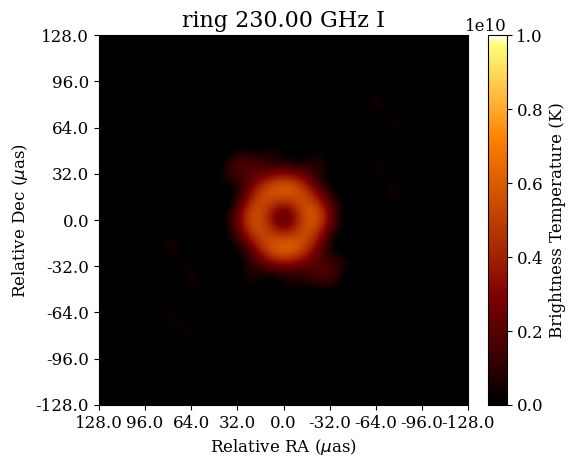

2023-10-18 15:16:49,130 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:49,131 INFO Display              :: Penalty--> 501.6603517305439
2023-10-18 15:16:49,281 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:49,283 INFO Display              :: Penalty--> 501.6603517305439
2023-10-18 15:16:49,442 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:49,444 INFO Display              :: Penalty--> 501.6603517305439
2023-10-18 15:16:49,577 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:49,580 INFO Display              :: Penalty--> 501.6603517305439
2023-10-18 15:16:49,714 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:49,716 INFO Display              :: Penalty--> 501.6603517305439
2023-10-18 15:16:49,874 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:49,876 INFO Display              :: Penalty--> 501.6603517305439
2023-10-18 15:16:50,031 INFO CountIterations      :: iteration = 7 / 25
2023

2997.8742471955875
Data Fidelity:  6.45802709822075


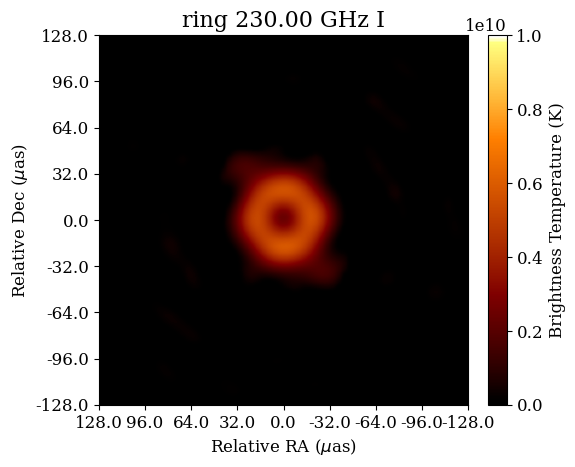

2023-10-18 15:16:53,276 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:53,277 INFO Display              :: Penalty--> 501.32939948621345
2023-10-18 15:16:53,432 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:53,434 INFO Display              :: Penalty--> 501.3186741445394
2023-10-18 15:16:53,570 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:53,572 INFO Display              :: Penalty--> 501.3186741445394
2023-10-18 15:16:53,703 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:53,705 INFO Display              :: Penalty--> 501.3186741445394
2023-10-18 15:16:53,840 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:53,841 INFO Display              :: Penalty--> 501.30794880286527
2023-10-18 15:16:53,997 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:53,999 INFO Display              :: Penalty--> 501.2972234611912
2023-10-18 15:16:54,153 INFO CountIterations      :: iteration = 7 / 25
20

2997.8718430506456
Data Fidelity:  6.340528128038094


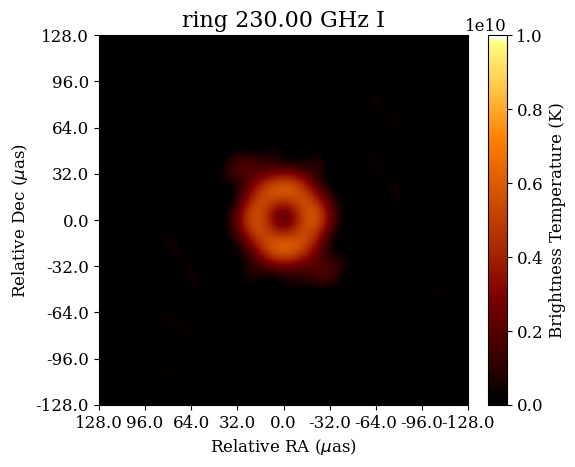

2023-10-18 15:16:57,367 INFO CountIterations      :: iteration = 1 / 25
2023-10-18 15:16:57,368 INFO Display              :: Penalty--> 501.2665796278367
2023-10-18 15:16:57,505 INFO CountIterations      :: iteration = 2 / 25
2023-10-18 15:16:57,507 INFO Display              :: Penalty--> 501.2665796278367
2023-10-18 15:16:57,646 INFO CountIterations      :: iteration = 3 / 25
2023-10-18 15:16:57,647 INFO Display              :: Penalty--> 501.2665796278367
2023-10-18 15:16:57,783 INFO CountIterations      :: iteration = 4 / 25
2023-10-18 15:16:57,785 INFO Display              :: Penalty--> 501.2665796278367
2023-10-18 15:16:57,930 INFO CountIterations      :: iteration = 5 / 25
2023-10-18 15:16:57,932 INFO Display              :: Penalty--> 501.2665796278367
2023-10-18 15:16:58,068 INFO CountIterations      :: iteration = 6 / 25
2023-10-18 15:16:58,069 INFO Display              :: Penalty--> 501.2665796278367
2023-10-18 15:16:58,206 INFO CountIterations      :: iteration = 7 / 25
2023

2997.935153210183
Data Fidelity:  6.227755390877849


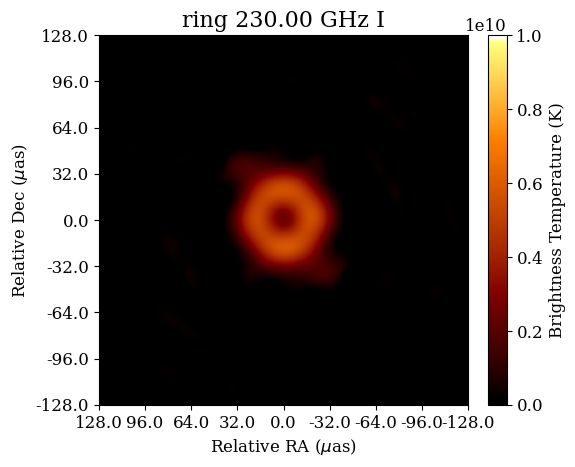

In [7]:
tau = 1

for i in range(3):
    #blur image to help global convergence
    img = img.blur_circ(res)
    data = handler.convert.ehtim_to_numpy(img)/rescaling

    #run mminimization
    wtfcts, img = handler.second_round_minimization(img.copy(), alpha, tau, maxiter=50, display=True)

    reco = handler.op(wtfcts)
    img = handler.wrapper.formatoutput(np.maximum(0, reco))


During the hard-threshold forward-backward splitting iterations of DoG-HiT effectively a mutliresolution support is computed, i.e. a set of all wavelet coefficients that are statistically significant to represent the information in the image. The multiresolution support is computed by the command handler.find_projection and stored as a projection operator handler.coordinate_proj. Note that handler.find_projection is called automatically internally when the last imaging round was done with the shortened handler.second_round_minimization command. 

The multiresolution support could be used to refine the reconstruction result. We minimize the data fidelity term specified by "data_term" without penalization by a gradient descent method. We have seen in tutorial 2 that this gives rise to spurious image artifacts. However, this time we only vary the wavelet coefficients in the multiresolution support (i.e. only the significant ones) which suppresses all possible artifacts during imaging.

The multiresolution support constrained gradient descent algorithm is done by the command handler.third_round. The stepsize parameter tau is found automatically by checkijgn convergence, only a start value has to be provided. Indeed, the procedure is converging (decreasing data fidelity) and improves the reconstruction.

In [8]:
wtfcts, img, tau = handler.third_round(wtfcts, data_term, tau=10, maxit=1000)

2023-10-18 15:17:16,113 INFO CountIterations      :: iteration = 1 / 5
2023-10-18 15:17:16,201 INFO Display              :: Data Fidelity--> 35.83512870136161
2023-10-18 15:17:16,378 INFO CountIterations      :: iteration = 2 / 5
2023-10-18 15:17:16,461 INFO Display              :: Data Fidelity--> 383.2097768048231
2023-10-18 15:17:16,637 INFO CountIterations      :: iteration = 3 / 5
2023-10-18 15:17:16,725 INFO Display              :: Data Fidelity--> 15855.972062502506
2023-10-18 15:17:16,908 INFO CountIterations      :: iteration = 4 / 5
2023-10-18 15:17:16,990 INFO Display              :: Data Fidelity--> 4760.98098433142
2023-10-18 15:17:17,166 INFO CountIterations      :: iteration = 5 / 5
2023-10-18 15:17:17,167 INFO CombineRules         :: Rule CountIterations(max_iterations=5) triggered.
2023-10-18 15:17:17,168 INFO Gradient_Descent     :: Stopping rule triggered.
2023-10-18 15:17:17,440 INFO CountIterations      :: iteration = 1 / 5


Stepsize to big, try to run with smaller stepsize


2023-10-18 15:17:17,529 INFO Display              :: Data Fidelity--> 28.01617158281015
2023-10-18 15:17:17,703 INFO CountIterations      :: iteration = 2 / 5
2023-10-18 15:17:17,785 INFO Display              :: Data Fidelity--> 159.6710022408104
2023-10-18 15:17:17,958 INFO CountIterations      :: iteration = 3 / 5
2023-10-18 15:17:18,039 INFO Display              :: Data Fidelity--> 7233.743494348117
2023-10-18 15:17:18,212 INFO CountIterations      :: iteration = 4 / 5
2023-10-18 15:17:18,292 INFO Display              :: Data Fidelity--> 4230.481903592462
2023-10-18 15:17:18,464 INFO CountIterations      :: iteration = 5 / 5
2023-10-18 15:17:18,465 INFO CombineRules         :: Rule CountIterations(max_iterations=5) triggered.
2023-10-18 15:17:18,466 INFO Gradient_Descent     :: Stopping rule triggered.
2023-10-18 15:17:18,735 INFO CountIterations      :: iteration = 1 / 5


Stepsize to big, try to run with smaller stepsize


2023-10-18 15:17:18,819 INFO Display              :: Data Fidelity--> 26.225610141177334
2023-10-18 15:17:19,000 INFO CountIterations      :: iteration = 2 / 5
2023-10-18 15:17:19,080 INFO Display              :: Data Fidelity--> 44.39140085816724
2023-10-18 15:17:19,254 INFO CountIterations      :: iteration = 3 / 5
2023-10-18 15:17:19,334 INFO Display              :: Data Fidelity--> 345.69499449686873
2023-10-18 15:17:19,507 INFO CountIterations      :: iteration = 4 / 5
2023-10-18 15:17:19,587 INFO Display              :: Data Fidelity--> 147.955271369638
2023-10-18 15:17:19,761 INFO CountIterations      :: iteration = 5 / 5
2023-10-18 15:17:19,762 INFO CombineRules         :: Rule CountIterations(max_iterations=5) triggered.
2023-10-18 15:17:19,763 INFO Gradient_Descent     :: Stopping rule triggered.


Stepsize to big, try to run with smaller stepsize


2023-10-18 15:17:20,069 INFO CountIterations      :: iteration = 1 / 5
2023-10-18 15:17:20,151 INFO Display              :: Data Fidelity--> 26.151189707296282
2023-10-18 15:17:20,325 INFO CountIterations      :: iteration = 2 / 5
2023-10-18 15:17:20,404 INFO Display              :: Data Fidelity--> 26.237721716319694
2023-10-18 15:17:20,577 INFO CountIterations      :: iteration = 3 / 5
2023-10-18 15:17:20,657 INFO Display              :: Data Fidelity--> 32.718421824809354
2023-10-18 15:17:20,834 INFO CountIterations      :: iteration = 4 / 5
2023-10-18 15:17:20,930 INFO Display              :: Data Fidelity--> 68.86683715738272
2023-10-18 15:17:21,125 INFO CountIterations      :: iteration = 5 / 5
2023-10-18 15:17:21,126 INFO CombineRules         :: Rule CountIterations(max_iterations=5) triggered.
2023-10-18 15:17:21,127 INFO Gradient_Descent     :: Stopping rule triggered.
2023-10-18 15:17:21,409 INFO CountIterations      :: iteration = 1 / 5


Stepsize to big, try to run with smaller stepsize


2023-10-18 15:17:21,499 INFO Display              :: Data Fidelity--> 26.391380932586518
2023-10-18 15:17:21,674 INFO CountIterations      :: iteration = 2 / 5
2023-10-18 15:17:21,755 INFO Display              :: Data Fidelity--> 26.041823795832208
2023-10-18 15:17:21,930 INFO CountIterations      :: iteration = 3 / 5
2023-10-18 15:17:22,009 INFO Display              :: Data Fidelity--> 25.74102174815259
2023-10-18 15:17:22,182 INFO CountIterations      :: iteration = 4 / 5
2023-10-18 15:17:22,262 INFO Display              :: Data Fidelity--> 25.460811035022115
2023-10-18 15:17:22,436 INFO CountIterations      :: iteration = 5 / 5
2023-10-18 15:17:22,437 INFO CombineRules         :: Rule CountIterations(max_iterations=5) triggered.
2023-10-18 15:17:22,438 INFO Gradient_Descent     :: Stopping rule triggered.
2023-10-18 15:17:22,710 INFO CountIterations      :: iteration = 1 / 5
2023-10-18 15:17:22,791 INFO Display              :: Data Fidelity--> 24.942621562285392
2023-10-18 15:17:22,

2022-07-27 16:48:08,686 INFO Display              :: Data Fidelity--> 14.329830252355455
2022-07-27 16:48:08,852 INFO CountIterations      :: iteration = 81 / 1000
2022-07-27 16:48:08,940 INFO Display              :: Data Fidelity--> 14.240855483632796
2022-07-27 16:48:09,104 INFO CountIterations      :: iteration = 82 / 1000
2022-07-27 16:48:09,190 INFO Display              :: Data Fidelity--> 14.152756244120358
2022-07-27 16:48:09,343 INFO CountIterations      :: iteration = 83 / 1000
2022-07-27 16:48:09,413 INFO Display              :: Data Fidelity--> 14.065520222412662
2022-07-27 16:48:09,585 INFO CountIterations      :: iteration = 84 / 1000
2022-07-27 16:48:09,661 INFO Display              :: Data Fidelity--> 13.97913535560778
2022-07-27 16:48:09,827 INFO CountIterations      :: iteration = 85 / 1000
2022-07-27 16:48:09,895 INFO Display              :: Data Fidelity--> 13.893589822148186
2022-07-27 16:48:10,071 INFO CountIterations      :: iteration = 86 / 1000
2022-07-27 16:48:

2022-07-27 16:48:20,740 INFO Display              :: Data Fidelity--> 10.757786403258255
2022-07-27 16:48:20,901 INFO CountIterations      :: iteration = 131 / 1000
2022-07-27 16:48:21,003 INFO Display              :: Data Fidelity--> 10.701163032575371
2022-07-27 16:48:21,225 INFO CountIterations      :: iteration = 132 / 1000
2022-07-27 16:48:21,314 INFO Display              :: Data Fidelity--> 10.645008070853848
2022-07-27 16:48:21,499 INFO CountIterations      :: iteration = 133 / 1000
2022-07-27 16:48:21,567 INFO Display              :: Data Fidelity--> 10.589316308351053
2022-07-27 16:48:21,739 INFO CountIterations      :: iteration = 134 / 1000
2022-07-27 16:48:21,810 INFO Display              :: Data Fidelity--> 10.534082611948234
2022-07-27 16:48:22,001 INFO CountIterations      :: iteration = 135 / 1000
2022-07-27 16:48:22,074 INFO Display              :: Data Fidelity--> 10.479301923681367
2022-07-27 16:48:22,259 INFO CountIterations      :: iteration = 136 / 1000
2022-07-27

2022-07-27 16:48:33,014 INFO Display              :: Data Fidelity--> 8.413324541706045
2022-07-27 16:48:33,169 INFO CountIterations      :: iteration = 181 / 1000
2022-07-27 16:48:33,249 INFO Display              :: Data Fidelity--> 8.374965554526195
2022-07-27 16:48:33,401 INFO CountIterations      :: iteration = 182 / 1000
2022-07-27 16:48:33,476 INFO Display              :: Data Fidelity--> 8.33688605155126
2022-07-27 16:48:33,638 INFO CountIterations      :: iteration = 183 / 1000
2022-07-27 16:48:33,704 INFO Display              :: Data Fidelity--> 8.299083373172834
2022-07-27 16:48:33,872 INFO CountIterations      :: iteration = 184 / 1000
2022-07-27 16:48:33,944 INFO Display              :: Data Fidelity--> 8.261554892186433
2022-07-27 16:48:34,112 INFO CountIterations      :: iteration = 185 / 1000
2022-07-27 16:48:34,188 INFO Display              :: Data Fidelity--> 8.224298013294955
2022-07-27 16:48:34,359 INFO CountIterations      :: iteration = 186 / 1000
2022-07-27 16:48:

2022-07-27 16:48:45,078 INFO Display              :: Data Fidelity--> 6.792155528101614
2022-07-27 16:48:45,241 INFO CountIterations      :: iteration = 231 / 1000
2022-07-27 16:48:45,318 INFO Display              :: Data Fidelity--> 6.765050408844341
2022-07-27 16:48:45,490 INFO CountIterations      :: iteration = 232 / 1000
2022-07-27 16:48:45,566 INFO Display              :: Data Fidelity--> 6.738123534422947
2022-07-27 16:48:45,739 INFO CountIterations      :: iteration = 233 / 1000
2022-07-27 16:48:45,818 INFO Display              :: Data Fidelity--> 6.711373401271392
2022-07-27 16:48:45,985 INFO CountIterations      :: iteration = 234 / 1000
2022-07-27 16:48:46,054 INFO Display              :: Data Fidelity--> 6.684798521710003
2022-07-27 16:48:46,235 INFO CountIterations      :: iteration = 235 / 1000
2022-07-27 16:48:46,315 INFO Display              :: Data Fidelity--> 6.658397423737473
2022-07-27 16:48:46,481 INFO CountIterations      :: iteration = 236 / 1000
2022-07-27 16:48

2022-07-27 16:48:57,102 INFO Display              :: Data Fidelity--> 5.629044617902677
2022-07-27 16:48:57,271 INFO CountIterations      :: iteration = 281 / 1000
2022-07-27 16:48:57,343 INFO Display              :: Data Fidelity--> 5.609279489970158
2022-07-27 16:48:57,518 INFO CountIterations      :: iteration = 282 / 1000
2022-07-27 16:48:57,593 INFO Display              :: Data Fidelity--> 5.5896334616321806
2022-07-27 16:48:57,741 INFO CountIterations      :: iteration = 283 / 1000
2022-07-27 16:48:57,815 INFO Display              :: Data Fidelity--> 5.5701056217700105
2022-07-27 16:48:57,978 INFO CountIterations      :: iteration = 284 / 1000
2022-07-27 16:48:58,052 INFO Display              :: Data Fidelity--> 5.55069506783598
2022-07-27 16:48:58,219 INFO CountIterations      :: iteration = 285 / 1000
2022-07-27 16:48:58,302 INFO Display              :: Data Fidelity--> 5.53140090575492
2022-07-27 16:48:58,488 INFO CountIterations      :: iteration = 286 / 1000
2022-07-27 16:48

2022-07-27 16:49:09,646 INFO Display              :: Data Fidelity--> 4.770612151517398
2022-07-27 16:49:09,797 INFO CountIterations      :: iteration = 331 / 1000
2022-07-27 16:49:09,867 INFO Display              :: Data Fidelity--> 4.755833763051322
2022-07-27 16:49:10,023 INFO CountIterations      :: iteration = 332 / 1000
2022-07-27 16:49:10,097 INFO Display              :: Data Fidelity--> 4.741137759884024
2022-07-27 16:49:10,267 INFO CountIterations      :: iteration = 333 / 1000
2022-07-27 16:49:10,365 INFO Display              :: Data Fidelity--> 4.726523561150912
2022-07-27 16:49:10,530 INFO CountIterations      :: iteration = 334 / 1000
2022-07-27 16:49:10,615 INFO Display              :: Data Fidelity--> 4.711990590948218
2022-07-27 16:49:10,805 INFO CountIterations      :: iteration = 335 / 1000
2022-07-27 16:49:10,885 INFO Display              :: Data Fidelity--> 4.697538278281685
2022-07-27 16:49:11,060 INFO CountIterations      :: iteration = 336 / 1000
2022-07-27 16:49

2022-07-27 16:49:21,807 INFO Display              :: Data Fidelity--> 4.122273197562571
2022-07-27 16:49:21,986 INFO CountIterations      :: iteration = 381 / 1000
2022-07-27 16:49:22,066 INFO Display              :: Data Fidelity--> 4.110989186744988
2022-07-27 16:49:22,263 INFO CountIterations      :: iteration = 382 / 1000
2022-07-27 16:49:22,343 INFO Display              :: Data Fidelity--> 4.099763721713522
2022-07-27 16:49:22,528 INFO CountIterations      :: iteration = 383 / 1000
2022-07-27 16:49:22,604 INFO Display              :: Data Fidelity--> 4.088596417593743
2022-07-27 16:49:22,780 INFO CountIterations      :: iteration = 384 / 1000
2022-07-27 16:49:22,860 INFO Display              :: Data Fidelity--> 4.077486892540195
2022-07-27 16:49:23,035 INFO CountIterations      :: iteration = 385 / 1000
2022-07-27 16:49:23,114 INFO Display              :: Data Fidelity--> 4.066434767707854
2022-07-27 16:49:23,289 INFO CountIterations      :: iteration = 386 / 1000
2022-07-27 16:49

2022-07-27 16:49:34,294 INFO Display              :: Data Fidelity--> 3.6228897736717762
2022-07-27 16:49:34,445 INFO CountIterations      :: iteration = 431 / 1000
2022-07-27 16:49:34,527 INFO Display              :: Data Fidelity--> 3.6141150212759436
2022-07-27 16:49:34,703 INFO CountIterations      :: iteration = 432 / 1000
2022-07-27 16:49:34,773 INFO Display              :: Data Fidelity--> 3.605382790010526
2022-07-27 16:49:34,930 INFO CountIterations      :: iteration = 433 / 1000
2022-07-27 16:49:35,001 INFO Display              :: Data Fidelity--> 3.59669281703696
2022-07-27 16:49:35,165 INFO CountIterations      :: iteration = 434 / 1000
2022-07-27 16:49:35,236 INFO Display              :: Data Fidelity--> 3.5880448414448116
2022-07-27 16:49:35,384 INFO CountIterations      :: iteration = 435 / 1000
2022-07-27 16:49:35,461 INFO Display              :: Data Fidelity--> 3.5794386042351363
2022-07-27 16:49:35,620 INFO CountIterations      :: iteration = 436 / 1000
2022-07-27 16

2022-07-27 16:49:46,158 INFO Display              :: Data Fidelity--> 3.2315001773365317
2022-07-27 16:49:46,318 INFO CountIterations      :: iteration = 481 / 1000
2022-07-27 16:49:46,393 INFO Display              :: Data Fidelity--> 3.22456379036415
2022-07-27 16:49:46,559 INFO CountIterations      :: iteration = 482 / 1000
2022-07-27 16:49:46,637 INFO Display              :: Data Fidelity--> 3.2176588533324773
2022-07-27 16:49:46,821 INFO CountIterations      :: iteration = 483 / 1000
2022-07-27 16:49:46,890 INFO Display              :: Data Fidelity--> 3.210785182318733
2022-07-27 16:49:47,061 INFO CountIterations      :: iteration = 484 / 1000
2022-07-27 16:49:47,124 INFO Display              :: Data Fidelity--> 3.2039425946693756
2022-07-27 16:49:47,287 INFO CountIterations      :: iteration = 485 / 1000
2022-07-27 16:49:47,359 INFO Display              :: Data Fidelity--> 3.19713090898943
2022-07-27 16:49:47,517 INFO CountIterations      :: iteration = 486 / 1000
2022-07-27 16:4

2022-07-27 16:49:58,213 INFO Display              :: Data Fidelity--> 2.919874165590431
2022-07-27 16:49:58,375 INFO CountIterations      :: iteration = 531 / 1000
2022-07-27 16:49:58,451 INFO Display              :: Data Fidelity--> 2.914307679055477
2022-07-27 16:49:58,622 INFO CountIterations      :: iteration = 532 / 1000
2022-07-27 16:49:58,691 INFO Display              :: Data Fidelity--> 2.9087648207649712
2022-07-27 16:49:58,869 INFO CountIterations      :: iteration = 533 / 1000
2022-07-27 16:49:58,941 INFO Display              :: Data Fidelity--> 2.9032454593980295
2022-07-27 16:49:59,102 INFO CountIterations      :: iteration = 534 / 1000
2022-07-27 16:49:59,180 INFO Display              :: Data Fidelity--> 2.897749464491658
2022-07-27 16:49:59,347 INFO CountIterations      :: iteration = 535 / 1000
2022-07-27 16:49:59,419 INFO Display              :: Data Fidelity--> 2.892276706433886
2022-07-27 16:49:59,587 INFO CountIterations      :: iteration = 536 / 1000
2022-07-27 16:

2022-07-27 16:50:12,175 INFO Display              :: Data Fidelity--> 2.668105109151249
2022-07-27 16:50:12,337 INFO CountIterations      :: iteration = 581 / 1000
2022-07-27 16:50:12,408 INFO Display              :: Data Fidelity--> 2.663574586912723
2022-07-27 16:50:12,570 INFO CountIterations      :: iteration = 582 / 1000
2022-07-27 16:50:12,653 INFO Display              :: Data Fidelity--> 2.659062061529793
2022-07-27 16:50:12,814 INFO CountIterations      :: iteration = 583 / 1000
2022-07-27 16:50:12,883 INFO Display              :: Data Fidelity--> 2.654567437548448
2022-07-27 16:50:13,050 INFO CountIterations      :: iteration = 584 / 1000
2022-07-27 16:50:13,117 INFO Display              :: Data Fidelity--> 2.6500906201038874
2022-07-27 16:50:13,273 INFO CountIterations      :: iteration = 585 / 1000
2022-07-27 16:50:13,343 INFO Display              :: Data Fidelity--> 2.6456315149160066
2022-07-27 16:50:13,502 INFO CountIterations      :: iteration = 586 / 1000
2022-07-27 16:

2022-07-27 16:50:24,176 INFO Display              :: Data Fidelity--> 2.4618809813632714
2022-07-27 16:50:24,331 INFO CountIterations      :: iteration = 631 / 1000
2022-07-27 16:50:24,409 INFO Display              :: Data Fidelity--> 2.4581439539935785
2022-07-27 16:50:24,565 INFO CountIterations      :: iteration = 632 / 1000
2022-07-27 16:50:24,640 INFO Display              :: Data Fidelity--> 2.454420791426293
2022-07-27 16:50:24,827 INFO CountIterations      :: iteration = 633 / 1000
2022-07-27 16:50:24,903 INFO Display              :: Data Fidelity--> 2.4507114226891447
2022-07-27 16:50:25,076 INFO CountIterations      :: iteration = 634 / 1000
2022-07-27 16:50:25,145 INFO Display              :: Data Fidelity--> 2.4470157772015524
2022-07-27 16:50:25,295 INFO CountIterations      :: iteration = 635 / 1000
2022-07-27 16:50:25,368 INFO Display              :: Data Fidelity--> 2.4433337847709886
2022-07-27 16:50:25,528 INFO CountIterations      :: iteration = 636 / 1000
2022-07-27 

2022-07-27 16:50:38,352 INFO Display              :: Data Fidelity--> 2.290704685366717
2022-07-27 16:50:38,533 INFO CountIterations      :: iteration = 681 / 1000
2022-07-27 16:50:38,622 INFO Display              :: Data Fidelity--> 2.2875806959126495
2022-07-27 16:50:38,825 INFO CountIterations      :: iteration = 682 / 1000
2022-07-27 16:50:38,916 INFO Display              :: Data Fidelity--> 2.28446741972624
2022-07-27 16:50:39,178 INFO CountIterations      :: iteration = 683 / 1000
2022-07-27 16:50:39,262 INFO Display              :: Data Fidelity--> 2.281364799859439
2022-07-27 16:50:39,452 INFO CountIterations      :: iteration = 684 / 1000
2022-07-27 16:50:39,582 INFO Display              :: Data Fidelity--> 2.278272779483323
2022-07-27 16:50:39,809 INFO CountIterations      :: iteration = 685 / 1000
2022-07-27 16:50:39,884 INFO Display              :: Data Fidelity--> 2.275191301877852
2022-07-27 16:50:40,242 INFO CountIterations      :: iteration = 686 / 1000
2022-07-27 16:50

2022-07-27 16:50:51,972 INFO Display              :: Data Fidelity--> 2.1465071190555896
2022-07-27 16:50:52,126 INFO CountIterations      :: iteration = 731 / 1000
2022-07-27 16:50:52,209 INFO Display              :: Data Fidelity--> 2.143847277594122
2022-07-27 16:50:52,353 INFO CountIterations      :: iteration = 732 / 1000
2022-07-27 16:50:52,432 INFO Display              :: Data Fidelity--> 2.1411950205780492
2022-07-27 16:50:52,592 INFO CountIterations      :: iteration = 733 / 1000
2022-07-27 16:50:52,664 INFO Display              :: Data Fidelity--> 2.1385502588231073
2022-07-27 16:50:52,837 INFO CountIterations      :: iteration = 734 / 1000
2022-07-27 16:50:52,908 INFO Display              :: Data Fidelity--> 2.135912900201365
2022-07-27 16:50:53,080 INFO CountIterations      :: iteration = 735 / 1000
2022-07-27 16:50:53,170 INFO Display              :: Data Fidelity--> 2.13328284939862
2022-07-27 16:50:53,347 INFO CountIterations      :: iteration = 736 / 1000
2022-07-27 16:

2022-07-27 16:51:04,294 INFO Display              :: Data Fidelity--> 2.019663675972303
2022-07-27 16:51:04,479 INFO CountIterations      :: iteration = 781 / 1000
2022-07-27 16:51:04,546 INFO Display              :: Data Fidelity--> 2.0171678804255313
2022-07-27 16:51:04,714 INFO CountIterations      :: iteration = 782 / 1000
2022-07-27 16:51:04,795 INFO Display              :: Data Fidelity--> 2.0146751566495498
2022-07-27 16:51:04,951 INFO CountIterations      :: iteration = 783 / 1000
2022-07-27 16:51:05,019 INFO Display              :: Data Fidelity--> 2.0121866060524116
2022-07-27 16:51:05,189 INFO CountIterations      :: iteration = 784 / 1000
2022-07-27 16:51:05,266 INFO Display              :: Data Fidelity--> 2.0097033666897293
2022-07-27 16:51:05,447 INFO CountIterations      :: iteration = 785 / 1000
2022-07-27 16:51:05,520 INFO Display              :: Data Fidelity--> 2.0072265768442072
2022-07-27 16:51:05,700 INFO CountIterations      :: iteration = 786 / 1000
2022-07-27 

2022-07-27 16:51:17,016 INFO Display              :: Data Fidelity--> 1.9070493260140946
2022-07-27 16:51:17,184 INFO CountIterations      :: iteration = 831 / 1000
2022-07-27 16:51:17,273 INFO Display              :: Data Fidelity--> 1.9050382040919158
2022-07-27 16:51:17,430 INFO CountIterations      :: iteration = 832 / 1000
2022-07-27 16:51:17,499 INFO Display              :: Data Fidelity--> 1.9030343523818098
2022-07-27 16:51:17,670 INFO CountIterations      :: iteration = 833 / 1000
2022-07-27 16:51:17,737 INFO Display              :: Data Fidelity--> 1.9010376878240443
2022-07-27 16:51:17,893 INFO CountIterations      :: iteration = 834 / 1000
2022-07-27 16:51:17,968 INFO Display              :: Data Fidelity--> 1.899048130371125
2022-07-27 16:51:18,135 INFO CountIterations      :: iteration = 835 / 1000
2022-07-27 16:51:18,208 INFO Display              :: Data Fidelity--> 1.8970656028170072
2022-07-27 16:51:18,371 INFO CountIterations      :: iteration = 836 / 1000
2022-07-27 

2022-07-27 16:51:29,105 INFO Display              :: Data Fidelity--> 1.8142248792027482
2022-07-27 16:51:29,273 INFO CountIterations      :: iteration = 881 / 1000
2022-07-27 16:51:29,347 INFO Display              :: Data Fidelity--> 1.8125104844160576
2022-07-27 16:51:29,512 INFO CountIterations      :: iteration = 882 / 1000
2022-07-27 16:51:29,600 INFO Display              :: Data Fidelity--> 1.8108010731991206
2022-07-27 16:51:29,762 INFO CountIterations      :: iteration = 883 / 1000
2022-07-27 16:51:29,834 INFO Display              :: Data Fidelity--> 1.8090966185358117
2022-07-27 16:51:30,009 INFO CountIterations      :: iteration = 884 / 1000
2022-07-27 16:51:30,073 INFO Display              :: Data Fidelity--> 1.8073970937531172
2022-07-27 16:51:30,250 INFO CountIterations      :: iteration = 885 / 1000
2022-07-27 16:51:30,330 INFO Display              :: Data Fidelity--> 1.805702472510982
2022-07-27 16:51:30,480 INFO CountIterations      :: iteration = 886 / 1000
2022-07-27 

2022-07-27 16:51:41,199 INFO Display              :: Data Fidelity--> 1.7341434138452523
2022-07-27 16:51:41,363 INFO CountIterations      :: iteration = 931 / 1000
2022-07-27 16:51:41,445 INFO Display              :: Data Fidelity--> 1.7326501725753176
2022-07-27 16:51:41,603 INFO CountIterations      :: iteration = 932 / 1000
2022-07-27 16:51:41,675 INFO Display              :: Data Fidelity--> 1.731160854467547
2022-07-27 16:51:41,838 INFO CountIterations      :: iteration = 933 / 1000
2022-07-27 16:51:41,908 INFO Display              :: Data Fidelity--> 1.729675442535058
2022-07-27 16:51:42,075 INFO CountIterations      :: iteration = 934 / 1000
2022-07-27 16:51:42,145 INFO Display              :: Data Fidelity--> 1.7281939199090979
2022-07-27 16:51:42,311 INFO CountIterations      :: iteration = 935 / 1000
2022-07-27 16:51:42,381 INFO Display              :: Data Fidelity--> 1.7267162698374103
2022-07-27 16:51:42,541 INFO CountIterations      :: iteration = 936 / 1000
2022-07-27 1

2022-07-27 16:51:53,425 INFO Display              :: Data Fidelity--> 1.663978467741993
2022-07-27 16:51:53,577 INFO CountIterations      :: iteration = 981 / 1000
2022-07-27 16:51:53,655 INFO Display              :: Data Fidelity--> 1.6626625745415755
2022-07-27 16:51:53,821 INFO CountIterations      :: iteration = 982 / 1000
2022-07-27 16:51:53,895 INFO Display              :: Data Fidelity--> 1.661349874328417
2022-07-27 16:51:54,063 INFO CountIterations      :: iteration = 983 / 1000
2022-07-27 16:51:54,131 INFO Display              :: Data Fidelity--> 1.6600403545574896
2022-07-27 16:51:54,300 INFO CountIterations      :: iteration = 984 / 1000
2022-07-27 16:51:54,372 INFO Display              :: Data Fidelity--> 1.6587340027514903
2022-07-27 16:51:54,562 INFO CountIterations      :: iteration = 985 / 1000
2022-07-27 16:51:54,633 INFO Display              :: Data Fidelity--> 1.6574308065000247
2022-07-27 16:51:54,800 INFO CountIterations      :: iteration = 986 / 1000
2022-07-27 1

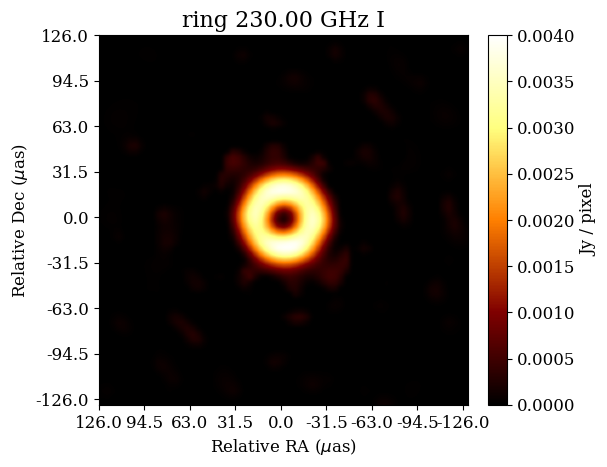

Final data fidelity term:  0.8093332201838539


In [9]:
img.display(cbar_lims=[0,0.004])

#print score
print("Final data fidelity term: ", handler.data_fidelity_closure(wtfcts))